In [1]:
"""Entry point to evolving the neural network. Start here."""
import logging
from optimizer import Optimizer
from tqdm import tqdm

# Setup logging.
logging.basicConfig(
    format='%(asctime)s - %(levelname)s - %(message)s',
    datefmt='%m/%d/%Y %I:%M:%S %p',
    level=logging.DEBUG,
    filename='log.txt'
)

INFO:tensorflow:Enabling eager execution
INFO:tensorflow:Enabling v2 tensorshape
INFO:tensorflow:Enabling resource variables
INFO:tensorflow:Enabling tensor equality
INFO:tensorflow:Enabling control flow v2



In [2]:
def train_networks(networks):
    
    """Train each network.
    Args:
        networks (list): Current population of networks
        dataset (str): Dataset to use for training/evaluating
    """
    pbar = tqdm(total=len(networks))
    
    for network in networks:
        print(network.network)
        network.train()
        pbar.update(1)
        
    pbar.close()

In [3]:
def get_average_accuracy(networks):
    """Get the average accuracy for a group of networks.
    Args:
        networks (list): List of networks
    Returns:
        float: The average accuracy of a population of networks.
    """
    total_accuracy = 0
    for network in networks:
        total_accuracy += network.accuracy

    return total_accuracy / len(networks)

In [4]:
def generate(generations, population, nn_param_choices):
    """Generate a network with the genetic algorithm.
    Args:
        generations (int): Number of times to evole the population
        population (int): Number of networks in each generation
        nn_param_choices (dict): Parameter choices for networks
        dataset (str): Dataset to use for training/evaluating
    """
    optimizer = Optimizer(nn_param_choices)
    networks = optimizer.create_population(population)

    # Evolve the generation.
    for i in range(generations):
        logging.info("***Doing generation %d of %d***" %
                     (i + 1, generations))

        # Train and get accuracy for networks.
        train_networks(networks)

        # Get the average accuracy for this generation.
#         average_accuracy = get_average_accuracy(networks)
        average_accuracy = optimizer.grade_overall(networks)
        top_five_average_accuracy = optimizer.grade_top_five(networks)
        
        # Print out the average accuracy each generation.
        logging.info("Generation overall average: %.2f%%" % (average_accuracy * 100))
        logging.info("Generation top five average: %.2f%%" % (top_five_average_accuracy * 100))
        logging.info('-'*80)

        # Evolve, except on the last iteration.
        if i != generations - 1:
            # Do the evolution.
            networks = optimizer.evolve(networks)

    # Sort our final population.
    networks = sorted(networks, key=lambda x: x.accuracy, reverse=True)

    # Print out the top 5 networks.
    print_networks(networks[:5])
    
    return networks

In [5]:
def print_networks(networks):
    """Print a list of networks.
    Args:
        networks (list): The population of networks
    """
    logging.info('-'*80)
    for network in networks:
        network.print_network()

In [6]:
def main():
    """Evolve a network."""
    generations = 30  # Number of times to evole the population.
    population = 20  # Number of networks in each generation.
#     dataset = 'cifar10'

    nn_param_choices = {
        'window_size':[i for i in range(4,25)], 
        'batch_size':[i for i in range(1,21)], #一個月到半年
        'nb_neurons': [i for i in range(3, 41, 1)],
        'nb_layers': [i for i in range(1,11)],
        'optimizer': ['rmsprop', 'adam', 'sgd', 'adagrad',
                      'adadelta', 'adamax', 'nadam','ftrl']
    }

    logging.info("***Evolving %d generations with population %d***" %
                 (generations, population))

    networks = generate(generations, population, nn_param_choices)

    return networks

In [7]:
if __name__ == '__main__':
    networks = main()

  0%|          | 0/20 [00:00<?, ?it/s]

{'window_size': 20, 'batch_size': 6, 'nb_neurons': 5, 'nb_layers': 10, 'optimizer': 'rmsprop'}
Epoch: 0, Loss: 46282913.44, Accuracy_train: 18.80%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 1, Loss: 46888437.17, Accuracy_train: 18.53%, Accuracy_test: 7.61%
--------------------------------------------------
Epoch: 2, Loss: 46912599.83, Accuracy_train: 18.80%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 3, Loss: 46837327.65, Accuracy_train: 19.07%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 4, Loss: 46665704.01, Accuracy_train: 19.07%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 5, Loss: 46475780.91, Accuracy_train: 18.26%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 6, Loss: 46311087.31, Accuracy_train: 17.71%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 7, Loss: 46111562.83, A

  5%|▌         | 1/20 [50:56<16:07:46, 3056.13s/it]

Epoch: 299, Loss: 20135243.99, Accuracy_train: 20.98%, Accuracy_test: 8.70%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 29664022.19, Accuracy_train: 17.43%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 26794810.23, Accuracy_train: 14.48%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 2, Loss: 26231155.16, Accuracy_train: 18.77%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 3, Loss: 25879406.42, Accuracy_train: 23.06%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 4, Loss: 24947578.36, Accuracy_train: 24.40%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 5, Loss: 23307690.50, Accuracy_train: 23.59%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 6, Loss: 21142683.2

 10%|█         | 2/20 [1:03:10<8:27:02, 1690.12s/it]

Epoch: 299, Loss: 1393929.02, Accuracy_train: 61.93%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 17980582.17, Accuracy_train: 24.38%, Accuracy_test: 22.83%
--------------------------------------------------
Epoch: 1, Loss: 12012413.23, Accuracy_train: 27.40%, Accuracy_test: 30.43%
--------------------------------------------------
Epoch: 2, Loss: 9313013.45, Accuracy_train: 32.88%, Accuracy_test: 43.48%
--------------------------------------------------
Epoch: 3, Loss: 8182630.02, Accuracy_train: 35.07%, Accuracy_test: 44.57%
--------------------------------------------------
Epoch: 4, Loss: 5532111.92, Accuracy_train: 41.92%, Accuracy_test: 46.74%
--------------------------------------------------
Epoch: 5, Loss: 3894930.76, Accuracy_train: 47.12%, Accuracy_test: 48.91%
--------------------------------------------------
Epoch: 6, Loss: 3052630.74, 

 15%|█▌        | 3/20 [1:32:53<8:10:56, 1732.74s/it]

Epoch: 299, Loss: 41194.24, Accuracy_train: 100.00%, Accuracy_test: 42.39%
--------------------------------------------------
{'window_size': 19, 'batch_size': 19, 'nb_neurons': 39, 'nb_layers': 10, 'optimizer': 'sgd'}
Epoch: 0, Loss: 43079838.97, Accuracy_train: 13.04%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 1, Loss: 43100305.10, Accuracy_train: 12.50%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 2, Loss: 43132286.58, Accuracy_train: 12.23%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 3, Loss: 43184213.73, Accuracy_train: 11.41%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 4, Loss: 43270674.05, Accuracy_train: 11.68%, Accuracy_test: 16.30%
--------------------------------------------------
Epoch: 5, Loss: 43417425.10, Accuracy_train: 11.41%, Accuracy_test: 16.30%
--------------------------------------------------
Epoch: 6, Loss: 43670528.

 20%|██        | 4/20 [2:26:20<10:17:18, 2314.90s/it]

Epoch: 299, Loss: 6267296.70, Accuracy_train: 25.54%, Accuracy_test: 2.17%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 22400079.10, Accuracy_train: 21.51%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 1, Loss: 23683936.65, Accuracy_train: 15.32%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 2, Loss: 18769547.29, Accuracy_train: 18.55%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 3, Loss: 11896316.74, Accuracy_train: 26.88%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 4, Loss: 8301686.18, Accuracy_train: 31.99%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 5, Loss: 7267913.42, Accuracy_train: 35.48%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 6, Loss: 6461322.80,

 25%|██▌       | 5/20 [2:46:33<7:59:18, 1917.26s/it] 

Epoch: 299, Loss: 27466.38, Accuracy_train: 100.00%, Accuracy_test: 44.09%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19898679.82, Accuracy_train: 17.55%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 1, Loss: 14066293.60, Accuracy_train: 20.48%, Accuracy_test: 31.58%
--------------------------------------------------
Epoch: 2, Loss: 10333901.18, Accuracy_train: 23.14%, Accuracy_test: 37.89%
--------------------------------------------------
Epoch: 3, Loss: 7858887.22, Accuracy_train: 26.33%, Accuracy_test: 35.79%
--------------------------------------------------
Epoch: 4, Loss: 6211928.75, Accuracy_train: 30.05%, Accuracy_test: 37.89%
--------------------------------------------------
Epoch: 5, Loss: 5118468.77, Accuracy_train: 36.17%, Accuracy_test: 36.84%
--------------------------------------------------
Epoch: 6, Loss: 4393391.57

 30%|███       | 6/20 [2:57:50<5:48:58, 1495.59s/it]

Epoch: 299, Loss: 1598481.36, Accuracy_train: 64.89%, Accuracy_test: 43.16%
--------------------------------------------------
{'window_size': 9, 'batch_size': 19, 'nb_neurons': 17, 'nb_layers': 6, 'optimizer': 'adam'}
Epoch: 0, Loss: 34946284.99, Accuracy_train: 14.10%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 38600506.25, Accuracy_train: 13.30%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 40711575.71, Accuracy_train: 11.17%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 40219114.34, Accuracy_train: 11.70%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 41123047.11, Accuracy_train: 11.70%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 41111413.91, Accuracy_train: 7.98%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 32228013.6

 35%|███▌      | 7/20 [3:21:31<5:18:48, 1471.45s/it]

Epoch: 299, Loss: 17460.17, Accuracy_train: 100.00%, Accuracy_test: 12.77%
--------------------------------------------------
{'window_size': 13, 'batch_size': 14, 'nb_neurons': 24, 'nb_layers': 9, 'optimizer': 'adam'}
Epoch: 0, Loss: 40490839.05, Accuracy_train: 11.56%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 42390205.99, Accuracy_train: 12.90%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 43284309.79, Accuracy_train: 11.56%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 43691365.45, Accuracy_train: 11.56%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 43024383.06, Accuracy_train: 11.29%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 42374651.22, Accuracy_train: 9.41%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 6, Loss: 53155353.0

 40%|████      | 8/20 [3:59:24<5:45:18, 1726.54s/it]

Epoch: 299, Loss: 43585952.31, Accuracy_train: 11.02%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 7, 'batch_size': 17, 'nb_neurons': 12, 'nb_layers': 5, 'optimizer': 'adam'}
Epoch: 0, Loss: 34149539.19, Accuracy_train: 14.06%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 1, Loss: 36670432.98, Accuracy_train: 13.00%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 2, Loss: 37613031.54, Accuracy_train: 12.73%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 3, Loss: 37602694.74, Accuracy_train: 12.20%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 4, Loss: 36911399.98, Accuracy_train: 11.41%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 5, Loss: 34300688.71, Accuracy_train: 9.02%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 6, Loss: 26819790.

 45%|████▌     | 9/20 [4:17:47<4:40:46, 1531.47s/it]

Epoch: 299, Loss: 43911.21, Accuracy_train: 99.47%, Accuracy_test: 28.42%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 6, 'optimizer': 'nadam'}
Epoch: 0, Loss: 23190947.10, Accuracy_train: 19.78%, Accuracy_test: 14.29%
--------------------------------------------------
Epoch: 1, Loss: 12715180.78, Accuracy_train: 28.02%, Accuracy_test: 19.78%
--------------------------------------------------
Epoch: 2, Loss: 8272471.03, Accuracy_train: 35.16%, Accuracy_test: 42.86%
--------------------------------------------------
Epoch: 3, Loss: 7739493.61, Accuracy_train: 39.01%, Accuracy_test: 42.86%
--------------------------------------------------
Epoch: 4, Loss: 6082614.81, Accuracy_train: 48.90%, Accuracy_test: 41.76%
--------------------------------------------------
Epoch: 5, Loss: 6470823.51, Accuracy_train: 45.33%, Accuracy_test: 46.15%
--------------------------------------------------
Epoch: 6, Loss: 6170339.93, A

 50%|█████     | 10/20 [4:59:57<5:06:39, 1839.99s/it]

Epoch: 299, Loss: 41683.42, Accuracy_train: 99.73%, Accuracy_test: 29.67%
--------------------------------------------------
{'window_size': 10, 'batch_size': 9, 'nb_neurons': 29, 'nb_layers': 4, 'optimizer': 'adadelta'}
Epoch: 0, Loss: 229481161.86, Accuracy_train: 0.00%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 181375864.21, Accuracy_train: 1.33%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 2, Loss: 134123873.37, Accuracy_train: 7.73%, Accuracy_test: 2.13%
--------------------------------------------------
Epoch: 3, Loss: 91310125.27, Accuracy_train: 8.53%, Accuracy_test: 1.06%
--------------------------------------------------
Epoch: 4, Loss: 55903326.17, Accuracy_train: 4.80%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 5, Loss: 31469347.40, Accuracy_train: 5.60%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 18942000.04, Acc

 55%|█████▌    | 11/20 [5:20:05<4:06:58, 1646.54s/it]

Epoch: 299, Loss: 3818744.70, Accuracy_train: 44.27%, Accuracy_test: 17.02%
--------------------------------------------------
{'window_size': 14, 'batch_size': 6, 'nb_neurons': 26, 'nb_layers': 10, 'optimizer': 'adam'}
Epoch: 0, Loss: 42329953.11, Accuracy_train: 11.02%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 1, Loss: 43208494.16, Accuracy_train: 11.02%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 2, Loss: 43450302.27, Accuracy_train: 11.29%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 3, Loss: 43622917.07, Accuracy_train: 11.29%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 4, Loss: 43802858.20, Accuracy_train: 11.02%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 5, Loss: 43634580.95, Accuracy_train: 12.90%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 6, Loss: 43688190

 60%|██████    | 12/20 [6:03:21<4:18:01, 1935.18s/it]

Epoch: 299, Loss: 44380030.62, Accuracy_train: 13.44%, Accuracy_test: 16.13%
--------------------------------------------------
{'window_size': 18, 'batch_size': 4, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'rmsprop'}
Epoch: 0, Loss: 37503029.63, Accuracy_train: 14.40%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 1, Loss: 31730677.22, Accuracy_train: 16.03%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 2, Loss: 34944121.08, Accuracy_train: 11.96%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 3, Loss: 33698377.46, Accuracy_train: 12.50%, Accuracy_test: 6.45%
--------------------------------------------------
Epoch: 4, Loss: 32210941.22, Accuracy_train: 12.23%, Accuracy_test: 3.23%
--------------------------------------------------
Epoch: 5, Loss: 29815626.97, Accuracy_train: 12.77%, Accuracy_test: 3.23%
--------------------------------------------------
Epoch: 6, Loss: 25891268.6

 65%|██████▌   | 13/20 [6:26:15<3:25:57, 1765.39s/it]

Epoch: 299, Loss: 197544.20, Accuracy_train: 93.48%, Accuracy_test: 35.48%
--------------------------------------------------
{'window_size': 7, 'batch_size': 2, 'nb_neurons': 39, 'nb_layers': 2, 'optimizer': 'adamax'}
Epoch: 0, Loss: 32403184.44, Accuracy_train: 13.00%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 1, Loss: 34941060.36, Accuracy_train: 14.32%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 2, Loss: 30849087.88, Accuracy_train: 10.61%, Accuracy_test: 6.32%
--------------------------------------------------
Epoch: 3, Loss: 26005094.26, Accuracy_train: 8.22%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 4, Loss: 21429910.88, Accuracy_train: 8.49%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 5, Loss: 17984951.87, Accuracy_train: 7.96%, Accuracy_test: 9.47%
--------------------------------------------------
Epoch: 6, Loss: 15358253.32, Accu

 70%|███████   | 14/20 [6:39:33<2:27:18, 1473.06s/it]

Epoch: 299, Loss: 1007622.13, Accuracy_train: 66.05%, Accuracy_test: 14.74%
--------------------------------------------------
{'window_size': 13, 'batch_size': 14, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'nadam'}
Epoch: 0, Loss: 15561812.36, Accuracy_train: 20.97%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 14047495.79, Accuracy_train: 24.19%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 11819769.39, Accuracy_train: 28.23%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 7691482.93, Accuracy_train: 35.75%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 4, Loss: 5907328.17, Accuracy_train: 38.44%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 5, Loss: 4848341.59, Accuracy_train: 42.20%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 4416751.17, 

 75%|███████▌  | 15/20 [7:02:23<2:00:09, 1441.85s/it]

Epoch: 299, Loss: 29564.38, Accuracy_train: 100.00%, Accuracy_test: 26.60%
--------------------------------------------------
{'window_size': 7, 'batch_size': 2, 'nb_neurons': 37, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30186666.76, Accuracy_train: 17.77%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 1, Loss: 33110887.51, Accuracy_train: 13.00%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 2, Loss: 32757574.84, Accuracy_train: 9.81%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 3, Loss: 28989428.08, Accuracy_train: 10.88%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 4, Loss: 23373448.59, Accuracy_train: 12.47%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 5, Loss: 17745589.32, Accuracy_train: 13.26%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 6, Loss: 13461189.68, 

 80%|████████  | 16/20 [7:14:10<1:21:22, 1220.70s/it]

Epoch: 299, Loss: 2490123.87, Accuracy_train: 46.15%, Accuracy_test: 22.11%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 13082729.39, Accuracy_train: 20.43%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 1, Loss: 8292020.47, Accuracy_train: 25.54%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 2, Loss: 5679840.98, Accuracy_train: 31.99%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 3, Loss: 4465423.08, Accuracy_train: 37.90%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 4, Loss: 3987095.27, Accuracy_train: 39.52%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 5, Loss: 3814062.21, Accuracy_train: 41.67%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 6, Loss: 3731992.36

 85%|████████▌ | 17/20 [7:30:47<57:40, 1153.50s/it]  

Epoch: 299, Loss: 2160934.42, Accuracy_train: 55.91%, Accuracy_test: 39.78%
--------------------------------------------------
{'window_size': 20, 'batch_size': 5, 'nb_neurons': 8, 'nb_layers': 3, 'optimizer': 'ftrl'}
Epoch: 0, Loss: 193775517.63, Accuracy_train: 7.36%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 172935204.90, Accuracy_train: 7.90%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 2, Loss: 154490933.32, Accuracy_train: 7.90%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 3, Loss: 136982771.19, Accuracy_train: 6.54%, Accuracy_test: 2.17%
--------------------------------------------------
Epoch: 4, Loss: 120091407.86, Accuracy_train: 4.90%, Accuracy_test: 3.26%
--------------------------------------------------
Epoch: 5, Loss: 104117234.34, Accuracy_train: 3.54%, Accuracy_test: 1.09%
--------------------------------------------------
Epoch: 6, Loss: 89552648.81, Acc

 90%|█████████ | 18/20 [7:53:55<40:47, 1223.93s/it]

Epoch: 299, Loss: 3921235.55, Accuracy_train: 39.51%, Accuracy_test: 18.48%
--------------------------------------------------
{'window_size': 24, 'batch_size': 18, 'nb_neurons': 25, 'nb_layers': 8, 'optimizer': 'adadelta'}
Epoch: 0, Loss: 151867615.90, Accuracy_train: 8.24%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 108036030.31, Accuracy_train: 6.32%, Accuracy_test: 2.20%
--------------------------------------------------
Epoch: 2, Loss: 67338984.03, Accuracy_train: 2.75%, Accuracy_test: 4.40%
--------------------------------------------------
Epoch: 3, Loss: 42413587.80, Accuracy_train: 5.49%, Accuracy_test: 10.99%
--------------------------------------------------
Epoch: 4, Loss: 32246366.90, Accuracy_train: 12.64%, Accuracy_test: 29.67%
--------------------------------------------------
Epoch: 5, Loss: 28371442.50, Accuracy_train: 15.93%, Accuracy_test: 26.37%
--------------------------------------------------
Epoch: 6, Loss: 26327144.

 95%|█████████▌| 19/20 [8:45:01<29:37, 1777.39s/it]

Epoch: 299, Loss: 4673620.29, Accuracy_train: 35.99%, Accuracy_test: 28.57%
--------------------------------------------------
{'window_size': 18, 'batch_size': 18, 'nb_neurons': 13, 'nb_layers': 9, 'optimizer': 'nadam'}
Epoch: 0, Loss: 33539523.18, Accuracy_train: 15.22%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 1, Loss: 40315083.43, Accuracy_train: 16.30%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 2, Loss: 33462865.28, Accuracy_train: 13.59%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 3, Loss: 37778491.77, Accuracy_train: 13.04%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 4, Loss: 32020662.70, Accuracy_train: 14.40%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 5, Loss: 22436298.72, Accuracy_train: 15.76%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 6, Loss: 1799032

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 588170.00, Accuracy_train: 80.71%, Accuracy_test: 19.35%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'adagrad'}
{'window_size': 18, 'batch_size': 4, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'rmsprop'}
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 6, 'optimizer': 'nadam'}
{'window_size': 24, 'batch_size': 18, 'nb_neurons': 25, 'nb_layers': 8, 'optimizer': 'adadelta'}
{'window_size': 7, 'batch_size': 2, 'nb_neurons': 39, 'nb_layers': 2, 'optimizer': 'adamax'}
{'window_size': 7, 'batch_s

 50%|█████     | 10/20 [13:04<13:04, 78.42s/it]

Epoch: 299, Loss: 3013152.12, Accuracy_train: 44.56%, Accuracy_test: 16.84%
--------------------------------------------------
{'window_size': 12, 'batch_size': 2, 'nb_neurons': 39, 'nb_layers': 1, 'optimizer': 'adamax'}
Epoch: 0, Loss: 20751569.76, Accuracy_train: 20.91%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 21048599.21, Accuracy_train: 14.48%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 17160544.58, Accuracy_train: 19.03%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 11909769.01, Accuracy_train: 23.06%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 4, Loss: 8936390.16, Accuracy_train: 34.05%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 6753341.78, Accuracy_train: 34.58%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 6, Loss: 5055739.74, A

 55%|█████▌    | 11/20 [26:30<25:24, 169.41s/it]

Epoch: 299, Loss: 1584956.65, Accuracy_train: 53.08%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 7, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 14260750.62, Accuracy_train: 15.12%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 1, Loss: 11871778.70, Accuracy_train: 18.04%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 2, Loss: 9830215.97, Accuracy_train: 22.55%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 3, Loss: 8177785.62, Accuracy_train: 26.53%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 4, Loss: 6896238.62, Accuracy_train: 29.18%, Accuracy_test: 24.21%
--------------------------------------------------
Epoch: 5, Loss: 5930967.99, Accuracy_train: 33.69%, Accuracy_test: 24.21%
--------------------------------------------------
Epoch: 6, Loss: 5217230.06

 60%|██████    | 12/20 [40:04<35:36, 267.09s/it]

Epoch: 299, Loss: 2168456.53, Accuracy_train: 56.50%, Accuracy_test: 32.63%
--------------------------------------------------
{'window_size': 14, 'batch_size': 2, 'nb_neurons': 39, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 12924478.75, Accuracy_train: 24.46%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 1, Loss: 11360602.17, Accuracy_train: 25.81%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 2, Loss: 10142086.13, Accuracy_train: 30.65%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 3, Loss: 8996537.88, Accuracy_train: 34.95%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 4, Loss: 7942279.54, Accuracy_train: 37.90%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 5, Loss: 7018675.03, Accuracy_train: 38.98%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 6, Loss: 6239809.3

 65%|██████▌   | 13/20 [57:58<47:53, 410.56s/it]

Epoch: 299, Loss: 2078363.07, Accuracy_train: 56.18%, Accuracy_test: 21.51%
--------------------------------------------------
{'window_size': 18, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'nadam'}
Epoch: 0, Loss: 12072924.47, Accuracy_train: 28.26%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 1, Loss: 7930840.31, Accuracy_train: 35.05%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 2, Loss: 5748324.18, Accuracy_train: 40.49%, Accuracy_test: 50.54%
--------------------------------------------------
Epoch: 3, Loss: 4558269.13, Accuracy_train: 43.48%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 4, Loss: 4122532.36, Accuracy_train: 46.20%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 5, Loss: 3759416.98, Accuracy_train: 47.28%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 6, Loss: 3804884.44, 

 70%|███████   | 14/20 [1:22:01<1:01:59, 619.98s/it]

Epoch: 299, Loss: 9425.77, Accuracy_train: 100.00%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 6, 'optimizer': 'nadam'}
Epoch: 0, Loss: 25343854.20, Accuracy_train: 15.38%, Accuracy_test: 10.99%
--------------------------------------------------
Epoch: 1, Loss: 23092382.14, Accuracy_train: 18.96%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 2, Loss: 19799012.81, Accuracy_train: 21.70%, Accuracy_test: 13.19%
--------------------------------------------------
Epoch: 3, Loss: 10588930.03, Accuracy_train: 30.22%, Accuracy_test: 27.47%
--------------------------------------------------
Epoch: 4, Loss: 8810110.21, Accuracy_train: 37.91%, Accuracy_test: 42.86%
--------------------------------------------------
Epoch: 5, Loss: 8571361.26, Accuracy_train: 35.16%, Accuracy_test: 36.26%
--------------------------------------------------
Epoch: 6, Loss: 5762889.68,

 75%|███████▌  | 15/20 [2:06:38<1:30:08, 1081.68s/it]

Epoch: 299, Loss: 33111.62, Accuracy_train: 100.00%, Accuracy_test: 29.67%
--------------------------------------------------
{'window_size': 17, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 24212670.22, Accuracy_train: 14.63%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 1, Loss: 15994570.19, Accuracy_train: 18.43%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 2, Loss: 12356679.83, Accuracy_train: 26.83%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 3, Loss: 10087647.26, Accuracy_train: 30.35%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 4, Loss: 8638283.83, Accuracy_train: 30.62%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 5, Loss: 7697276.57, Accuracy_train: 29.00%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 6, Loss: 7068344.

 80%|████████  | 16/20 [2:21:23<1:08:56, 1034.03s/it]

Epoch: 299, Loss: 1781609.93, Accuracy_train: 57.18%, Accuracy_test: 36.56%
--------------------------------------------------
{'window_size': 18, 'batch_size': 4, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'rmsprop'}
Epoch: 0, Loss: 34885657.60, Accuracy_train: 17.66%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 1, Loss: 35818239.55, Accuracy_train: 15.49%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 2, Loss: 33522862.38, Accuracy_train: 14.95%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 3, Loss: 30804884.37, Accuracy_train: 16.58%, Accuracy_test: 4.30%
--------------------------------------------------
Epoch: 4, Loss: 28391739.47, Accuracy_train: 16.30%, Accuracy_test: 4.30%
--------------------------------------------------
Epoch: 5, Loss: 24677555.41, Accuracy_train: 17.93%, Accuracy_test: 3.23%
--------------------------------------------------
Epoch: 6, Loss: 20578557.

 85%|████████▌ | 17/20 [2:44:39<56:21, 1127.14s/it]  

Epoch: 299, Loss: 226989.03, Accuracy_train: 93.21%, Accuracy_test: 33.33%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 10024278.92, Accuracy_train: 28.30%, Accuracy_test: 15.38%
--------------------------------------------------
Epoch: 1, Loss: 7473873.30, Accuracy_train: 38.19%, Accuracy_test: 15.38%
--------------------------------------------------
Epoch: 2, Loss: 6157443.99, Accuracy_train: 43.41%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 3, Loss: 5264402.69, Accuracy_train: 44.51%, Accuracy_test: 9.89%
--------------------------------------------------
Epoch: 4, Loss: 4603033.99, Accuracy_train: 47.53%, Accuracy_test: 9.89%
--------------------------------------------------
Epoch: 5, Loss: 4110823.26, Accuracy_train: 48.08%, Accuracy_test: 8.79%
--------------------------------------------------
Epoch: 6, Loss: 3745323.46, Ac

 90%|█████████ | 18/20 [3:01:20<36:26, 1093.18s/it]

Epoch: 299, Loss: 1473595.22, Accuracy_train: 68.68%, Accuracy_test: 38.46%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 8, 'optimizer': 'adadelta'}
Epoch: 0, Loss: 230570086.11, Accuracy_train: 1.86%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 215184746.98, Accuracy_train: 5.05%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 2, Loss: 195671140.22, Accuracy_train: 7.18%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 3, Loss: 172089710.94, Accuracy_train: 8.51%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 4, Loss: 145230084.99, Accuracy_train: 6.91%, Accuracy_test: 1.05%
--------------------------------------------------
Epoch: 5, Loss: 116818103.56, Accuracy_train: 5.05%, Accuracy_test: 3.16%
--------------------------------------------------
Epoch: 6, Loss: 89340378.50

 95%|█████████▌| 19/20 [3:28:22<20:40, 1240.18s/it]

Epoch: 299, Loss: 4124456.97, Accuracy_train: 37.77%, Accuracy_test: 17.89%
--------------------------------------------------
{'window_size': 18, 'batch_size': 4, 'nb_neurons': 29, 'nb_layers': 8, 'optimizer': 'rmsprop'}
Epoch: 0, Loss: 50720257.13, Accuracy_train: 13.04%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 1, Loss: 39267275.93, Accuracy_train: 15.49%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 2, Loss: 48209408.09, Accuracy_train: 17.12%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 45268520.84, Accuracy_train: 19.29%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 4, Loss: 42892182.67, Accuracy_train: 19.02%, Accuracy_test: 8.60%
--------------------------------------------------
Epoch: 5, Loss: 48734215.14, Accuracy_train: 17.93%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 6, Loss: 36245910

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 46995.95, Accuracy_train: 100.00%, Accuracy_test: 25.81%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'adagrad'}
{'window_size': 18, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'nadam'}
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 17, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'nadam'}
Epoch: 0, Loss: 14052910.0

 45%|████▌     | 9/20 [21:06<25:48, 140.75s/it]

Epoch: 299, Loss: 27740.47, Accuracy_train: 100.00%, Accuracy_test: 29.03%
--------------------------------------------------
{'window_size': 18, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 29767355.50, Accuracy_train: 15.49%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 1, Loss: 24934212.48, Accuracy_train: 14.95%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 2, Loss: 20004462.54, Accuracy_train: 15.49%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 3, Loss: 12603588.36, Accuracy_train: 20.65%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 4, Loss: 7365387.93, Accuracy_train: 23.91%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 5, Loss: 5708703.83, Accuracy_train: 28.53%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 6, Loss: 4914049.75,

 50%|█████     | 10/20 [45:05<53:05, 318.51s/it]

Epoch: 299, Loss: 27204.58, Accuracy_train: 100.00%, Accuracy_test: 20.43%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 11448993.35, Accuracy_train: 18.09%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 1, Loss: 9582553.04, Accuracy_train: 18.88%, Accuracy_test: 24.21%
--------------------------------------------------
Epoch: 2, Loss: 8645778.23, Accuracy_train: 22.87%, Accuracy_test: 25.26%
--------------------------------------------------
Epoch: 3, Loss: 7911228.91, Accuracy_train: 24.20%, Accuracy_test: 25.26%
--------------------------------------------------
Epoch: 4, Loss: 7236478.97, Accuracy_train: 25.53%, Accuracy_test: 24.21%
--------------------------------------------------
Epoch: 5, Loss: 6612841.58, Accuracy_train: 26.06%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 6, Loss: 6051301.05, 

 55%|█████▌    | 11/20 [56:56<57:25, 382.81s/it]

Epoch: 299, Loss: 1634050.13, Accuracy_train: 63.83%, Accuracy_test: 42.11%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 6447161.05, Accuracy_train: 30.91%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 1, Loss: 5435464.29, Accuracy_train: 31.18%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 2, Loss: 4854947.82, Accuracy_train: 34.95%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 3, Loss: 4503178.26, Accuracy_train: 38.71%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 4, Loss: 4276423.57, Accuracy_train: 41.94%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 5, Loss: 4120415.63, Accuracy_train: 42.47%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 6, Loss: 4006216.14,

 60%|██████    | 12/20 [1:14:13<1:07:34, 506.78s/it]

Epoch: 299, Loss: 2148439.98, Accuracy_train: 53.76%, Accuracy_test: 31.18%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 28960087.41, Accuracy_train: 15.05%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 1, Loss: 24947572.28, Accuracy_train: 14.78%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 2, Loss: 17172252.37, Accuracy_train: 18.82%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 3, Loss: 10568933.30, Accuracy_train: 24.19%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 4, Loss: 6366608.58, Accuracy_train: 31.18%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 5, Loss: 4498398.42, Accuracy_train: 37.63%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 6, Loss: 3811371.99

 65%|██████▌   | 13/20 [1:28:45<1:08:12, 584.63s/it]

Epoch: 299, Loss: 376604.23, Accuracy_train: 93.28%, Accuracy_test: 45.16%
--------------------------------------------------
{'window_size': 15, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 14135649.21, Accuracy_train: 21.56%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 1, Loss: 11315757.75, Accuracy_train: 22.10%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 2, Loss: 9220466.28, Accuracy_train: 25.61%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 3, Loss: 7758578.01, Accuracy_train: 29.11%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 4, Loss: 6777860.71, Accuracy_train: 30.46%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 5, Loss: 6125112.03, Accuracy_train: 31.81%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 6, Loss: 5680914.08

 70%|███████   | 14/20 [1:50:30<1:15:15, 752.58s/it]

Epoch: 299, Loss: 2344972.87, Accuracy_train: 53.64%, Accuracy_test: 34.41%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 24373556.63, Accuracy_train: 17.82%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 1, Loss: 19869340.39, Accuracy_train: 22.07%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 2, Loss: 16424318.07, Accuracy_train: 20.74%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 3, Loss: 13759774.13, Accuracy_train: 21.81%, Accuracy_test: 25.26%
--------------------------------------------------
Epoch: 4, Loss: 11712126.17, Accuracy_train: 21.54%, Accuracy_test: 27.37%
--------------------------------------------------
Epoch: 5, Loss: 10146165.79, Accuracy_train: 21.81%, Accuracy_test: 28.42%
--------------------------------------------------
Epoch: 6, Loss: 894897

 75%|███████▌  | 15/20 [2:06:47<1:07:23, 808.73s/it]

Epoch: 299, Loss: 2644243.56, Accuracy_train: 51.60%, Accuracy_test: 38.95%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 39, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19044144.27, Accuracy_train: 11.29%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 1, Loss: 10834315.54, Accuracy_train: 20.97%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 2, Loss: 7121649.54, Accuracy_train: 31.18%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 3, Loss: 5498250.82, Accuracy_train: 39.78%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 4, Loss: 4772688.86, Accuracy_train: 40.32%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 5, Loss: 4396596.86, Accuracy_train: 41.67%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 6, Loss: 4145474.06

 80%|████████  | 16/20 [2:20:57<54:38, 819.54s/it]  

Epoch: 299, Loss: 1579405.15, Accuracy_train: 66.40%, Accuracy_test: 33.33%
--------------------------------------------------
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 16815964.38, Accuracy_train: 16.94%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 1, Loss: 13620147.11, Accuracy_train: 20.97%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 2, Loss: 11506272.16, Accuracy_train: 22.04%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 3, Loss: 9968949.81, Accuracy_train: 21.77%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 4, Loss: 8845879.25, Accuracy_train: 21.51%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 5, Loss: 8028351.47, Accuracy_train: 23.39%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 6, Loss: 7434913.6

 85%|████████▌ | 17/20 [2:37:20<43:12, 864.28s/it]

Epoch: 299, Loss: 3760386.66, Accuracy_train: 37.10%, Accuracy_test: 15.05%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'sgd'}
Epoch: 0, Loss: 29513781.00, Accuracy_train: 15.55%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 29832567.40, Accuracy_train: 13.67%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 28623280.86, Accuracy_train: 13.14%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 25258762.21, Accuracy_train: 10.19%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 20592315.81, Accuracy_train: 8.58%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 15950351.36, Accuracy_train: 8.31%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 12305223.57, A

 90%|█████████ | 18/20 [2:53:28<29:46, 893.36s/it]

Epoch: 299, Loss: 1539205.26, Accuracy_train: 61.93%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 39627897.98, Accuracy_train: 10.75%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 1, Loss: 39093292.91, Accuracy_train: 10.75%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 2, Loss: 40094583.06, Accuracy_train: 9.41%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 37935889.00, Accuracy_train: 10.48%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 4, Loss: 26229778.75, Accuracy_train: 14.25%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 5, Loss: 14317562.72, Accuracy_train: 15.32%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 6, Loss: 15057735.3

 95%|█████████▌| 19/20 [3:17:25<17:29, 1049.01s/it]

Epoch: 299, Loss: 46837.20, Accuracy_train: 100.00%, Accuracy_test: 17.20%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 37922317.08, Accuracy_train: 12.10%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 1, Loss: 34980574.25, Accuracy_train: 12.10%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 2, Loss: 34668620.03, Accuracy_train: 11.56%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 3, Loss: 30818179.44, Accuracy_train: 13.44%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 4, Loss: 26482773.18, Accuracy_train: 13.71%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 5, Loss: 29373466.25, Accuracy_train: 15.59%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 6, Loss: 11346474.

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 63872.02, Accuracy_train: 100.00%, Accuracy_test: 35.48%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'adagrad'}
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'sgd'}
{'window_size': 12, 'batch_size

 50%|█████     | 10/20 [19:12<19:12, 115.24s/it]

Epoch: 299, Loss: 2029287.67, Accuracy_train: 56.57%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 21, 'nb_layers': 2, 'optimizer': 'sgd'}
Epoch: 0, Loss: 31018096.57, Accuracy_train: 19.57%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 27484344.13, Accuracy_train: 21.98%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 25860797.34, Accuracy_train: 16.35%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 23935950.20, Accuracy_train: 16.09%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 4, Loss: 21069596.19, Accuracy_train: 15.82%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 5, Loss: 17603232.65, Accuracy_train: 15.82%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 14249758.80, Ac

 55%|█████▌    | 11/20 [35:30<33:27, 223.06s/it]

Epoch: 299, Loss: 2133626.42, Accuracy_train: 53.89%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 33028005.39, Accuracy_train: 17.74%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 1, Loss: 25546452.10, Accuracy_train: 19.09%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 2, Loss: 13332441.46, Accuracy_train: 26.61%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 3, Loss: 10235416.05, Accuracy_train: 32.80%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 4, Loss: 8887368.89, Accuracy_train: 35.22%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 5, Loss: 8033734.52, Accuracy_train: 37.63%, Accuracy_test: 51.61%
--------------------------------------------------
Epoch: 6, Loss: 7072061.19

 60%|██████    | 12/20 [56:52<51:08, 383.60s/it]

Epoch: 299, Loss: 25910.70, Accuracy_train: 100.00%, Accuracy_test: 40.86%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 8091974.42, Accuracy_train: 40.86%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 1, Loss: 6343436.79, Accuracy_train: 40.59%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 2, Loss: 4853466.05, Accuracy_train: 40.05%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 3, Loss: 4503532.09, Accuracy_train: 37.90%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 4, Loss: 4106194.18, Accuracy_train: 37.90%, Accuracy_test: 45.16%
--------------------------------------------------
Epoch: 5, Loss: 3625743.86, Accuracy_train: 40.86%, Accuracy_test: 50.54%
--------------------------------------------------
Epoch: 6, Loss: 3221703.78, Acc

 65%|██████▌   | 13/20 [1:10:56<54:17, 465.39s/it]

Epoch: 299, Loss: 45075.32, Accuracy_train: 100.00%, Accuracy_test: 44.09%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 16826010.74, Accuracy_train: 18.88%, Accuracy_test: 29.47%
--------------------------------------------------
Epoch: 1, Loss: 12017914.29, Accuracy_train: 25.00%, Accuracy_test: 26.32%
--------------------------------------------------
Epoch: 2, Loss: 9492096.27, Accuracy_train: 29.26%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 3, Loss: 7737050.43, Accuracy_train: 32.45%, Accuracy_test: 18.95%
--------------------------------------------------
Epoch: 4, Loss: 6466369.03, Accuracy_train: 35.90%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 5, Loss: 5569902.34, Accuracy_train: 37.50%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 6, Loss: 4955288.33,

 70%|███████   | 14/20 [1:24:45<53:55, 539.18s/it]

Epoch: 299, Loss: 2180898.34, Accuracy_train: 57.98%, Accuracy_test: 18.95%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 7, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 102468716.12, Accuracy_train: 7.18%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 1, Loss: 73954477.50, Accuracy_train: 8.78%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 2, Loss: 59230058.65, Accuracy_train: 9.84%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 3, Loss: 49269164.04, Accuracy_train: 12.50%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 4, Loss: 41723765.68, Accuracy_train: 15.43%, Accuracy_test: 27.37%
--------------------------------------------------
Epoch: 5, Loss: 35693274.85, Accuracy_train: 16.76%, Accuracy_test: 30.53%
--------------------------------------------------
Epoch: 6, Loss: 30739211.

 75%|███████▌  | 15/20 [1:35:58<47:25, 569.15s/it]

Epoch: 299, Loss: 3273583.23, Accuracy_train: 42.55%, Accuracy_test: 4.21%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 2, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 14872624.27, Accuracy_train: 22.31%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 1, Loss: 9313054.56, Accuracy_train: 29.84%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 2, Loss: 6685590.20, Accuracy_train: 31.18%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 3, Loss: 5443273.12, Accuracy_train: 35.22%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 4, Loss: 4820147.25, Accuracy_train: 37.90%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 5, Loss: 4470720.02, Accuracy_train: 40.32%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 6, Loss: 4246637.36,

 80%|████████  | 16/20 [1:53:46<46:01, 690.46s/it]

Epoch: 299, Loss: 1978013.74, Accuracy_train: 57.53%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 16059593.87, Accuracy_train: 18.01%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 1, Loss: 9390579.44, Accuracy_train: 26.34%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 2, Loss: 6570050.66, Accuracy_train: 31.99%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 3, Loss: 5326157.65, Accuracy_train: 35.75%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 4, Loss: 4741314.50, Accuracy_train: 38.17%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 5, Loss: 4433434.87, Accuracy_train: 38.17%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 6, Loss: 4245223.99, 

 85%|████████▌ | 17/20 [2:07:53<36:31, 730.61s/it]

Epoch: 299, Loss: 1671968.82, Accuracy_train: 62.90%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 25492036.84, Accuracy_train: 15.59%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 1, Loss: 23518710.14, Accuracy_train: 15.05%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 2, Loss: 14833663.84, Accuracy_train: 18.82%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 3, Loss: 8977772.63, Accuracy_train: 25.54%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 4, Loss: 7204360.89, Accuracy_train: 31.99%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 5, Loss: 6667962.46, Accuracy_train: 34.68%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 6, Loss: 6040801.42,

 90%|█████████ | 18/20 [2:34:08<31:55, 957.84s/it]

Epoch: 299, Loss: 24059.61, Accuracy_train: 100.00%, Accuracy_test: 40.86%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 23045907.39, Accuracy_train: 17.47%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 1, Loss: 26844288.74, Accuracy_train: 12.37%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 2, Loss: 22482213.77, Accuracy_train: 13.44%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 3, Loss: 11810295.66, Accuracy_train: 23.39%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 4, Loss: 8305513.16, Accuracy_train: 28.76%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 5, Loss: 7947622.30, Accuracy_train: 30.65%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 6, Loss: 6801958.63,

 95%|█████████▌| 19/20 [3:00:28<18:50, 1130.49s/it]

Epoch: 299, Loss: 22031.41, Accuracy_train: 100.00%, Accuracy_test: 40.86%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 20265507.05, Accuracy_train: 20.48%, Accuracy_test: 29.47%
--------------------------------------------------
Epoch: 1, Loss: 15818224.73, Accuracy_train: 26.86%, Accuracy_test: 30.53%
--------------------------------------------------
Epoch: 2, Loss: 12815406.06, Accuracy_train: 25.80%, Accuracy_test: 31.58%
--------------------------------------------------
Epoch: 3, Loss: 10594123.41, Accuracy_train: 26.86%, Accuracy_test: 27.37%
--------------------------------------------------
Epoch: 4, Loss: 8962843.14, Accuracy_train: 27.13%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 5, Loss: 7767899.29, Accuracy_train: 27.66%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 6, Loss: 6888454.6

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2756826.04, Accuracy_train: 51.06%, Accuracy_test: 21.05%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 1

 55%|█████▌    | 11/20 [24:40<20:11, 134.63s/it]

Epoch: 299, Loss: 48510.50, Accuracy_train: 100.00%, Accuracy_test: 39.78%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 21794696.37, Accuracy_train: 15.05%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 1, Loss: 23174782.11, Accuracy_train: 14.78%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 2, Loss: 21870183.52, Accuracy_train: 15.05%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 3, Loss: 17114161.85, Accuracy_train: 21.77%, Accuracy_test: 44.09%
--------------------------------------------------
Epoch: 4, Loss: 10384431.59, Accuracy_train: 27.69%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 5, Loss: 8685980.93, Accuracy_train: 30.91%, Accuracy_test: 44.09%
--------------------------------------------------
Epoch: 6, Loss: 7416208.61,

 60%|██████    | 12/20 [49:31<38:43, 290.43s/it]

Epoch: 299, Loss: 377178.69, Accuracy_train: 84.14%, Accuracy_test: 27.96%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 22, 'nb_layers': 2, 'optimizer': 'sgd'}
Epoch: 0, Loss: 61263928.05, Accuracy_train: 7.51%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 45365255.12, Accuracy_train: 8.58%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 2, Loss: 32888229.81, Accuracy_train: 11.80%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 23772694.38, Accuracy_train: 11.80%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 17699297.21, Accuracy_train: 17.16%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 14037477.66, Accuracy_train: 20.91%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 12023381.18,

 65%|██████▌   | 13/20 [1:05:43<45:06, 386.59s/it]

Epoch: 299, Loss: 2661245.26, Accuracy_train: 45.58%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 8, 'batch_size': 12, 'nb_neurons': 22, 'nb_layers': 2, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32723380.61, Accuracy_train: 12.77%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 1, Loss: 24841897.77, Accuracy_train: 13.30%, Accuracy_test: 10.53%
--------------------------------------------------
Epoch: 2, Loss: 18076324.15, Accuracy_train: 14.10%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 3, Loss: 12739341.00, Accuracy_train: 16.76%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 4, Loss: 8994298.28, Accuracy_train: 18.88%, Accuracy_test: 5.26%
--------------------------------------------------
Epoch: 5, Loss: 6733644.39, Accuracy_train: 23.67%, Accuracy_test: 7.37%
--------------------------------------------------
Epoch: 6, Loss: 5605665.49, Accu

 70%|███████   | 14/20 [1:19:36<46:08, 461.46s/it]

Epoch: 299, Loss: 2301928.92, Accuracy_train: 51.06%, Accuracy_test: 25.26%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 15053129.11, Accuracy_train: 20.21%, Accuracy_test: 8.42%
--------------------------------------------------
Epoch: 1, Loss: 12750776.88, Accuracy_train: 21.54%, Accuracy_test: 9.47%
--------------------------------------------------
Epoch: 2, Loss: 11411682.12, Accuracy_train: 19.95%, Accuracy_test: 9.47%
--------------------------------------------------
Epoch: 3, Loss: 10238742.68, Accuracy_train: 20.48%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 4, Loss: 9200567.50, Accuracy_train: 19.41%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 5, Loss: 8325846.16, Accuracy_train: 18.62%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 6, Loss: 7613767.08,

 75%|███████▌  | 15/20 [1:31:03<42:05, 505.18s/it]

Epoch: 299, Loss: 2030813.29, Accuracy_train: 58.24%, Accuracy_test: 18.95%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19101517.45, Accuracy_train: 17.82%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 1, Loss: 13204005.89, Accuracy_train: 26.33%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 2, Loss: 10227122.75, Accuracy_train: 35.90%, Accuracy_test: 18.95%
--------------------------------------------------
Epoch: 3, Loss: 8534375.02, Accuracy_train: 39.63%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 4, Loss: 7463651.03, Accuracy_train: 41.76%, Accuracy_test: 18.95%
--------------------------------------------------
Epoch: 5, Loss: 6719497.10, Accuracy_train: 41.22%, Accuracy_test: 21.05%
--------------------------------------------------
Epoch: 6, Loss: 6162720.5

 80%|████████  | 16/20 [1:42:43<36:28, 547.14s/it]

Epoch: 299, Loss: 1610528.09, Accuracy_train: 64.89%, Accuracy_test: 29.47%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 22492450.46, Accuracy_train: 11.29%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 1, Loss: 17496259.62, Accuracy_train: 15.32%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 2, Loss: 15545185.82, Accuracy_train: 17.47%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 3, Loss: 14059230.00, Accuracy_train: 18.01%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 4, Loss: 12880953.44, Accuracy_train: 19.35%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 5, Loss: 11925754.02, Accuracy_train: 20.70%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 6, Loss: 11138

 85%|████████▌ | 17/20 [1:56:01<30:19, 606.44s/it]

Epoch: 299, Loss: 2685212.36, Accuracy_train: 50.00%, Accuracy_test: 43.01%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 31004302.74, Accuracy_train: 14.36%, Accuracy_test: 8.42%
--------------------------------------------------
Epoch: 1, Loss: 35942473.50, Accuracy_train: 10.64%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 2, Loss: 39491679.04, Accuracy_train: 9.84%, Accuracy_test: 10.53%
--------------------------------------------------
Epoch: 3, Loss: 36382865.05, Accuracy_train: 10.11%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 4, Loss: 36952668.98, Accuracy_train: 10.11%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 5, Loss: 33905262.32, Accuracy_train: 9.84%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 6, Loss: 26719863.40,

 90%|█████████ | 18/20 [2:14:46<24:34, 737.16s/it]

Epoch: 299, Loss: 119949.89, Accuracy_train: 99.73%, Accuracy_test: 26.32%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 4, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 108770978.67, Accuracy_train: 6.99%, Accuracy_test: 2.15%
--------------------------------------------------
Epoch: 1, Loss: 68723668.33, Accuracy_train: 2.69%, Accuracy_test: 1.08%
--------------------------------------------------
Epoch: 2, Loss: 47931131.88, Accuracy_train: 4.30%, Accuracy_test: 3.23%
--------------------------------------------------
Epoch: 3, Loss: 37017479.09, Accuracy_train: 5.91%, Accuracy_test: 5.38%
--------------------------------------------------
Epoch: 4, Loss: 31139861.03, Accuracy_train: 9.68%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 5, Loss: 27726316.09, Accuracy_train: 13.17%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 6, Loss: 25504440.49, Ac

 95%|█████████▌| 19/20 [2:34:15<14:11, 851.75s/it]

Epoch: 299, Loss: 3313700.34, Accuracy_train: 49.73%, Accuracy_test: 27.96%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 38315028.26, Accuracy_train: 13.56%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 1, Loss: 37258784.63, Accuracy_train: 11.17%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 2, Loss: 38131217.58, Accuracy_train: 11.17%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 3, Loss: 35115042.05, Accuracy_train: 12.23%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 4, Loss: 33250117.57, Accuracy_train: 12.77%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 5, Loss: 29946495.87, Accuracy_train: 14.36%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 6, Loss: 24504049.

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 13613.43, Accuracy_train: 100.00%, Accuracy_test: 29.47%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size'

 65%|██████▌   | 13/20 [18:42<10:04, 86.31s/it]

Epoch: 299, Loss: 21106.01, Accuracy_train: 100.00%, Accuracy_test: 40.00%
--------------------------------------------------
{'window_size': 8, 'batch_size': 8, 'nb_neurons': 22, 'nb_layers': 4, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 20676579.77, Accuracy_train: 18.09%, Accuracy_test: 29.47%
--------------------------------------------------
Epoch: 1, Loss: 17904630.99, Accuracy_train: 17.55%, Accuracy_test: 30.53%
--------------------------------------------------
Epoch: 2, Loss: 15363569.87, Accuracy_train: 17.29%, Accuracy_test: 33.68%
--------------------------------------------------
Epoch: 3, Loss: 13101620.65, Accuracy_train: 19.41%, Accuracy_test: 34.74%
--------------------------------------------------
Epoch: 4, Loss: 11163404.66, Accuracy_train: 19.68%, Accuracy_test: 34.74%
--------------------------------------------------
Epoch: 5, Loss: 9562598.79, Accuracy_train: 23.67%, Accuracy_test: 33.68%
--------------------------------------------------
Epoch: 6, Loss: 8282863.1

 70%|███████   | 14/20 [37:14<18:47, 187.90s/it]

Epoch: 299, Loss: 3054627.20, Accuracy_train: 46.01%, Accuracy_test: 20.00%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 4, 'optimizer': 'sgd'}
Epoch: 0, Loss: 31557169.27, Accuracy_train: 14.21%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 30181335.69, Accuracy_train: 12.87%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 28711642.97, Accuracy_train: 14.21%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 27139570.29, Accuracy_train: 15.01%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 25459573.87, Accuracy_train: 14.21%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 23671302.52, Accuracy_train: 15.28%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 6, Loss: 21784720.1

 75%|███████▌  | 15/20 [58:20<26:47, 321.55s/it]

Epoch: 299, Loss: 2187884.39, Accuracy_train: 49.60%, Accuracy_test: 10.64%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 22, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 35904234.98, Accuracy_train: 14.63%, Accuracy_test: 12.63%
--------------------------------------------------
Epoch: 1, Loss: 34889512.01, Accuracy_train: 13.56%, Accuracy_test: 9.47%
--------------------------------------------------
Epoch: 2, Loss: 36860106.09, Accuracy_train: 11.70%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 3, Loss: 38942534.30, Accuracy_train: 9.84%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 4, Loss: 37924137.17, Accuracy_train: 11.70%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 5, Loss: 35730583.64, Accuracy_train: 10.37%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 6, Loss: 30192712.21

 80%|████████  | 16/20 [1:16:54<29:22, 440.70s/it]

Epoch: 299, Loss: 24979.47, Accuracy_train: 100.00%, Accuracy_test: 22.11%
--------------------------------------------------
{'window_size': 8, 'batch_size': 12, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 21782987.06, Accuracy_train: 18.62%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 1, Loss: 16184356.05, Accuracy_train: 20.74%, Accuracy_test: 12.63%
--------------------------------------------------
Epoch: 2, Loss: 13338356.33, Accuracy_train: 21.28%, Accuracy_test: 12.63%
--------------------------------------------------
Epoch: 3, Loss: 11287079.29, Accuracy_train: 22.07%, Accuracy_test: 18.95%
--------------------------------------------------
Epoch: 4, Loss: 9747406.84, Accuracy_train: 24.20%, Accuracy_test: 21.05%
--------------------------------------------------
Epoch: 5, Loss: 8564123.96, Accuracy_train: 26.33%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 6, Loss: 7637399.9

 85%|████████▌ | 17/20 [1:28:24<24:14, 484.76s/it]

Epoch: 299, Loss: 2001914.82, Accuracy_train: 60.11%, Accuracy_test: 37.89%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 28332958.43, Accuracy_train: 8.85%, Accuracy_test: 2.13%
--------------------------------------------------
Epoch: 1, Loss: 22926533.03, Accuracy_train: 10.19%, Accuracy_test: 3.19%
--------------------------------------------------
Epoch: 2, Loss: 18949843.66, Accuracy_train: 11.80%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 3, Loss: 15937418.09, Accuracy_train: 13.14%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 4, Loss: 13656981.47, Accuracy_train: 15.82%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 5, Loss: 11930958.27, Accuracy_train: 14.75%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 10620206.26,

 90%|█████████ | 18/20 [1:41:19<18:06, 543.27s/it]

Epoch: 299, Loss: 1945690.79, Accuracy_train: 57.37%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 22, 'batch_size': 17, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 19201235.27, Accuracy_train: 23.29%, Accuracy_test: 8.70%
--------------------------------------------------
Epoch: 1, Loss: 12550980.35, Accuracy_train: 30.14%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 2, Loss: 8294282.52, Accuracy_train: 36.99%, Accuracy_test: 22.83%
--------------------------------------------------
Epoch: 3, Loss: 6626164.99, Accuracy_train: 35.62%, Accuracy_test: 28.26%
--------------------------------------------------
Epoch: 4, Loss: 5402142.61, Accuracy_train: 35.34%, Accuracy_test: 27.17%
--------------------------------------------------
Epoch: 5, Loss: 4590576.45, Accuracy_train: 36.99%, Accuracy_test: 28.26%
--------------------------------------------------
Epoch: 6, Loss: 4061940.66, A

 95%|█████████▌| 19/20 [2:12:03<13:54, 834.21s/it]

Epoch: 299, Loss: 71202.55, Accuracy_train: 100.00%, Accuracy_test: 39.13%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 27782786.74, Accuracy_train: 17.20%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 1, Loss: 32299976.76, Accuracy_train: 14.25%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 2, Loss: 33770564.02, Accuracy_train: 12.37%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 3, Loss: 31112910.08, Accuracy_train: 12.63%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 4, Loss: 13872026.51, Accuracy_train: 26.34%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 5, Loss: 5389866.87, Accuracy_train: 38.71%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 3925564.63

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 48780.67, Accuracy_train: 100.00%, Accuracy_test: 44.09%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 37429854.61, Accur

 45%|████▌     | 9/20 [21:07<25:49, 140.85s/it]

Epoch: 299, Loss: 72993.69, Accuracy_train: 100.00%, Accuracy_test: 29.03%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 22285790.52, Accuracy_train: 14.25%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 1, Loss: 18064242.34, Accuracy_train: 14.52%, Accuracy_test: 8.60%
--------------------------------------------------
Epoch: 2, Loss: 11474514.71, Accuracy_train: 18.55%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 3, Loss: 6611422.98, Accuracy_train: 27.69%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 4, Loss: 6310280.83, Accuracy_train: 28.23%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 5, Loss: 6056640.66, Accuracy_train: 33.33%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 6, Loss: 5075551.57, Ac

 50%|█████     | 10/20 [42:11<49:06, 294.70s/it]

Epoch: 299, Loss: 22296.76, Accuracy_train: 100.00%, Accuracy_test: 41.94%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 12843946.16, Accuracy_train: 19.09%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 1, Loss: 9197027.26, Accuracy_train: 27.42%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 2, Loss: 8441847.37, Accuracy_train: 18.55%, Accuracy_test: 44.09%
--------------------------------------------------
Epoch: 3, Loss: 8101003.07, Accuracy_train: 20.43%, Accuracy_test: 41.94%
--------------------------------------------------
Epoch: 4, Loss: 7619092.12, Accuracy_train: 20.43%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 5, Loss: 6997155.56, Accuracy_train: 21.51%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 6, Loss: 6343901.42,

 55%|█████▌    | 11/20 [56:16<57:42, 384.77s/it]

Epoch: 299, Loss: 1647286.18, Accuracy_train: 65.59%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 12970720.26, Accuracy_train: 27.96%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 1, Loss: 8449081.24, Accuracy_train: 26.34%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 2, Loss: 6588229.98, Accuracy_train: 30.65%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 3, Loss: 5684047.70, Accuracy_train: 34.41%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 4, Loss: 5294385.49, Accuracy_train: 38.17%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 5, Loss: 5089899.36, Accuracy_train: 39.25%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 4901951.75, A

 60%|██████    | 12/20 [1:09:46<1:02:02, 465.32s/it]

Epoch: 299, Loss: 130714.31, Accuracy_train: 99.46%, Accuracy_test: 17.20%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 24596556.63, Accuracy_train: 27.13%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 1, Loss: 16595227.99, Accuracy_train: 30.05%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 12299779.06, Accuracy_train: 27.66%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 9893962.90, Accuracy_train: 29.26%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 8483542.24, Accuracy_train: 31.65%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 7617053.21, Accuracy_train: 34.31%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 7057115.03

 65%|██████▌   | 13/20 [1:21:24<1:00:03, 514.84s/it]

Epoch: 299, Loss: 2070361.21, Accuracy_train: 58.78%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 14, 'batch_size': 2, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 14622901.92, Accuracy_train: 27.15%, Accuracy_test: 41.94%
--------------------------------------------------
Epoch: 1, Loss: 10775660.51, Accuracy_train: 28.76%, Accuracy_test: 44.09%
--------------------------------------------------
Epoch: 2, Loss: 8574715.92, Accuracy_train: 27.15%, Accuracy_test: 41.94%
--------------------------------------------------
Epoch: 3, Loss: 7192879.89, Accuracy_train: 28.23%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 4, Loss: 6288039.48, Accuracy_train: 30.38%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 5, Loss: 5675818.07, Accuracy_train: 33.60%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 6, Loss: 5248865.27

 70%|███████   | 14/20 [1:34:48<58:13, 582.26s/it]  

Epoch: 299, Loss: 1815517.45, Accuracy_train: 60.75%, Accuracy_test: 44.09%
--------------------------------------------------
{'window_size': 8, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 15814141.36, Accuracy_train: 25.80%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 1, Loss: 13982630.00, Accuracy_train: 28.72%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 2, Loss: 12234639.82, Accuracy_train: 30.85%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 3, Loss: 10607707.58, Accuracy_train: 29.52%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 4, Loss: 9194002.69, Accuracy_train: 28.99%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 5, Loss: 8033002.57, Accuracy_train: 29.79%, Accuracy_test: 11.58%
--------------------------------------------------
Epoch: 6, Loss: 7117167.

 75%|███████▌  | 15/20 [1:53:29<59:45, 717.18s/it]

Epoch: 299, Loss: 2784725.80, Accuracy_train: 48.94%, Accuracy_test: 24.21%
--------------------------------------------------
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 5817090.08, Accuracy_train: 35.34%, Accuracy_test: 22.83%
--------------------------------------------------
Epoch: 1, Loss: 2770801.90, Accuracy_train: 48.49%, Accuracy_test: 35.87%
--------------------------------------------------
Epoch: 2, Loss: 2367873.94, Accuracy_train: 52.60%, Accuracy_test: 46.74%
--------------------------------------------------
Epoch: 3, Loss: 2342637.56, Accuracy_train: 52.33%, Accuracy_test: 48.91%
--------------------------------------------------
Epoch: 4, Loss: 2315352.70, Accuracy_train: 52.60%, Accuracy_test: 50.00%
--------------------------------------------------
Epoch: 5, Loss: 2011942.73, Accuracy_train: 55.34%, Accuracy_test: 51.09%
--------------------------------------------------
Epoch: 6, Loss: 1622834.55, Ac

 80%|████████  | 16/20 [2:09:57<52:33, 788.41s/it]

Epoch: 299, Loss: 139421.39, Accuracy_train: 100.00%, Accuracy_test: 23.91%
--------------------------------------------------
{'window_size': 8, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 14023645.52, Accuracy_train: 21.54%, Accuracy_test: 31.58%
--------------------------------------------------
Epoch: 1, Loss: 11718567.30, Accuracy_train: 28.19%, Accuracy_test: 44.21%
--------------------------------------------------
Epoch: 2, Loss: 7349736.67, Accuracy_train: 27.13%, Accuracy_test: 25.26%
--------------------------------------------------
Epoch: 3, Loss: 5681540.50, Accuracy_train: 25.80%, Accuracy_test: 33.68%
--------------------------------------------------
Epoch: 4, Loss: 4864862.67, Accuracy_train: 27.13%, Accuracy_test: 35.79%
--------------------------------------------------
Epoch: 5, Loss: 4238656.77, Accuracy_train: 26.60%, Accuracy_test: 36.84%
--------------------------------------------------
Epoch: 6, Loss: 3775323.98, A

 85%|████████▌ | 17/20 [2:22:00<38:31, 770.49s/it]

Epoch: 299, Loss: 228933.84, Accuracy_train: 91.49%, Accuracy_test: 43.16%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 6883946.24, Accuracy_train: 37.63%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 1, Loss: 5309929.36, Accuracy_train: 34.68%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 2, Loss: 4868173.32, Accuracy_train: 34.41%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 4277309.46, Accuracy_train: 38.98%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 4, Loss: 3703236.53, Accuracy_train: 41.67%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 5, Loss: 3236546.72, Accuracy_train: 46.51%, Accuracy_test: 45.16%
--------------------------------------------------
Epoch: 6, Loss: 2857756.09, Acc

 90%|█████████ | 18/20 [2:36:04<26:22, 791.20s/it]

Epoch: 299, Loss: 36552.59, Accuracy_train: 100.00%, Accuracy_test: 27.96%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 12383026.52, Accuracy_train: 23.92%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 1, Loss: 6918800.34, Accuracy_train: 31.18%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 2, Loss: 4072170.04, Accuracy_train: 37.37%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 3, Loss: 3741752.44, Accuracy_train: 41.94%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 4, Loss: 3319085.50, Accuracy_train: 46.24%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 5, Loss: 2890105.11, Accuracy_train: 50.27%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 2531628.15, Ac

 95%|█████████▌| 19/20 [2:57:03<15:25, 925.06s/it]

Epoch: 299, Loss: 69657.24, Accuracy_train: 99.73%, Accuracy_test: 43.01%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 27381207.94, Accuracy_train: 12.10%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 1, Loss: 20466308.83, Accuracy_train: 13.98%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 2, Loss: 9569950.62, Accuracy_train: 25.54%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 3, Loss: 6641252.41, Accuracy_train: 37.37%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 4, Loss: 6064412.02, Accuracy_train: 38.98%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 5, Loss: 5289370.16, Accuracy_train: 42.47%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 4630284.49, Acc

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 40401.52, Accuracy_train: 100.00%, Accuracy_test: 27.96%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 2, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 22, 'batch_size': 19, 'nb_neurons': 30, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size':

 50%|█████     | 10/20 [25:11<25:11, 151.13s/it]

Epoch: 299, Loss: 81719.98, Accuracy_train: 100.00%, Accuracy_test: 41.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 24483003.63, Accuracy_train: 16.22%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 19636571.13, Accuracy_train: 17.02%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 15337888.32, Accuracy_train: 19.15%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 11736461.96, Accuracy_train: 21.54%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 8960795.16, Accuracy_train: 24.73%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 7000764.06, Accuracy_train: 28.46%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 5721135.02,

 55%|█████▌    | 11/20 [46:40<44:00, 293.36s/it]

Epoch: 299, Loss: 2936535.85, Accuracy_train: 47.61%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'rmsprop'}
Epoch: 0, Loss: 12140339.35, Accuracy_train: 22.25%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 9533992.86, Accuracy_train: 28.69%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 7362527.14, Accuracy_train: 32.71%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 6687776.89, Accuracy_train: 30.03%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 5610632.69, Accuracy_train: 34.32%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 4752384.49, Accuracy_train: 36.19%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 6, Loss: 3955033.89, Ac

 60%|██████    | 12/20 [1:01:19<50:56, 382.12s/it]

Epoch: 299, Loss: 573961.62, Accuracy_train: 84.45%, Accuracy_test: 11.70%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 51570651.91, Accuracy_train: 14.21%, Accuracy_test: 3.19%
--------------------------------------------------
Epoch: 1, Loss: 34893147.58, Accuracy_train: 14.21%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 2, Loss: 22839051.47, Accuracy_train: 12.06%, Accuracy_test: 3.19%
--------------------------------------------------
Epoch: 3, Loss: 15614898.06, Accuracy_train: 17.69%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 4, Loss: 12091196.20, Accuracy_train: 15.01%, Accuracy_test: 3.19%
--------------------------------------------------
Epoch: 5, Loss: 10761692.40, Accuracy_train: 17.16%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 10383652.68, Acc

 65%|██████▌   | 13/20 [1:20:12<1:00:09, 515.68s/it]

Epoch: 299, Loss: 1493922.50, Accuracy_train: 62.20%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 35284262.49, Accuracy_train: 13.03%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 1, Loss: 20848804.97, Accuracy_train: 19.41%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 2, Loss: 13157015.19, Accuracy_train: 24.20%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 3, Loss: 9024475.42, Accuracy_train: 27.66%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 4, Loss: 6789554.63, Accuracy_train: 27.93%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 5, Loss: 5559594.38, Accuracy_train: 28.46%, Accuracy_test: 23.16%
--------------------------------------------------
Epoch: 6, Loss: 4860694.0

 70%|███████   | 14/20 [1:36:37<1:01:04, 610.76s/it]

Epoch: 299, Loss: 1669828.89, Accuracy_train: 62.50%, Accuracy_test: 31.58%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 11582097.76, Accuracy_train: 35.48%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 1, Loss: 7101336.35, Accuracy_train: 32.26%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 2, Loss: 4536542.93, Accuracy_train: 34.68%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 3, Loss: 3926725.05, Accuracy_train: 34.68%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 4, Loss: 3774701.61, Accuracy_train: 39.78%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 5, Loss: 3424866.80, Accuracy_train: 42.47%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 6, Loss: 3010058.18, A

 75%|███████▌  | 15/20 [1:52:21<57:08, 685.65s/it]  

Epoch: 299, Loss: 60630.34, Accuracy_train: 100.00%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 15982579.00, Accuracy_train: 20.70%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 1, Loss: 7510386.46, Accuracy_train: 29.57%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 2, Loss: 5218519.27, Accuracy_train: 33.06%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 3, Loss: 4805247.63, Accuracy_train: 31.72%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 4, Loss: 4449957.52, Accuracy_train: 32.26%, Accuracy_test: 41.94%
--------------------------------------------------
Epoch: 5, Loss: 3722980.78, Accuracy_train: 36.29%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 6, Loss: 2983099.59, Ac

 80%|████████  | 16/20 [2:08:04<49:53, 748.30s/it]

Epoch: 299, Loss: 15305.55, Accuracy_train: 100.00%, Accuracy_test: 37.63%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 15209801.72, Accuracy_train: 22.31%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 1, Loss: 9052439.49, Accuracy_train: 27.15%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 2, Loss: 6263008.34, Accuracy_train: 33.06%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 3, Loss: 4696715.65, Accuracy_train: 38.17%, Accuracy_test: 49.46%
--------------------------------------------------
Epoch: 4, Loss: 3843194.25, Accuracy_train: 42.47%, Accuracy_test: 51.61%
--------------------------------------------------
Epoch: 5, Loss: 2951460.34, Accuracy_train: 49.73%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 6, Loss: 2563157.68, Ac

 85%|████████▌ | 17/20 [2:23:46<39:54, 798.01s/it]

Epoch: 299, Loss: 49818.30, Accuracy_train: 100.00%, Accuracy_test: 36.56%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 5655696.38, Accuracy_train: 39.63%, Accuracy_test: 24.21%
--------------------------------------------------
Epoch: 1, Loss: 4384942.72, Accuracy_train: 42.02%, Accuracy_test: 29.47%
--------------------------------------------------
Epoch: 2, Loss: 4048971.59, Accuracy_train: 40.16%, Accuracy_test: 35.79%
--------------------------------------------------
Epoch: 3, Loss: 3834120.12, Accuracy_train: 39.10%, Accuracy_test: 38.95%
--------------------------------------------------
Epoch: 4, Loss: 3608642.81, Accuracy_train: 40.43%, Accuracy_test: 42.11%
--------------------------------------------------
Epoch: 5, Loss: 3373558.28, Accuracy_train: 42.55%, Accuracy_test: 43.16%
--------------------------------------------------
Epoch: 6, Loss: 3149098.24, Accu

 90%|█████████ | 18/20 [2:37:04<26:35, 797.96s/it]

Epoch: 299, Loss: 140812.49, Accuracy_train: 99.73%, Accuracy_test: 41.05%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 30, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 15991771.59, Accuracy_train: 22.34%, Accuracy_test: 16.84%
--------------------------------------------------
Epoch: 1, Loss: 13067310.17, Accuracy_train: 26.60%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 2, Loss: 11890469.74, Accuracy_train: 26.60%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 3, Loss: 10493478.81, Accuracy_train: 27.13%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 4, Loss: 8874374.75, Accuracy_train: 28.99%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 5, Loss: 7314505.94, Accuracy_train: 30.85%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 6, Loss: 5994601.8

 95%|█████████▌| 19/20 [2:50:17<13:16, 796.62s/it]

Epoch: 299, Loss: 1568967.57, Accuracy_train: 64.89%, Accuracy_test: 35.79%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 40017231.40, Accuracy_train: 12.87%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 42423285.39, Accuracy_train: 10.19%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 39738400.13, Accuracy_train: 10.99%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 39788613.42, Accuracy_train: 10.72%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 38255039.75, Accuracy_train: 10.46%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 36069522.06, Accuracy_train: 13.67%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 32348149.

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 79294.68, Accuracy_train: 100.00%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 2, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 8, 'batch_size': 

 50%|█████     | 10/20 [11:32<11:32, 69.25s/it]

Epoch: 299, Loss: 2329105.05, Accuracy_train: 52.93%, Accuracy_test: 10.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 12068943.27, Accuracy_train: 24.20%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 9539300.55, Accuracy_train: 26.33%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 7924023.75, Accuracy_train: 28.46%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 6806571.53, Accuracy_train: 28.46%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 6016576.40, Accuracy_train: 29.26%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 5447413.39, Accuracy_train: 31.65%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 6, Loss: 5029361.25,

 55%|█████▌    | 11/20 [24:02<23:09, 154.34s/it]

Epoch: 299, Loss: 1789719.65, Accuracy_train: 62.23%, Accuracy_test: 38.30%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 20088288.35, Accuracy_train: 15.86%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 1, Loss: 14707265.14, Accuracy_train: 18.01%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 2, Loss: 9305661.11, Accuracy_train: 23.92%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 3, Loss: 8600870.32, Accuracy_train: 30.65%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 4, Loss: 8063462.97, Accuracy_train: 31.45%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 5, Loss: 6538204.99, Accuracy_train: 37.10%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 6, Loss: 5108885.70, 

 60%|██████    | 12/20 [45:24<43:21, 325.16s/it]

Epoch: 299, Loss: 14352.41, Accuracy_train: 100.00%, Accuracy_test: 30.11%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 20402666.63, Accuracy_train: 20.60%, Accuracy_test: 8.79%
--------------------------------------------------
Epoch: 1, Loss: 11101636.86, Accuracy_train: 27.75%, Accuracy_test: 19.78%
--------------------------------------------------
Epoch: 2, Loss: 4754695.05, Accuracy_train: 40.66%, Accuracy_test: 31.87%
--------------------------------------------------
Epoch: 3, Loss: 2856123.32, Accuracy_train: 44.78%, Accuracy_test: 43.96%
--------------------------------------------------
Epoch: 4, Loss: 2117111.01, Accuracy_train: 53.02%, Accuracy_test: 50.55%
--------------------------------------------------
Epoch: 5, Loss: 1762849.13, Accuracy_train: 57.97%, Accuracy_test: 50.55%
--------------------------------------------------
Epoch: 6, Loss: 1583634.10, Ac

 65%|██████▌   | 13/20 [1:13:31<1:06:12, 567.54s/it]

Epoch: 299, Loss: 21805.97, Accuracy_train: 100.00%, Accuracy_test: 46.15%
--------------------------------------------------
{'window_size': 14, 'batch_size': 11, 'nb_neurons': 22, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 26348830.27, Accuracy_train: 24.46%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 1, Loss: 19444699.59, Accuracy_train: 24.19%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 2, Loss: 15201538.49, Accuracy_train: 22.31%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 3, Loss: 12186921.28, Accuracy_train: 27.15%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 4, Loss: 10079060.69, Accuracy_train: 26.88%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 5, Loss: 8599877.20, Accuracy_train: 29.57%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 6, Loss: 7549402

 70%|███████   | 14/20 [1:27:40<1:02:27, 624.54s/it]

Epoch: 299, Loss: 1923112.56, Accuracy_train: 56.18%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 8, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 9148211.46, Accuracy_train: 34.31%, Accuracy_test: 32.63%
--------------------------------------------------
Epoch: 1, Loss: 7244897.51, Accuracy_train: 42.29%, Accuracy_test: 25.26%
--------------------------------------------------
Epoch: 2, Loss: 6314278.56, Accuracy_train: 39.63%, Accuracy_test: 20.00%
--------------------------------------------------
Epoch: 3, Loss: 5799218.80, Accuracy_train: 36.97%, Accuracy_test: 21.05%
--------------------------------------------------
Epoch: 4, Loss: 5475958.96, Accuracy_train: 36.70%, Accuracy_test: 15.79%
--------------------------------------------------
Epoch: 5, Loss: 5252537.76, Accuracy_train: 36.70%, Accuracy_test: 13.68%
--------------------------------------------------
Epoch: 6, Loss: 5086573.93, 

 75%|███████▌  | 15/20 [1:39:08<53:14, 638.87s/it]  

Epoch: 299, Loss: 1816661.25, Accuracy_train: 63.30%, Accuracy_test: 16.84%
--------------------------------------------------
{'window_size': 14, 'batch_size': 2, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 41672078.26, Accuracy_train: 13.17%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 1, Loss: 30022283.25, Accuracy_train: 22.85%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 2, Loss: 24350920.02, Accuracy_train: 22.31%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 3, Loss: 20387264.09, Accuracy_train: 20.97%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 4, Loss: 17390123.54, Accuracy_train: 18.82%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 5, Loss: 15066618.58, Accuracy_train: 18.28%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 6, Loss: 132483

 80%|████████  | 16/20 [1:52:51<45:34, 683.57s/it]

Epoch: 299, Loss: 2216130.07, Accuracy_train: 52.69%, Accuracy_test: 34.41%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19638487.33, Accuracy_train: 21.51%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 1, Loss: 16882516.31, Accuracy_train: 23.12%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 2, Loss: 14393957.01, Accuracy_train: 23.39%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 3, Loss: 12142128.60, Accuracy_train: 24.19%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 4, Loss: 10171318.86, Accuracy_train: 24.19%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 5, Loss: 8521291.03, Accuracy_train: 27.15%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 6, Loss: 720082

 85%|████████▌ | 17/20 [2:17:04<44:05, 881.82s/it]

Epoch: 299, Loss: 2608054.80, Accuracy_train: 50.00%, Accuracy_test: 18.28%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 21222775.81, Accuracy_train: 23.59%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 21387335.32, Accuracy_train: 26.27%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 21456960.14, Accuracy_train: 28.15%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 21322035.03, Accuracy_train: 25.74%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 20940357.83, Accuracy_train: 24.66%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 20297176.80, Accuracy_train: 23.32%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 19394632.26,

 90%|█████████ | 18/20 [2:35:27<31:22, 941.23s/it]

Epoch: 299, Loss: 2649430.93, Accuracy_train: 45.84%, Accuracy_test: 11.70%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 19022869.96, Accuracy_train: 18.55%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 1, Loss: 16816012.94, Accuracy_train: 18.82%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 2, Loss: 9194787.12, Accuracy_train: 27.69%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 3, Loss: 6387733.78, Accuracy_train: 33.06%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 4, Loss: 5205425.91, Accuracy_train: 36.83%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 5, Loss: 4140804.59, Accuracy_train: 38.71%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 6, Loss: 3312598.63, 

 95%|█████████▌| 19/20 [2:56:34<17:11, 1031.68s/it]

Epoch: 299, Loss: 17968.08, Accuracy_train: 100.00%, Accuracy_test: 46.24%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 33482219.47, Accuracy_train: 14.48%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 38896951.27, Accuracy_train: 10.99%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 41186811.15, Accuracy_train: 9.92%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 42361273.03, Accuracy_train: 8.31%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 43670929.24, Accuracy_train: 8.04%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 74660066.06, Accuracy_train: 4.29%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 41841052.53, 

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 74281.51, Accuracy_train: 100.00%, Accuracy_test: 23.40%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adagrad'}
{'window_size': 9, 'batch_size': 1

 50%|█████     | 10/20 [17:09<17:09, 102.95s/it]

Epoch: 299, Loss: 2353542.47, Accuracy_train: 55.59%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 24881078.71, Accuracy_train: 15.43%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 21306985.91, Accuracy_train: 14.63%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 18705878.40, Accuracy_train: 16.76%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 16631826.55, Accuracy_train: 18.35%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 14934230.73, Accuracy_train: 18.35%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 13524418.31, Accuracy_train: 18.62%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 12340083

 55%|█████▌    | 11/20 [29:14<27:06, 180.77s/it]

Epoch: 299, Loss: 2077246.97, Accuracy_train: 56.38%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'ftrl'}
Epoch: 0, Loss: 168253595.75, Accuracy_train: 7.53%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 111853699.69, Accuracy_train: 4.57%, Accuracy_test: 2.15%
--------------------------------------------------
Epoch: 2, Loss: 57517939.76, Accuracy_train: 2.69%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 3, Loss: 32158761.91, Accuracy_train: 9.68%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 4, Loss: 25608896.82, Accuracy_train: 17.74%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 5, Loss: 23150529.36, Accuracy_train: 19.62%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 6, Loss: 21484924.56, 

 60%|██████    | 12/20 [43:40<37:56, 284.51s/it]

Epoch: 299, Loss: 2313735.79, Accuracy_train: 54.30%, Accuracy_test: 40.86%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 7859016.73, Accuracy_train: 26.61%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 1, Loss: 4468000.15, Accuracy_train: 28.49%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 2, Loss: 3422058.78, Accuracy_train: 42.74%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 3, Loss: 3157032.21, Accuracy_train: 46.24%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 4, Loss: 3120483.51, Accuracy_train: 47.04%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 5, Loss: 3118025.72, Accuracy_train: 47.04%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 6, Loss: 3089564.81, Acc

 65%|██████▌   | 13/20 [57:27<44:26, 380.98s/it]

Epoch: 299, Loss: 140086.71, Accuracy_train: 99.46%, Accuracy_test: 25.81%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 22461656.00, Accuracy_train: 18.82%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 1, Loss: 20611635.08, Accuracy_train: 15.86%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 2, Loss: 16719957.67, Accuracy_train: 16.67%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 9303798.14, Accuracy_train: 19.09%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 4, Loss: 5133284.62, Accuracy_train: 27.96%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 5, Loss: 4461271.06, Accuracy_train: 33.60%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 4310009.44, 

 70%|███████   | 14/20 [1:18:38<56:09, 561.51s/it]

Epoch: 299, Loss: 53451.70, Accuracy_train: 100.00%, Accuracy_test: 41.94%
--------------------------------------------------
{'window_size': 14, 'batch_size': 7, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
Epoch: 0, Loss: 56960311.02, Accuracy_train: 11.02%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 1, Loss: 44969373.02, Accuracy_train: 10.48%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 2, Loss: 42874652.34, Accuracy_train: 9.14%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 3, Loss: 37269256.87, Accuracy_train: 10.22%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 4, Loss: 26909252.52, Accuracy_train: 18.28%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 5, Loss: 36661083.49, Accuracy_train: 9.14%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 6, Loss: 49016328.14,

 75%|███████▌  | 15/20 [1:42:53<1:03:30, 762.04s/it]

Epoch: 299, Loss: 61445.43, Accuracy_train: 100.00%, Accuracy_test: 22.58%
--------------------------------------------------
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 4, 'optimizer': 'sgd'}
Epoch: 0, Loss: 34094607.52, Accuracy_train: 22.58%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 1, Loss: 32392297.01, Accuracy_train: 21.51%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 2, Loss: 30581729.53, Accuracy_train: 21.51%, Accuracy_test: 8.60%
--------------------------------------------------
Epoch: 3, Loss: 28469043.10, Accuracy_train: 19.89%, Accuracy_test: 8.60%
--------------------------------------------------
Epoch: 4, Loss: 26035560.12, Accuracy_train: 17.47%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 5, Loss: 23386812.60, Accuracy_train: 17.74%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 6, Loss: 20725159.21, Ac

 80%|████████  | 16/20 [2:06:07<1:01:01, 915.49s/it]

Epoch: 299, Loss: 3943200.59, Accuracy_train: 39.52%, Accuracy_test: 8.60%
--------------------------------------------------
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 15441717.58, Accuracy_train: 25.81%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 1, Loss: 11936377.47, Accuracy_train: 34.68%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 2, Loss: 9723454.14, Accuracy_train: 36.29%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 3, Loss: 8091773.65, Accuracy_train: 37.10%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 4, Loss: 6866855.61, Accuracy_train: 38.71%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 5, Loss: 5959941.44, Accuracy_train: 41.67%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 6, Loss: 5298131.71

 85%|████████▌ | 17/20 [2:20:15<44:54, 898.15s/it]  

Epoch: 299, Loss: 1776120.63, Accuracy_train: 62.10%, Accuracy_test: 17.20%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 35677551.00, Accuracy_train: 15.86%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 1, Loss: 34207084.30, Accuracy_train: 15.05%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 2, Loss: 34371680.62, Accuracy_train: 14.25%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 3, Loss: 31657311.35, Accuracy_train: 14.78%, Accuracy_test: 26.88%
--------------------------------------------------
Epoch: 4, Loss: 28679082.18, Accuracy_train: 17.74%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 5, Loss: 26947627.75, Accuracy_train: 19.35%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 6, Loss: 18313743

 90%|█████████ | 18/20 [2:40:19<32:40, 980.40s/it]

Epoch: 299, Loss: 25196.50, Accuracy_train: 100.00%, Accuracy_test: 13.98%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 10074736.30, Accuracy_train: 16.40%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 1, Loss: 8827597.27, Accuracy_train: 15.59%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 2, Loss: 6066654.01, Accuracy_train: 18.55%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 3, Loss: 4342841.62, Accuracy_train: 23.39%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 4, Loss: 3514473.69, Accuracy_train: 31.99%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 5, Loss: 3088827.27, Accuracy_train: 39.25%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 6, Loss: 2788537.83, Ac

 95%|█████████▌| 19/20 [2:54:35<15:45, 945.86s/it]

Epoch: 299, Loss: 64317.93, Accuracy_train: 100.00%, Accuracy_test: 12.90%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 11416598.23, Accuracy_train: 30.11%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 1, Loss: 7258100.88, Accuracy_train: 31.45%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 2, Loss: 6042714.81, Accuracy_train: 37.37%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 3, Loss: 5084889.42, Accuracy_train: 37.63%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 4, Loss: 4404732.32, Accuracy_train: 38.17%, Accuracy_test: 38.71%
--------------------------------------------------
Epoch: 5, Loss: 3877613.24, Accuracy_train: 39.52%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 6, Loss: 3534024.15, Ac

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 27047.72, Accuracy_train: 100.00%, Accuracy_test: 40.86%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 1

 55%|█████▌    | 11/20 [17:33<14:22, 95.79s/it]

Epoch: 299, Loss: 1565100.35, Accuracy_train: 59.95%, Accuracy_test: 26.88%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 8, 'optimizer': 'sgd'}
Epoch: 0, Loss: 45360415.21, Accuracy_train: 13.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 45380655.54, Accuracy_train: 13.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 45401245.25, Accuracy_train: 13.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 45422231.53, Accuracy_train: 13.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 45443668.45, Accuracy_train: 13.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 45465615.05, Accuracy_train: 13.40%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 45488124.9

 60%|██████    | 12/20 [1:33:41<1:21:18, 609.86s/it]

Epoch: 299, Loss: 6070575.83, Accuracy_train: 27.35%, Accuracy_test: 8.51%
--------------------------------------------------
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 37551954.20, Accuracy_train: 12.10%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 1, Loss: 36802783.73, Accuracy_train: 12.90%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 2, Loss: 36219487.37, Accuracy_train: 12.63%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 3, Loss: 33266293.80, Accuracy_train: 12.37%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 4, Loss: 32444543.94, Accuracy_train: 13.17%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 5, Loss: 32549004.37, Accuracy_train: 8.87%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 6, Loss: 32594099.17

 65%|██████▌   | 13/20 [2:02:35<1:29:38, 768.40s/it]

Epoch: 299, Loss: 399669.21, Accuracy_train: 87.37%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 9, 'optimizer': 'sgd'}
Epoch: 0, Loss: 44671383.98, Accuracy_train: 12.06%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 44707909.02, Accuracy_train: 12.06%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 44740944.68, Accuracy_train: 12.06%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 44771319.50, Accuracy_train: 12.33%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 44799814.26, Accuracy_train: 13.40%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 44827198.73, Accuracy_train: 13.40%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 44854328.0

 70%|███████   | 14/20 [2:47:15<1:48:53, 1088.93s/it]

Epoch: 299, Loss: 9254407.54, Accuracy_train: 31.37%, Accuracy_test: 4.26%
--------------------------------------------------
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adamax'}
Epoch: 0, Loss: 16174957.64, Accuracy_train: 22.58%, Accuracy_test: 6.45%
--------------------------------------------------
Epoch: 1, Loss: 23096579.06, Accuracy_train: 13.44%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 2, Loss: 24244271.69, Accuracy_train: 11.83%, Accuracy_test: 8.60%
--------------------------------------------------
Epoch: 3, Loss: 21462114.61, Accuracy_train: 8.06%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 4, Loss: 16526495.94, Accuracy_train: 11.29%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 5, Loss: 12232772.97, Accuracy_train: 15.86%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 6, Loss: 9980859.16,

 75%|███████▌  | 15/20 [3:01:16<1:26:44, 1040.97s/it]

Epoch: 299, Loss: 594462.33, Accuracy_train: 79.57%, Accuracy_test: 19.35%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 21399227.44, Accuracy_train: 21.51%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 1, Loss: 15713385.27, Accuracy_train: 20.43%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 2, Loss: 12130372.78, Accuracy_train: 22.58%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 3, Loss: 9784416.36, Accuracy_train: 23.66%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 4, Loss: 8203054.78, Accuracy_train: 25.00%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 5, Loss: 7107524.20, Accuracy_train: 25.54%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 6, Loss: 6329607.1

 80%|████████  | 16/20 [3:20:23<1:10:56, 1064.01s/it]

Epoch: 299, Loss: 1858580.52, Accuracy_train: 60.48%, Accuracy_test: 31.18%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19779361.56, Accuracy_train: 18.88%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 14708023.34, Accuracy_train: 22.34%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 11236496.88, Accuracy_train: 25.27%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 8855322.53, Accuracy_train: 27.39%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 4, Loss: 7234941.39, Accuracy_train: 30.32%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 6137621.04, Accuracy_train: 33.78%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 6, Loss: 5394898.1

 85%|████████▌ | 17/20 [3:35:27<51:18, 1026.15s/it]  

Epoch: 299, Loss: 1665790.88, Accuracy_train: 65.16%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 9, 'batch_size': 12, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 25259253.42, Accuracy_train: 22.34%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 14772618.20, Accuracy_train: 28.19%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 9905307.52, Accuracy_train: 29.26%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 3, Loss: 7558642.07, Accuracy_train: 30.32%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 6336198.02, Accuracy_train: 31.38%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 5636010.73, Accuracy_train: 32.98%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 5193156.77

 90%|█████████ | 18/20 [3:57:39<36:46, 1103.28s/it]

Epoch: 299, Loss: 1665581.67, Accuracy_train: 66.22%, Accuracy_test: 15.96%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 25, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 12205417.94, Accuracy_train: 24.73%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 1, Loss: 7533696.36, Accuracy_train: 32.53%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 2, Loss: 4106884.29, Accuracy_train: 41.94%, Accuracy_test: 37.63%
--------------------------------------------------
Epoch: 3, Loss: 3587510.58, Accuracy_train: 43.82%, Accuracy_test: 45.16%
--------------------------------------------------
Epoch: 4, Loss: 3490464.90, Accuracy_train: 46.51%, Accuracy_test: 47.31%
--------------------------------------------------
Epoch: 5, Loss: 3181111.34, Accuracy_train: 48.39%, Accuracy_test: 48.39%
--------------------------------------------------
Epoch: 6, Loss: 2862489.48, A

 95%|█████████▌| 19/20 [4:33:49<23:05, 1385.86s/it]

Epoch: 299, Loss: 62896.85, Accuracy_train: 100.00%, Accuracy_test: 24.73%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 20226687.09, Accuracy_train: 18.28%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 1, Loss: 18831841.40, Accuracy_train: 18.01%, Accuracy_test: 10.75%
--------------------------------------------------
Epoch: 2, Loss: 16941643.69, Accuracy_train: 18.82%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 3, Loss: 14884037.32, Accuracy_train: 20.70%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 4, Loss: 12900662.25, Accuracy_train: 22.04%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 5, Loss: 11132312.69, Accuracy_train: 22.04%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 6, Loss: 963774

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2356905.80, Accuracy_train: 54.30%, Accuracy_test: 18.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 4, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 12,

 60%|██████    | 12/20 [39:28<26:18, 197.34s/it]

Epoch: 299, Loss: 2379816.16, Accuracy_train: 54.57%, Accuracy_test: 16.13%
--------------------------------------------------
{'window_size': 17, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 13354704.43, Accuracy_train: 21.14%, Accuracy_test: 6.45%
--------------------------------------------------
Epoch: 1, Loss: 9437353.96, Accuracy_train: 25.47%, Accuracy_test: 6.45%
--------------------------------------------------
Epoch: 2, Loss: 7299989.55, Accuracy_train: 30.62%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 3, Loss: 6053129.98, Accuracy_train: 34.15%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 4, Loss: 5255287.35, Accuracy_train: 36.04%, Accuracy_test: 7.53%
--------------------------------------------------
Epoch: 5, Loss: 4704032.09, Accuracy_train: 37.40%, Accuracy_test: 9.68%
--------------------------------------------------
Epoch: 6, Loss: 4303549.70, Accu

 65%|██████▌   | 13/20 [1:06:48<40:55, 350.83s/it]

Epoch: 299, Loss: 1691109.44, Accuracy_train: 62.06%, Accuracy_test: 17.20%
--------------------------------------------------
{'window_size': 22, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 40215474.90, Accuracy_train: 16.44%, Accuracy_test: 7.61%
--------------------------------------------------
Epoch: 1, Loss: 39006478.12, Accuracy_train: 23.29%, Accuracy_test: 14.13%
--------------------------------------------------
Epoch: 2, Loss: 41277350.36, Accuracy_train: 16.16%, Accuracy_test: 11.96%
--------------------------------------------------
Epoch: 3, Loss: 40699346.21, Accuracy_train: 12.33%, Accuracy_test: 15.22%
--------------------------------------------------
Epoch: 4, Loss: 38079337.25, Accuracy_train: 10.41%, Accuracy_test: 10.87%
--------------------------------------------------
Epoch: 5, Loss: 34312057.27, Accuracy_train: 11.51%, Accuracy_test: 9.78%
--------------------------------------------------
Epoch: 6, Loss: 29903132.85,

 70%|███████   | 14/20 [1:37:58<55:07, 551.24s/it]

Epoch: 299, Loss: 2302356.64, Accuracy_train: 48.49%, Accuracy_test: 17.39%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 9198379.31, Accuracy_train: 29.22%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 1, Loss: 8167561.13, Accuracy_train: 31.10%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 2, Loss: 7525487.92, Accuracy_train: 32.98%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 7042473.17, Accuracy_train: 32.17%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 6612824.44, Accuracy_train: 32.44%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 6204377.01, Accuracy_train: 33.51%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 5822444.76, Accur

 75%|███████▌  | 15/20 [1:54:56<52:06, 625.28s/it]

Epoch: 299, Loss: 1559307.18, Accuracy_train: 60.59%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 28, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 23283587.92, Accuracy_train: 20.43%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 1, Loss: 23011135.70, Accuracy_train: 19.09%, Accuracy_test: 43.01%
--------------------------------------------------
Epoch: 2, Loss: 17039051.71, Accuracy_train: 22.04%, Accuracy_test: 48.39%
--------------------------------------------------
Epoch: 3, Loss: 10990380.45, Accuracy_train: 26.61%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 4, Loss: 8610737.90, Accuracy_train: 29.84%, Accuracy_test: 48.39%
--------------------------------------------------
Epoch: 5, Loss: 7206449.96, Accuracy_train: 32.80%, Accuracy_test: 49.46%
--------------------------------------------------
Epoch: 6, Loss: 6039330.02

 80%|████████  | 16/20 [2:20:32<52:54, 793.54s/it]

Epoch: 299, Loss: 21890.70, Accuracy_train: 100.00%, Accuracy_test: 36.56%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 27972493.70, Accuracy_train: 17.82%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 26151200.82, Accuracy_train: 17.82%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 26765687.50, Accuracy_train: 14.63%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 25830690.12, Accuracy_train: 14.36%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 22102344.20, Accuracy_train: 17.29%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 15178045.44, Accuracy_train: 20.21%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 6, Loss: 9138826.60

 85%|████████▌ | 17/20 [2:40:12<43:42, 874.19s/it]

Epoch: 299, Loss: 25755.17, Accuracy_train: 100.00%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 14, 'batch_size': 7, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 31817486.36, Accuracy_train: 12.90%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 1, Loss: 36155485.74, Accuracy_train: 8.60%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 2, Loss: 29766366.77, Accuracy_train: 12.90%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 3, Loss: 39868506.96, Accuracy_train: 12.37%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 4, Loss: 38390828.24, Accuracy_train: 8.60%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 5, Loss: 26041872.65, Accuracy_train: 10.48%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 6, Loss: 15839441.90,

 90%|█████████ | 18/20 [3:01:57<32:26, 973.26s/it]

Epoch: 299, Loss: 241348.17, Accuracy_train: 96.51%, Accuracy_test: 20.43%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 22345112.65, Accuracy_train: 14.78%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 1, Loss: 21448993.09, Accuracy_train: 13.17%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 2, Loss: 16284862.32, Accuracy_train: 18.28%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 3, Loss: 9210400.15, Accuracy_train: 29.84%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 4, Loss: 7310830.10, Accuracy_train: 33.87%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 5, Loss: 6648824.03, Accuracy_train: 35.75%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 6, Loss: 5652374.97, 

 95%|█████████▌| 19/20 [3:25:18<17:58, 1078.80s/it]

Epoch: 299, Loss: 45197.51, Accuracy_train: 100.00%, Accuracy_test: 26.88%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 10342989.20, Accuracy_train: 25.81%, Accuracy_test: 39.78%
--------------------------------------------------
Epoch: 1, Loss: 5921135.26, Accuracy_train: 30.65%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 2, Loss: 4015572.15, Accuracy_train: 37.63%, Accuracy_test: 41.94%
--------------------------------------------------
Epoch: 3, Loss: 3010485.27, Accuracy_train: 41.94%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 4, Loss: 2438624.55, Accuracy_train: 45.70%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 5, Loss: 2018922.99, Accuracy_train: 51.34%, Accuracy_test: 49.46%
--------------------------------------------------
Epoch: 6, Loss: 1632243.31, Ac

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 32201.90, Accuracy_train: 100.00%, Accuracy_test: 38.71%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 12, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adamax'}
{'window_size': 12, 'batch_size': 13,

 50%|█████     | 10/20 [16:54<16:54, 101.43s/it]

Epoch: 299, Loss: 110020.27, Accuracy_train: 100.00%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 24461994.06, Accuracy_train: 18.35%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 26187486.90, Accuracy_train: 17.02%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 25128824.36, Accuracy_train: 15.96%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 20384535.22, Accuracy_train: 17.82%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 14450122.39, Accuracy_train: 22.07%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 5, Loss: 8713230.68, Accuracy_train: 24.20%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 6, Loss: 8079632.02

 55%|█████▌    | 11/20 [39:56<39:14, 261.58s/it]

Epoch: 299, Loss: 48430.68, Accuracy_train: 99.73%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 9843781.10, Accuracy_train: 26.92%, Accuracy_test: 14.29%
--------------------------------------------------
Epoch: 1, Loss: 6695283.96, Accuracy_train: 32.69%, Accuracy_test: 26.37%
--------------------------------------------------
Epoch: 2, Loss: 4291225.89, Accuracy_train: 38.74%, Accuracy_test: 41.76%
--------------------------------------------------
Epoch: 3, Loss: 2662789.88, Accuracy_train: 49.18%, Accuracy_test: 51.65%
--------------------------------------------------
Epoch: 4, Loss: 2075202.67, Accuracy_train: 54.95%, Accuracy_test: 49.45%
--------------------------------------------------
Epoch: 5, Loss: 1730246.07, Accuracy_train: 58.52%, Accuracy_test: 38.46%
--------------------------------------------------
Epoch: 6, Loss: 1453812.55, Accu

 60%|██████    | 12/20 [1:01:36<55:50, 418.81s/it]

Epoch: 299, Loss: 54176.02, Accuracy_train: 100.00%, Accuracy_test: 34.07%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30060755.96, Accuracy_train: 21.72%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 27087635.64, Accuracy_train: 13.14%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 27427562.33, Accuracy_train: 13.67%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 27731902.60, Accuracy_train: 10.72%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 26380538.79, Accuracy_train: 11.80%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 23116879.63, Accuracy_train: 9.38%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 18802143.98

 65%|██████▌   | 13/20 [1:25:13<1:09:35, 596.53s/it]

Epoch: 299, Loss: 2551860.17, Accuracy_train: 43.70%, Accuracy_test: 22.34%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 10793754.30, Accuracy_train: 26.81%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 9488771.96, Accuracy_train: 28.95%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 8729807.12, Accuracy_train: 29.76%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 8219697.52, Accuracy_train: 30.56%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 7848461.13, Accuracy_train: 30.56%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 7562912.50, Accuracy_train: 31.64%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 7334312.52, Ac

 70%|███████   | 14/20 [1:40:43<1:06:23, 663.95s/it]

Epoch: 299, Loss: 3244598.83, Accuracy_train: 45.31%, Accuracy_test: 22.34%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 66464148.16, Accuracy_train: 12.77%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 1, Loss: 49691011.32, Accuracy_train: 12.50%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 2, Loss: 36397863.56, Accuracy_train: 12.23%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 3, Loss: 26007875.61, Accuracy_train: 11.17%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 4, Loss: 18362297.41, Accuracy_train: 14.36%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 5, Loss: 13211317.36, Accuracy_train: 18.62%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 10058076.96

 75%|███████▌  | 15/20 [1:54:58<58:55, 707.02s/it]  

Epoch: 299, Loss: 1252619.26, Accuracy_train: 67.29%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28142464.03, Accuracy_train: 26.01%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 21807964.63, Accuracy_train: 18.77%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 19437437.60, Accuracy_train: 18.77%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 18064204.31, Accuracy_train: 19.03%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 16722050.27, Accuracy_train: 14.75%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 5, Loss: 15245073.35, Accuracy_train: 14.48%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 6, Loss: 13735358.

 80%|████████  | 16/20 [2:10:03<50:19, 754.95s/it]

Epoch: 299, Loss: 1913931.67, Accuracy_train: 54.16%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 59681806.05, Accuracy_train: 4.79%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 1, Loss: 34063966.88, Accuracy_train: 14.63%, Accuracy_test: 43.62%
--------------------------------------------------
Epoch: 2, Loss: 26142650.30, Accuracy_train: 15.69%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 3, Loss: 21857625.07, Accuracy_train: 14.36%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 4, Loss: 19063404.10, Accuracy_train: 12.77%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 5, Loss: 17084011.37, Accuracy_train: 13.83%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 6, Loss: 15605641

 85%|████████▌ | 17/20 [2:23:15<38:13, 764.67s/it]

Epoch: 299, Loss: 3199672.77, Accuracy_train: 40.96%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 6633243.07, Accuracy_train: 29.79%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 7169986.26, Accuracy_train: 26.06%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 7129315.59, Accuracy_train: 23.94%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 6562876.01, Accuracy_train: 25.53%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 5830967.23, Accuracy_train: 28.46%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 5167889.78, Accuracy_train: 31.12%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 6, Loss: 4658748.41, Accur

 90%|█████████ | 18/20 [2:36:23<25:41, 770.79s/it]

Epoch: 299, Loss: 1282661.30, Accuracy_train: 64.36%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17759985.53, Accuracy_train: 14.48%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 1, Loss: 16200570.88, Accuracy_train: 21.45%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 16515662.15, Accuracy_train: 19.57%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 14497339.32, Accuracy_train: 18.50%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 4, Loss: 11623448.90, Accuracy_train: 17.16%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 5, Loss: 9077100.00, Accuracy_train: 16.09%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 6, Loss: 7251021.77

 95%|█████████▌| 19/20 [2:50:37<13:13, 793.95s/it]

Epoch: 299, Loss: 1356356.31, Accuracy_train: 65.15%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 21286367.60, Accuracy_train: 20.97%, Accuracy_test: 15.05%
--------------------------------------------------
Epoch: 1, Loss: 19257213.79, Accuracy_train: 16.67%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 2, Loss: 13703926.11, Accuracy_train: 23.12%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 3, Loss: 9353592.11, Accuracy_train: 24.19%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 4, Loss: 7466173.57, Accuracy_train: 30.91%, Accuracy_test: 40.86%
--------------------------------------------------
Epoch: 5, Loss: 5870873.60, Accuracy_train: 37.63%, Accuracy_test: 45.16%
--------------------------------------------------
Epoch: 6, Loss: 4510365.11,

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 66425.40, Accuracy_train: 100.00%, Accuracy_test: 30.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 12, 'batch_size': 12, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neu

 55%|█████▌    | 11/20 [30:22<24:50, 165.65s/it]

Epoch: 299, Loss: 18062.02, Accuracy_train: 100.00%, Accuracy_test: 45.05%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 14547789.01, Accuracy_train: 24.73%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 1, Loss: 11992954.00, Accuracy_train: 27.75%, Accuracy_test: 9.89%
--------------------------------------------------
Epoch: 2, Loss: 6903367.39, Accuracy_train: 36.54%, Accuracy_test: 9.89%
--------------------------------------------------
Epoch: 3, Loss: 6400366.14, Accuracy_train: 37.09%, Accuracy_test: 21.98%
--------------------------------------------------
Epoch: 4, Loss: 5725536.57, Accuracy_train: 37.64%, Accuracy_test: 36.26%
--------------------------------------------------
Epoch: 5, Loss: 4949270.06, Accuracy_train: 39.29%, Accuracy_test: 46.15%
--------------------------------------------------
Epoch: 6, Loss: 4134916.57, Acc

 60%|██████    | 12/20 [1:17:23<1:02:46, 470.86s/it]

Epoch: 299, Loss: 39592.01, Accuracy_train: 100.00%, Accuracy_test: 38.46%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 36782353.50, Accuracy_train: 17.02%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 31211448.99, Accuracy_train: 22.87%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 27133383.26, Accuracy_train: 25.27%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 23752459.26, Accuracy_train: 28.46%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 20778747.47, Accuracy_train: 28.99%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 18122813.61, Accuracy_train: 28.46%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 15767312.47, Ac

 65%|██████▌   | 13/20 [1:39:40<1:09:11, 593.08s/it]

Epoch: 299, Loss: 1456696.76, Accuracy_train: 58.78%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 41859073.23, Accuracy_train: 13.30%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 32084881.73, Accuracy_train: 17.02%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 24473079.30, Accuracy_train: 17.55%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 18729951.10, Accuracy_train: 17.29%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 4, Loss: 14547721.45, Accuracy_train: 17.82%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 5, Loss: 11588381.79, Accuracy_train: 18.88%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 6, Loss: 9522658.20, A

 70%|███████   | 14/20 [2:00:38<1:10:27, 704.59s/it]

Epoch: 299, Loss: 1191132.24, Accuracy_train: 65.69%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 13107246.19, Accuracy_train: 21.81%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 12335933.13, Accuracy_train: 26.60%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 8827251.89, Accuracy_train: 29.26%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 6817566.18, Accuracy_train: 32.18%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 6233115.13, Accuracy_train: 33.78%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 5629442.01, Accuracy_train: 34.04%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 6, Loss: 5011120.79, A

 75%|███████▌  | 15/20 [2:22:34<1:08:33, 822.70s/it]

Epoch: 299, Loss: 38973.68, Accuracy_train: 100.00%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 43483716.21, Accuracy_train: 11.56%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 1, Loss: 38542813.48, Accuracy_train: 9.95%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 2, Loss: 33525779.39, Accuracy_train: 12.63%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 3, Loss: 27516012.25, Accuracy_train: 15.86%, Accuracy_test: 12.90%
--------------------------------------------------
Epoch: 4, Loss: 20687299.94, Accuracy_train: 13.98%, Accuracy_test: 16.13%
--------------------------------------------------
Epoch: 5, Loss: 13773618.28, Accuracy_train: 14.78%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 6, Loss: 8638997.65,

 80%|████████  | 16/20 [2:39:39<57:45, 866.48s/it]  

Epoch: 299, Loss: 426137.43, Accuracy_train: 90.32%, Accuracy_test: 4.30%
--------------------------------------------------
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 7318543.80, Accuracy_train: 30.11%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 1, Loss: 4355849.92, Accuracy_train: 37.90%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 2, Loss: 3138666.38, Accuracy_train: 45.43%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 3, Loss: 2929243.72, Accuracy_train: 49.19%, Accuracy_test: 46.24%
--------------------------------------------------
Epoch: 4, Loss: 2799401.18, Accuracy_train: 51.61%, Accuracy_test: 48.39%
--------------------------------------------------
Epoch: 5, Loss: 2459468.37, Accuracy_train: 53.49%, Accuracy_test: 52.69%
--------------------------------------------------
Epoch: 6, Loss: 2174944.83, Accu

 85%|████████▌ | 17/20 [2:56:57<45:20, 906.96s/it]

Epoch: 299, Loss: 54469.08, Accuracy_train: 100.00%, Accuracy_test: 32.26%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 37852316.49, Accuracy_train: 21.24%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 1, Loss: 33120170.52, Accuracy_train: 20.70%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 2, Loss: 35710380.88, Accuracy_train: 15.05%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 3, Loss: 37409494.49, Accuracy_train: 14.25%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 4, Loss: 37127926.08, Accuracy_train: 12.37%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 5, Loss: 35295585.96, Accuracy_train: 10.48%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 6, Loss: 32483539.95

 90%|█████████ | 18/20 [3:20:51<34:39, 1039.97s/it]

Epoch: 299, Loss: 2051024.28, Accuracy_train: 52.69%, Accuracy_test: 16.13%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 54802476.96, Accuracy_train: 14.10%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 46663860.78, Accuracy_train: 15.43%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 38083381.30, Accuracy_train: 14.63%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 29923996.68, Accuracy_train: 14.10%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 22803130.76, Accuracy_train: 16.76%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 17069264.15, Accuracy_train: 17.02%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 12772990.5

 95%|█████████▌| 19/20 [3:34:55<16:28, 988.08s/it] 

Epoch: 299, Loss: 1502898.01, Accuracy_train: 59.04%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 17228956.04, Accuracy_train: 10.64%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 1, Loss: 15394883.80, Accuracy_train: 10.90%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 2, Loss: 13967045.96, Accuracy_train: 12.23%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 12841704.25, Accuracy_train: 13.30%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 4, Loss: 11937663.59, Accuracy_train: 15.96%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 5, Loss: 11194857.73, Accuracy_train: 17.82%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 6, Loss: 1057215

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2135905.48, Accuracy_train: 60.90%, Accuracy_test: 26.60%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 15, 'nb_ne

 55%|█████▌    | 11/20 [14:54<12:11, 81.30s/it]

Epoch: 299, Loss: 2204767.53, Accuracy_train: 58.87%, Accuracy_test: 35.48%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 16460432.29, Accuracy_train: 19.95%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 13558545.36, Accuracy_train: 18.09%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 11051551.70, Accuracy_train: 20.21%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 9074270.54, Accuracy_train: 22.34%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 7630483.37, Accuracy_train: 24.47%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 6594365.34, Accuracy_train: 25.00%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 6, Loss: 5841886.35

 60%|██████    | 12/20 [28:28<22:04, 165.52s/it]

Epoch: 299, Loss: 1620642.16, Accuracy_train: 64.63%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 51366050.74, Accuracy_train: 8.87%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 1, Loss: 45230061.67, Accuracy_train: 10.22%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 2, Loss: 39160551.56, Accuracy_train: 10.75%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 3, Loss: 33057304.46, Accuracy_train: 11.56%, Accuracy_test: 19.35%
--------------------------------------------------
Epoch: 4, Loss: 27127676.09, Accuracy_train: 12.10%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 5, Loss: 21660907.53, Accuracy_train: 11.83%, Accuracy_test: 23.66%
--------------------------------------------------
Epoch: 6, Loss: 16921771.80

 65%|██████▌   | 13/20 [48:27<36:18, 311.28s/it]

Epoch: 299, Loss: 3240652.25, Accuracy_train: 43.82%, Accuracy_test: 26.88%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 4, 'optimizer': 'sgd'}
Epoch: 0, Loss: 31803823.67, Accuracy_train: 17.43%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 30432785.93, Accuracy_train: 15.01%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 29065244.93, Accuracy_train: 13.67%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 3, Loss: 27158299.63, Accuracy_train: 14.75%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 24486065.30, Accuracy_train: 12.60%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 21029212.27, Accuracy_train: 14.48%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 6, Loss: 17094230.3

 70%|███████   | 14/20 [1:09:43<47:19, 473.18s/it]

Epoch: 299, Loss: 2122352.26, Accuracy_train: 51.21%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 15193224.06, Accuracy_train: 25.00%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 1, Loss: 13716040.48, Accuracy_train: 21.28%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 12877571.52, Accuracy_train: 19.15%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 12194411.90, Accuracy_train: 17.29%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 11610075.13, Accuracy_train: 17.29%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 11105543.87, Accuracy_train: 17.55%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 10666395

 75%|███████▌  | 15/20 [1:21:23<43:04, 516.90s/it]

Epoch: 299, Loss: 2395973.13, Accuracy_train: 57.71%, Accuracy_test: 17.02%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 2, 'optimizer': 'sgd'}
Epoch: 0, Loss: 13400885.30, Accuracy_train: 20.74%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 11411890.64, Accuracy_train: 17.55%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 2, Loss: 9706720.46, Accuracy_train: 20.48%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 3, Loss: 8305027.53, Accuracy_train: 24.20%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 4, Loss: 7239323.13, Accuracy_train: 27.66%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 6503373.48, Accuracy_train: 31.91%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 6, Loss: 6032962.84, Acc

 80%|████████  | 16/20 [1:35:30<39:13, 588.32s/it]

Epoch: 299, Loss: 1779426.45, Accuracy_train: 61.44%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 26, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19754395.35, Accuracy_train: 17.82%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 1, Loss: 17656048.07, Accuracy_train: 19.95%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 2, Loss: 15630654.97, Accuracy_train: 19.68%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 3, Loss: 13728583.42, Accuracy_train: 21.01%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 4, Loss: 11994477.05, Accuracy_train: 21.28%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 5, Loss: 10463409.11, Accuracy_train: 23.14%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 6, Loss: 9157216.67

 85%|████████▌ | 17/20 [1:52:16<34:20, 686.89s/it]

Epoch: 299, Loss: 2882227.72, Accuracy_train: 44.41%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 9, 'batch_size': 19, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 8959724.39, Accuracy_train: 27.93%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 4574931.27, Accuracy_train: 46.54%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 2723060.54, Accuracy_train: 51.33%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 2401638.22, Accuracy_train: 48.67%, Accuracy_test: 41.49%
--------------------------------------------------
Epoch: 4, Loss: 2802317.74, Accuracy_train: 46.01%, Accuracy_test: 51.06%
--------------------------------------------------
Epoch: 5, Loss: 2976000.67, Accuracy_train: 44.15%, Accuracy_test: 53.19%
--------------------------------------------------
Epoch: 6, Loss: 2912541.55, Acc

 90%|█████████ | 18/20 [2:04:23<23:14, 697.14s/it]

Epoch: 299, Loss: 49867.13, Accuracy_train: 100.00%, Accuracy_test: 41.49%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 46924593.39, Accuracy_train: 13.44%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 1, Loss: 38839206.08, Accuracy_train: 15.05%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 2, Loss: 31155296.38, Accuracy_train: 13.71%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 22593229.31, Accuracy_train: 15.05%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 4, Loss: 14802763.19, Accuracy_train: 18.82%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 5, Loss: 9851380.74, Accuracy_train: 19.35%, Accuracy_test: 13.98%
--------------------------------------------------
Epoch: 6, Loss: 7254418.74,

 95%|█████████▌| 19/20 [2:24:06<13:45, 825.80s/it]

Epoch: 299, Loss: 120129.00, Accuracy_train: 99.73%, Accuracy_test: 29.03%
--------------------------------------------------
{'window_size': 14, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 35953280.44, Accuracy_train: 13.71%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 1, Loss: 35784883.70, Accuracy_train: 14.52%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 2, Loss: 31957412.93, Accuracy_train: 15.86%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 3, Loss: 27833452.91, Accuracy_train: 16.40%, Accuracy_test: 21.51%
--------------------------------------------------
Epoch: 4, Loss: 23672364.12, Accuracy_train: 18.28%, Accuracy_test: 20.43%
--------------------------------------------------
Epoch: 5, Loss: 22118782.49, Accuracy_train: 15.59%, Accuracy_test: 22.58%
--------------------------------------------------
Epoch: 6, Loss: 18753134.1

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 147551.46, Accuracy_train: 99.19%, Accuracy_test: 36.56%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 13585613.06, Accuracy_train: 

 45%|████▌     | 9/20 [21:14<25:57, 141.62s/it]

Epoch: 299, Loss: 38444.75, Accuracy_train: 100.00%, Accuracy_test: 43.01%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 12792782.80, Accuracy_train: 21.70%, Accuracy_test: 19.78%
--------------------------------------------------
Epoch: 1, Loss: 7051047.84, Accuracy_train: 33.79%, Accuracy_test: 25.27%
--------------------------------------------------
Epoch: 2, Loss: 4915624.92, Accuracy_train: 41.48%, Accuracy_test: 39.56%
--------------------------------------------------
Epoch: 3, Loss: 3674122.39, Accuracy_train: 46.43%, Accuracy_test: 45.05%
--------------------------------------------------
Epoch: 4, Loss: 2795114.74, Accuracy_train: 51.37%, Accuracy_test: 51.65%
--------------------------------------------------
Epoch: 5, Loss: 2284359.46, Accuracy_train: 53.30%, Accuracy_test: 53.85%
--------------------------------------------------
Epoch: 6, Loss: 2123897.48, Ac

 50%|█████     | 10/20 [49:17<58:47, 352.77s/it]

Epoch: 299, Loss: 54192.59, Accuracy_train: 100.00%, Accuracy_test: 30.77%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 111701705.69, Accuracy_train: 6.91%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 1, Loss: 81455505.30, Accuracy_train: 9.04%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 59942362.04, Accuracy_train: 10.11%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 3, Loss: 43480623.16, Accuracy_train: 10.64%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 4, Loss: 30722781.14, Accuracy_train: 10.11%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 21292551.96, Accuracy_train: 12.23%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 14922495.16, Acc

 55%|█████▌    | 11/20 [1:00:54<1:01:22, 409.12s/it]

Epoch: 299, Loss: 1384069.09, Accuracy_train: 63.56%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15075452.64, Accuracy_train: 23.14%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 1, Loss: 14448416.43, Accuracy_train: 21.54%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 14270943.19, Accuracy_train: 23.67%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 13878238.56, Accuracy_train: 24.20%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 13149963.79, Accuracy_train: 23.94%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 12163926.29, Accuracy_train: 24.20%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 11055010.0

 60%|██████    | 12/20 [1:12:33<1:01:52, 464.11s/it]

Epoch: 299, Loss: 1334070.60, Accuracy_train: 64.36%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 35265221.48, Accuracy_train: 14.10%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 1, Loss: 28502245.52, Accuracy_train: 10.37%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 21403310.04, Accuracy_train: 13.30%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 15321623.21, Accuracy_train: 18.88%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 4, Loss: 10915441.66, Accuracy_train: 30.85%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 8198812.87, Accuracy_train: 34.57%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 6, Loss: 6787275.18,

 65%|██████▌   | 13/20 [1:24:18<1:00:07, 515.35s/it]

Epoch: 299, Loss: 1471692.89, Accuracy_train: 59.04%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 26846381.77, Accuracy_train: 18.88%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 1, Loss: 20006254.92, Accuracy_train: 19.68%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 2, Loss: 14556022.65, Accuracy_train: 20.21%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 3, Loss: 10632110.03, Accuracy_train: 24.47%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 4, Loss: 8076248.53, Accuracy_train: 27.93%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 5, Loss: 6526341.29, Accuracy_train: 34.31%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 6, Loss: 5583866.48, 

 70%|███████   | 14/20 [1:35:56<55:47, 557.98s/it]  

Epoch: 299, Loss: 1069530.28, Accuracy_train: 71.81%, Accuracy_test: 32.98%
--------------------------------------------------
{'window_size': 9, 'batch_size': 14, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 23598619.03, Accuracy_train: 15.16%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 17839116.68, Accuracy_train: 17.55%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 12055439.92, Accuracy_train: 21.54%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 7970072.41, Accuracy_train: 23.67%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 6116421.69, Accuracy_train: 26.60%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 5221104.76, Accuracy_train: 30.32%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 4664336.74, 

 75%|███████▌  | 15/20 [1:48:23<50:25, 605.08s/it]

Epoch: 299, Loss: 50498.33, Accuracy_train: 100.00%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30204164.83, Accuracy_train: 13.19%, Accuracy_test: 5.49%
--------------------------------------------------
Epoch: 1, Loss: 24548115.64, Accuracy_train: 20.60%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 2, Loss: 19544902.59, Accuracy_train: 19.78%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 3, Loss: 15062918.56, Accuracy_train: 20.60%, Accuracy_test: 5.49%
--------------------------------------------------
Epoch: 4, Loss: 11385129.66, Accuracy_train: 22.25%, Accuracy_test: 5.49%
--------------------------------------------------
Epoch: 5, Loss: 8649715.51, Accuracy_train: 24.73%, Accuracy_test: 7.69%
--------------------------------------------------
Epoch: 6, Loss: 6785624.24, Accur

 80%|████████  | 16/20 [2:05:39<47:53, 718.48s/it]

Epoch: 299, Loss: 1672136.61, Accuracy_train: 56.59%, Accuracy_test: 24.18%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 29579676.51, Accuracy_train: 15.38%, Accuracy_test: 16.48%
--------------------------------------------------
Epoch: 1, Loss: 28611128.75, Accuracy_train: 14.01%, Accuracy_test: 16.48%
--------------------------------------------------
Epoch: 2, Loss: 26102603.10, Accuracy_train: 14.29%, Accuracy_test: 16.48%
--------------------------------------------------
Epoch: 3, Loss: 21663186.89, Accuracy_train: 17.86%, Accuracy_test: 17.58%
--------------------------------------------------
Epoch: 4, Loss: 18095366.35, Accuracy_train: 11.26%, Accuracy_test: 16.48%
--------------------------------------------------
Epoch: 5, Loss: 14994561.16, Accuracy_train: 14.29%, Accuracy_test: 20.88%
--------------------------------------------------
Epoch: 6, Loss: 12607799.

 85%|████████▌ | 17/20 [2:31:46<47:31, 950.50s/it]

Epoch: 299, Loss: 68536.87, Accuracy_train: 99.45%, Accuracy_test: 24.18%
--------------------------------------------------
{'window_size': 24, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17654841.82, Accuracy_train: 20.88%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 1, Loss: 13951937.48, Accuracy_train: 21.43%, Accuracy_test: 7.69%
--------------------------------------------------
Epoch: 2, Loss: 11124535.20, Accuracy_train: 21.15%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 3, Loss: 9044192.92, Accuracy_train: 19.23%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 4, Loss: 7582043.28, Accuracy_train: 22.80%, Accuracy_test: 6.59%
--------------------------------------------------
Epoch: 5, Loss: 6599598.93, Accuracy_train: 21.70%, Accuracy_test: 7.69%
--------------------------------------------------
Epoch: 6, Loss: 5958009.61, Accuracy_

 90%|█████████ | 18/20 [2:47:54<31:50, 955.30s/it]

Epoch: 299, Loss: 1149236.44, Accuracy_train: 70.05%, Accuracy_test: 32.97%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 10884817.91, Accuracy_train: 21.54%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 1, Loss: 5950493.44, Accuracy_train: 31.38%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 3677398.71, Accuracy_train: 39.36%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 3629627.09, Accuracy_train: 37.77%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 3688407.11, Accuracy_train: 36.17%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 5, Loss: 3623764.36, Accuracy_train: 39.10%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 6, Loss: 3490470.80, Ac

 95%|█████████▌| 19/20 [3:00:11<14:52, 892.73s/it]

Epoch: 299, Loss: 55961.93, Accuracy_train: 100.00%, Accuracy_test: 36.17%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 27990025.53, Accuracy_train: 15.96%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 31175805.21, Accuracy_train: 12.23%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 29997741.19, Accuracy_train: 12.23%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 26543260.70, Accuracy_train: 13.56%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 4, Loss: 22786189.12, Accuracy_train: 14.36%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 5, Loss: 17442479.35, Accuracy_train: 18.09%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 6, Loss: 9228418.60

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 142299.76, Accuracy_train: 100.00%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 14, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 37, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15734295.28, Accuracy_train: 2

 45%|████▌     | 9/20 [12:27<15:13, 83.04s/it]

Epoch: 299, Loss: 1697642.97, Accuracy_train: 56.65%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 16, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 43403192.09, Accuracy_train: 11.62%, Accuracy_test: 11.83%
--------------------------------------------------
Epoch: 1, Loss: 35456284.34, Accuracy_train: 13.78%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 2, Loss: 28380332.92, Accuracy_train: 9.46%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 3, Loss: 22430595.13, Accuracy_train: 11.35%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 4, Loss: 17782414.93, Accuracy_train: 17.57%, Accuracy_test: 17.20%
--------------------------------------------------
Epoch: 5, Loss: 14403569.25, Accuracy_train: 18.92%, Accuracy_test: 18.28%
--------------------------------------------------
Epoch: 6, Loss: 12077988.1

 50%|█████     | 10/20 [27:07<32:02, 192.30s/it]

Epoch: 299, Loss: 1183963.10, Accuracy_train: 68.65%, Accuracy_test: 32.26%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19613382.66, Accuracy_train: 17.55%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 17671476.03, Accuracy_train: 16.22%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 14765511.92, Accuracy_train: 15.96%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 11777873.96, Accuracy_train: 20.21%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 9322754.46, Accuracy_train: 24.73%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 7584052.95, Accuracy_train: 27.66%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 6465855.60, 

 55%|█████▌    | 11/20 [42:16<46:26, 309.57s/it]

Epoch: 299, Loss: 1152101.45, Accuracy_train: 71.28%, Accuracy_test: 15.96%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 32, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19093542.89, Accuracy_train: 17.82%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 1, Loss: 9637740.66, Accuracy_train: 22.34%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 2, Loss: 5948473.81, Accuracy_train: 27.39%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 4534881.52, Accuracy_train: 32.18%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 4, Loss: 3976647.87, Accuracy_train: 35.64%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 3725837.90, Accuracy_train: 39.63%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 6, Loss: 3583311.35,

 60%|██████    | 12/20 [54:30<51:58, 389.87s/it]

Epoch: 299, Loss: 1671078.12, Accuracy_train: 64.89%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 18462479.81, Accuracy_train: 28.99%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 19761366.13, Accuracy_train: 25.00%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 20142163.73, Accuracy_train: 21.81%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 18901958.18, Accuracy_train: 22.07%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 16338907.62, Accuracy_train: 20.48%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 5, Loss: 13169630.59, Accuracy_train: 19.15%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 10144074.94

 65%|██████▌   | 13/20 [1:06:12<53:15, 456.45s/it]

Epoch: 299, Loss: 1263843.69, Accuracy_train: 68.09%, Accuracy_test: 50.00%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15118019.35, Accuracy_train: 26.06%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 15801673.90, Accuracy_train: 16.49%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 19367221.66, Accuracy_train: 15.43%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 20580217.84, Accuracy_train: 14.63%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 19376166.56, Accuracy_train: 14.36%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 16835935.79, Accuracy_train: 16.76%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 6, Loss: 13938823.42, 

 70%|███████   | 14/20 [1:17:50<51:16, 512.70s/it]

Epoch: 299, Loss: 1477338.91, Accuracy_train: 63.03%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 22441516.27, Accuracy_train: 14.63%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 16602102.25, Accuracy_train: 16.22%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 2, Loss: 12336227.48, Accuracy_train: 17.82%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 3, Loss: 9222609.97, Accuracy_train: 24.47%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 4, Loss: 6982101.67, Accuracy_train: 30.32%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 5, Loss: 5471379.26, Accuracy_train: 32.45%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 6, Loss: 4503114.10, A

 75%|███████▌  | 15/20 [1:29:36<46:46, 561.26s/it]

Epoch: 299, Loss: 136439.13, Accuracy_train: 98.67%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17195944.73, Accuracy_train: 21.70%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 1, Loss: 16153242.13, Accuracy_train: 23.63%, Accuracy_test: 10.99%
--------------------------------------------------
Epoch: 2, Loss: 14607518.72, Accuracy_train: 23.08%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 3, Loss: 12792706.91, Accuracy_train: 21.43%, Accuracy_test: 12.09%
--------------------------------------------------
Epoch: 4, Loss: 10960130.86, Accuracy_train: 21.98%, Accuracy_test: 13.19%
--------------------------------------------------
Epoch: 5, Loss: 9297482.23, Accuracy_train: 21.15%, Accuracy_test: 10.99%
--------------------------------------------------
Epoch: 6, Loss: 7909906.91,

 80%|████████  | 16/20 [1:46:53<45:45, 686.35s/it]

Epoch: 299, Loss: 1580864.92, Accuracy_train: 59.89%, Accuracy_test: 28.57%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 25909735.77, Accuracy_train: 10.19%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 1, Loss: 21353609.43, Accuracy_train: 12.87%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 2, Loss: 17084613.82, Accuracy_train: 11.80%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 3, Loss: 13515289.25, Accuracy_train: 16.35%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 4, Loss: 10856406.63, Accuracy_train: 19.84%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 5, Loss: 9074147.54, Accuracy_train: 25.47%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 6, Loss: 7970596.95

 85%|████████▌ | 17/20 [2:06:07<40:41, 813.97s/it]

Epoch: 299, Loss: 2741792.20, Accuracy_train: 45.84%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 26530361.25, Accuracy_train: 24.20%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 20581978.22, Accuracy_train: 24.73%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 14393038.83, Accuracy_train: 24.20%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 9621575.46, Accuracy_train: 23.94%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 6656515.77, Accuracy_train: 26.33%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 4865430.21, Accuracy_train: 30.59%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 3895221.66, 

 90%|█████████ | 18/20 [2:18:34<26:30, 795.19s/it]

Epoch: 299, Loss: 24808.56, Accuracy_train: 100.00%, Accuracy_test: 24.47%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 7, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17835677.32, Accuracy_train: 19.41%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 1, Loss: 19268413.83, Accuracy_train: 22.34%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 2, Loss: 20287887.07, Accuracy_train: 22.87%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 3, Loss: 20916086.53, Accuracy_train: 24.73%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 4, Loss: 21207193.13, Accuracy_train: 23.67%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 5, Loss: 21218381.83, Accuracy_train: 23.40%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 6, Loss: 21004217.20,

 95%|█████████▌| 19/20 [2:34:35<14:02, 842.90s/it]

Epoch: 299, Loss: 1806340.90, Accuracy_train: 55.32%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 34116371.64, Accuracy_train: 17.82%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 1, Loss: 28843228.49, Accuracy_train: 17.02%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 2, Loss: 25048084.71, Accuracy_train: 15.96%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 3, Loss: 20144869.70, Accuracy_train: 15.43%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 4, Loss: 16233771.67, Accuracy_train: 15.96%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 5, Loss: 13014188.44, Accuracy_train: 15.96%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 10677215.

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 158724.85, Accuracy_train: 100.00%, Accuracy_test: 21.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 

 50%|█████     | 10/20 [12:37<12:37, 75.77s/it]

Epoch: 299, Loss: 1636052.96, Accuracy_train: 55.85%, Accuracy_test: 50.00%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 24648093.03, Accuracy_train: 23.32%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 17503066.70, Accuracy_train: 21.45%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 16218159.85, Accuracy_train: 19.57%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 14791219.96, Accuracy_train: 21.45%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 12838231.26, Accuracy_train: 25.74%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 10831446.00, Accuracy_train: 28.15%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 6, Loss: 9096650.0

 55%|█████▌    | 11/20 [26:09<25:10, 167.82s/it]

Epoch: 299, Loss: 1398485.22, Accuracy_train: 62.47%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 34591020.65, Accuracy_train: 17.02%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 30404829.63, Accuracy_train: 11.97%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 25814069.47, Accuracy_train: 10.64%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 3, Loss: 21366104.88, Accuracy_train: 12.77%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 4, Loss: 17524843.78, Accuracy_train: 20.74%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 5, Loss: 14492318.15, Accuracy_train: 25.53%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 6, Loss: 12253332.57, Accu

 60%|██████    | 12/20 [37:50<33:08, 248.57s/it]

Epoch: 299, Loss: 1337970.33, Accuracy_train: 65.69%, Accuracy_test: 17.02%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 18365942.51, Accuracy_train: 26.06%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 14208193.56, Accuracy_train: 23.40%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 11324378.36, Accuracy_train: 23.94%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 9366183.49, Accuracy_train: 23.40%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 8060616.24, Accuracy_train: 23.67%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 7190390.09, Accuracy_train: 25.00%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 6590266.88, Accu

 65%|██████▌   | 13/20 [49:29<38:21, 328.77s/it]

Epoch: 299, Loss: 1121559.76, Accuracy_train: 69.41%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32724772.58, Accuracy_train: 12.50%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 1, Loss: 30599618.10, Accuracy_train: 14.63%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 2, Loss: 27511232.31, Accuracy_train: 10.37%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 3, Loss: 23493277.65, Accuracy_train: 8.51%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 4, Loss: 19062575.94, Accuracy_train: 10.90%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 5, Loss: 14915823.85, Accuracy_train: 13.56%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 11618751.80, Accur

 70%|███████   | 14/20 [1:01:07<40:20, 403.49s/it]

Epoch: 299, Loss: 1371826.74, Accuracy_train: 65.16%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 25374210.94, Accuracy_train: 13.30%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 23429385.16, Accuracy_train: 18.09%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 22470446.03, Accuracy_train: 28.19%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 21770060.05, Accuracy_train: 25.53%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 21009389.32, Accuracy_train: 20.48%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 20053858.21, Accuracy_train: 16.22%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 6, Loss: 18860357.45, 

 75%|███████▌  | 15/20 [1:12:43<39:05, 469.13s/it]

Epoch: 299, Loss: 1264001.66, Accuracy_train: 68.88%, Accuracy_test: 38.30%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 26084732.72, Accuracy_train: 15.01%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 28373382.51, Accuracy_train: 14.21%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 26371180.41, Accuracy_train: 13.67%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 20755218.13, Accuracy_train: 13.14%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 11679366.84, Accuracy_train: 23.86%, Accuracy_test: 44.68%
--------------------------------------------------
Epoch: 5, Loss: 5731170.19, Accuracy_train: 37.80%, Accuracy_test: 43.62%
--------------------------------------------------
Epoch: 6, Loss: 4219320.6

 80%|████████  | 16/20 [1:32:31<42:55, 643.89s/it]

Epoch: 299, Loss: 27842.26, Accuracy_train: 100.00%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 31667376.80, Accuracy_train: 17.96%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 30410463.98, Accuracy_train: 16.62%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 29610503.49, Accuracy_train: 15.28%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 28783704.70, Accuracy_train: 14.75%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 27720212.00, Accuracy_train: 13.94%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 26291823.86, Accuracy_train: 12.60%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 24436974.0

 85%|████████▌ | 17/20 [1:51:45<38:45, 775.13s/it]

Epoch: 299, Loss: 2772938.56, Accuracy_train: 46.38%, Accuracy_test: 12.77%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 20175958.12, Accuracy_train: 11.17%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 1, Loss: 17389107.42, Accuracy_train: 13.56%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 14710782.30, Accuracy_train: 15.43%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 3, Loss: 12258071.93, Accuracy_train: 16.22%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 10099228.33, Accuracy_train: 18.09%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 8264852.37, Accuracy_train: 18.62%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 6, Loss: 6756282.48,

 90%|█████████ | 18/20 [2:03:26<25:10, 755.16s/it]

Epoch: 299, Loss: 1308933.53, Accuracy_train: 66.22%, Accuracy_test: 47.87%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 25696934.39, Accuracy_train: 23.67%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 25338659.10, Accuracy_train: 17.02%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 25660542.01, Accuracy_train: 16.49%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 25515245.65, Accuracy_train: 21.01%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 24576413.79, Accuracy_train: 18.35%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 22824554.58, Accuracy_train: 16.76%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 20408492.96, A

 95%|█████████▌| 19/20 [2:14:58<12:17, 737.60s/it]

Epoch: 299, Loss: 1372226.99, Accuracy_train: 62.23%, Accuracy_test: 38.30%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 36313529.85, Accuracy_train: 9.84%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 26452621.35, Accuracy_train: 11.17%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 18976294.38, Accuracy_train: 14.63%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 13749245.69, Accuracy_train: 13.83%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 10557485.79, Accuracy_train: 21.81%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 5, Loss: 8925360.00, Accuracy_train: 30.05%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 8246009.10, 

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 1169002.34, Accuracy_train: 69.68%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons':

 50%|█████     | 10/20 [16:14<16:14, 97.50s/it]

Epoch: 299, Loss: 1741704.21, Accuracy_train: 53.99%, Accuracy_test: 24.47%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 23019957.03, Accuracy_train: 18.23%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 1, Loss: 20822629.19, Accuracy_train: 21.18%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 19562251.01, Accuracy_train: 26.81%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 18364132.86, Accuracy_train: 20.38%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 16873946.42, Accuracy_train: 15.28%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 14998073.85, Accuracy_train: 15.01%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 12852772.

 55%|█████▌    | 11/20 [35:48<34:48, 232.05s/it]

Epoch: 299, Loss: 3047879.23, Accuracy_train: 40.75%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17972854.62, Accuracy_train: 18.62%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 17110515.39, Accuracy_train: 22.34%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 2, Loss: 16198822.16, Accuracy_train: 25.27%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 3, Loss: 14667757.93, Accuracy_train: 26.33%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 12777086.30, Accuracy_train: 28.19%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 10833911.59, Accuracy_train: 30.32%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 9052735.78

 60%|██████    | 12/20 [47:30<40:26, 303.26s/it]

Epoch: 299, Loss: 1146411.83, Accuracy_train: 71.01%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 20790628.48, Accuracy_train: 17.29%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 14893807.21, Accuracy_train: 20.48%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 11875148.59, Accuracy_train: 21.54%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 10139162.30, Accuracy_train: 23.67%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 9032295.83, Accuracy_train: 23.94%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 8262464.61, Accuracy_train: 25.53%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 7688961.20, 

 65%|██████▌   | 13/20 [59:13<43:39, 374.26s/it]

Epoch: 299, Loss: 2002618.43, Accuracy_train: 57.18%, Accuracy_test: 25.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 11290997.23, Accuracy_train: 30.32%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 10771140.26, Accuracy_train: 29.52%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 9759537.59, Accuracy_train: 28.46%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 8510698.60, Accuracy_train: 31.65%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 7365235.46, Accuracy_train: 35.37%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 6506628.53, Accuracy_train: 32.98%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 6, Loss: 5945553.00, Accuracy_

 70%|███████   | 14/20 [1:10:50<43:58, 439.74s/it]

Epoch: 299, Loss: 1391154.68, Accuracy_train: 65.69%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 6990141.66, Accuracy_train: 29.79%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 5847915.91, Accuracy_train: 30.85%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 5112363.99, Accuracy_train: 32.18%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 3, Loss: 4623503.55, Accuracy_train: 34.04%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 4, Loss: 4283879.96, Accuracy_train: 35.11%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 5, Loss: 4037245.94, Accuracy_train: 36.44%, Accuracy_test: 41.49%
--------------------------------------------------
Epoch: 6, Loss: 3851107.20, 

 75%|███████▌  | 15/20 [1:22:27<41:28, 497.60s/it]

Epoch: 299, Loss: 1760553.27, Accuracy_train: 63.30%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28360883.72, Accuracy_train: 16.49%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 1, Loss: 28691399.17, Accuracy_train: 13.03%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 28735182.27, Accuracy_train: 12.23%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 28314412.91, Accuracy_train: 12.77%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 27290453.53, Accuracy_train: 11.44%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 25589835.77, Accuracy_train: 13.03%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 23276342.57,

 80%|████████  | 16/20 [1:39:32<41:41, 625.47s/it]

Epoch: 299, Loss: 3266683.07, Accuracy_train: 43.88%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 23482687.55, Accuracy_train: 17.02%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 22303171.12, Accuracy_train: 13.03%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 20607428.64, Accuracy_train: 13.83%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 18516342.70, Accuracy_train: 15.16%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 16244422.10, Accuracy_train: 15.69%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 14031874.23, Accuracy_train: 14.89%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 12081146.7

 85%|████████▌ | 17/20 [1:56:33<36:22, 727.40s/it]

Epoch: 299, Loss: 3626635.48, Accuracy_train: 40.96%, Accuracy_test: 17.02%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 21205296.97, Accuracy_train: 21.98%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 19804750.22, Accuracy_train: 22.52%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 18352296.96, Accuracy_train: 20.38%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 16807363.69, Accuracy_train: 20.11%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 15166794.15, Accuracy_train: 19.03%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 13470729.11, Accuracy_train: 19.03%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 11801917.

 90%|█████████ | 18/20 [2:15:44<28:03, 841.52s/it]

Epoch: 299, Loss: 3231291.11, Accuracy_train: 40.21%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30001811.09, Accuracy_train: 19.03%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 1, Loss: 23769870.60, Accuracy_train: 17.96%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 2, Loss: 17794511.75, Accuracy_train: 16.89%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 3, Loss: 12849866.73, Accuracy_train: 16.62%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 4, Loss: 9192253.75, Accuracy_train: 17.96%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 6712626.30, Accuracy_train: 23.32%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 5132191.55,

 95%|█████████▌| 19/20 [2:28:44<13:44, 824.29s/it]

Epoch: 299, Loss: 1699334.56, Accuracy_train: 56.57%, Accuracy_test: 41.49%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 6, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 33676214.45, Accuracy_train: 20.64%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 33352286.77, Accuracy_train: 21.18%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 2, Loss: 33004353.01, Accuracy_train: 19.84%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 32628738.70, Accuracy_train: 17.96%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 4, Loss: 32222778.51, Accuracy_train: 17.96%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 5, Loss: 31785583.52, Accuracy_train: 18.77%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 6, Loss: 31317953.65, Acc

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2514078.36, Accuracy_train: 46.38%, Accuracy_test: 12.77%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 

 55%|█████▌    | 11/20 [12:48<10:28, 69.83s/it]

Epoch: 299, Loss: 1304127.27, Accuracy_train: 64.61%, Accuracy_test: 25.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 44990154.53, Accuracy_train: 8.78%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 29411105.69, Accuracy_train: 10.11%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 18855725.55, Accuracy_train: 14.89%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 12169606.30, Accuracy_train: 17.02%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 8503992.00, Accuracy_train: 33.24%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 5, Loss: 6974133.07, Accuracy_train: 36.17%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 6, Loss: 6698361.12, A

 60%|██████    | 12/20 [24:51<19:19, 144.90s/it]

Epoch: 299, Loss: 1213952.47, Accuracy_train: 66.76%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 40538056.67, Accuracy_train: 8.24%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 1, Loss: 23088703.75, Accuracy_train: 16.49%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 2, Loss: 17407162.12, Accuracy_train: 19.15%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 3, Loss: 13974922.44, Accuracy_train: 21.01%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 4, Loss: 11679042.25, Accuracy_train: 21.81%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 5, Loss: 10111040.56, Accuracy_train: 25.27%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 6, Loss: 9032530

 65%|██████▌   | 13/20 [36:48<26:19, 225.69s/it]

Epoch: 299, Loss: 2732633.23, Accuracy_train: 49.20%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 16, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 43498385.77, Accuracy_train: 13.51%, Accuracy_test: 24.73%
--------------------------------------------------
Epoch: 1, Loss: 42625022.49, Accuracy_train: 12.16%, Accuracy_test: 27.96%
--------------------------------------------------
Epoch: 2, Loss: 41637206.72, Accuracy_train: 10.54%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 3, Loss: 40353419.67, Accuracy_train: 10.27%, Accuracy_test: 31.18%
--------------------------------------------------
Epoch: 4, Loss: 38326317.39, Accuracy_train: 9.46%, Accuracy_test: 25.81%
--------------------------------------------------
Epoch: 5, Loss: 34907237.96, Accuracy_train: 9.46%, Accuracy_test: 30.11%
--------------------------------------------------
Epoch: 6, Loss: 29743313.34

 70%|███████   | 14/20 [58:15<40:21, 403.58s/it]

Epoch: 299, Loss: 2757817.08, Accuracy_train: 50.54%, Accuracy_test: 12.90%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 8, 'optimizer': 'sgd'}
Epoch: 0, Loss: 43202604.90, Accuracy_train: 13.67%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 43586824.25, Accuracy_train: 12.87%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 43979141.42, Accuracy_train: 11.26%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 44394618.98, Accuracy_train: 10.99%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 44850983.07, Accuracy_train: 10.19%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 45370631.53, Accuracy_train: 10.19%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 45983053.

 75%|███████▌  | 15/20 [1:33:00<1:00:43, 728.64s/it]

Epoch: 299, Loss: 9195127.68, Accuracy_train: 25.74%, Accuracy_test: 7.45%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 27050349.21, Accuracy_train: 11.97%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 24582005.21, Accuracy_train: 18.88%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 22196463.74, Accuracy_train: 24.47%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 19838756.87, Accuracy_train: 25.53%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 17605585.10, Accuracy_train: 25.00%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 15590113.06, Accuracy_train: 24.73%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 13848143.96,

 80%|████████  | 16/20 [1:44:43<48:11, 722.98s/it]  

Epoch: 299, Loss: 1285859.27, Accuracy_train: 65.96%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 22123558.24, Accuracy_train: 14.36%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 15790042.09, Accuracy_train: 18.35%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 11247126.30, Accuracy_train: 24.47%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 3, Loss: 8293750.97, Accuracy_train: 36.17%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 6535615.55, Accuracy_train: 43.09%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 5555675.17, Accuracy_train: 43.09%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 5014670.66, Ac

 85%|████████▌ | 17/20 [1:57:07<36:24, 728.01s/it]

Epoch: 299, Loss: 1473224.22, Accuracy_train: 62.50%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30260190.79, Accuracy_train: 22.61%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 27188268.21, Accuracy_train: 22.61%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 23521713.00, Accuracy_train: 19.15%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 3, Loss: 19378446.42, Accuracy_train: 18.09%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 15400319.96, Accuracy_train: 19.68%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 12067109.61, Accuracy_train: 20.21%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 6, Loss: 9555646.26,

 90%|█████████ | 18/20 [2:09:23<24:20, 730.07s/it]

Epoch: 299, Loss: 1571603.65, Accuracy_train: 59.04%, Accuracy_test: 44.68%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 40479737.78, Accuracy_train: 10.90%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 40539213.33, Accuracy_train: 8.78%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 39751452.28, Accuracy_train: 8.24%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 37676051.70, Accuracy_train: 7.71%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 34060008.98, Accuracy_train: 9.04%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 5, Loss: 28980838.59, Accuracy_train: 10.37%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 6, Loss: 23032201.68, A

 95%|█████████▌| 19/20 [2:26:39<13:31, 811.09s/it]

Epoch: 299, Loss: 2941721.14, Accuracy_train: 41.49%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 44194984.62, Accuracy_train: 13.56%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 41369018.17, Accuracy_train: 14.10%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 38790855.53, Accuracy_train: 14.89%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 36346418.09, Accuracy_train: 15.96%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 33988466.43, Accuracy_train: 16.22%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 31710029.97, Accuracy_train: 17.55%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 6, Loss: 29523422.94,

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2731578.35, Accuracy_train: 48.40%, Accuracy_test: 13.83%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 8, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons'

 50%|█████     | 10/20 [16:47<16:47, 100.80s/it]

Epoch: 299, Loss: 149076.54, Accuracy_train: 100.00%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32269110.86, Accuracy_train: 20.74%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 30932531.12, Accuracy_train: 21.28%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 29394426.79, Accuracy_train: 17.55%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 27116746.42, Accuracy_train: 15.43%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 4, Loss: 24101928.70, Accuracy_train: 15.69%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 20624191.76, Accuracy_train: 14.36%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 6, Loss: 17086984.0

 55%|█████▌    | 11/20 [34:03<32:38, 217.59s/it]

Epoch: 299, Loss: 2845614.71, Accuracy_train: 45.21%, Accuracy_test: 14.89%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 19245526.84, Accuracy_train: 22.34%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 16990814.98, Accuracy_train: 23.14%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 15226885.74, Accuracy_train: 24.73%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 13629825.88, Accuracy_train: 23.14%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 12134699.17, Accuracy_train: 23.40%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 5, Loss: 10753633.90, Accuracy_train: 27.66%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 6, Loss: 951326

 60%|██████    | 12/20 [51:20<45:34, 341.79s/it]

Epoch: 299, Loss: 2456973.42, Accuracy_train: 52.93%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 47257338.90, Accuracy_train: 10.11%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 30005912.53, Accuracy_train: 14.36%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 21168451.74, Accuracy_train: 16.22%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 15775802.74, Accuracy_train: 20.74%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 12266407.72, Accuracy_train: 24.73%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 9911968.33, Accuracy_train: 29.52%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 8306544

 65%|██████▌   | 13/20 [1:03:02<47:20, 405.81s/it]

Epoch: 299, Loss: 2304211.08, Accuracy_train: 56.12%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 12, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 23619806.84, Accuracy_train: 19.57%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 17833971.13, Accuracy_train: 23.32%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 2, Loss: 16899451.93, Accuracy_train: 27.61%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 3, Loss: 15902019.93, Accuracy_train: 26.81%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 13938549.42, Accuracy_train: 23.06%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 11415461.48, Accuracy_train: 23.32%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 8927684.0

 70%|███████   | 14/20 [1:16:27<48:40, 486.77s/it]

Epoch: 299, Loss: 1381460.23, Accuracy_train: 62.73%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 119175597.68, Accuracy_train: 14.48%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 59211797.98, Accuracy_train: 12.06%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 2, Loss: 32584245.10, Accuracy_train: 17.16%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 20614243.47, Accuracy_train: 18.77%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 15044214.40, Accuracy_train: 19.57%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 12278553.76, Accuracy_train: 20.11%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 10795090

 75%|███████▌  | 15/20 [1:28:58<45:30, 546.09s/it]

Epoch: 299, Loss: 1159285.06, Accuracy_train: 72.39%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 30064920.41, Accuracy_train: 26.06%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 27728993.43, Accuracy_train: 27.39%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 25044008.01, Accuracy_train: 25.80%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 3, Loss: 22283195.60, Accuracy_train: 26.06%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 4, Loss: 19641977.11, Accuracy_train: 27.39%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 5, Loss: 17249499.00, Accuracy_train: 27.13%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 6, Loss: 15176332.6

 80%|████████  | 16/20 [1:40:31<38:47, 581.83s/it]

Epoch: 299, Loss: 1269864.42, Accuracy_train: 67.82%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 36, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 54672625.03, Accuracy_train: 14.10%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 22203703.50, Accuracy_train: 15.69%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 13974341.03, Accuracy_train: 28.19%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 3, Loss: 11684947.63, Accuracy_train: 23.67%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 10280376.43, Accuracy_train: 26.33%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 8712939.89, Accuracy_train: 26.06%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 6, Loss: 7113910.50, 

 85%|████████▌ | 17/20 [1:52:41<31:00, 620.12s/it]

Epoch: 299, Loss: 1503800.32, Accuracy_train: 60.37%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 37972379.58, Accuracy_train: 23.86%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 28064952.98, Accuracy_train: 24.66%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 22959487.82, Accuracy_train: 14.48%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 18809798.07, Accuracy_train: 15.28%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 14943211.32, Accuracy_train: 19.03%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 11674724.89, Accuracy_train: 21.98%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 9368690.10, Acc

 90%|█████████ | 18/20 [2:05:46<22:08, 664.26s/it]

Epoch: 299, Loss: 1547129.02, Accuracy_train: 58.18%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 22574866.23, Accuracy_train: 14.21%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 1, Loss: 13136166.32, Accuracy_train: 25.74%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 2, Loss: 10660846.48, Accuracy_train: 31.90%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 10032711.99, Accuracy_train: 26.27%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 4, Loss: 9602281.62, Accuracy_train: 26.27%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 8958449.77, Accuracy_train: 27.08%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 6, Loss: 8114596.33,

 95%|█████████▌| 19/20 [2:18:47<11:36, 696.68s/it]

Epoch: 299, Loss: 1622639.99, Accuracy_train: 54.42%, Accuracy_test: 19.15%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 8, 'optimizer': 'sgd'}
Epoch: 0, Loss: 42238167.36, Accuracy_train: 13.30%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 42117728.80, Accuracy_train: 13.03%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 41989391.36, Accuracy_train: 13.03%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 41852179.71, Accuracy_train: 13.03%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 41705136.09, Accuracy_train: 12.23%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 41547396.75, Accuracy_train: 11.44%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 41378307.4

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 8088934.87, Accuracy_train: 21.81%, Accuracy_test: 5.32%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 

 60%|██████    | 12/20 [12:06<08:04, 60.53s/it]

Epoch: 299, Loss: 1657226.72, Accuracy_train: 57.71%, Accuracy_test: 47.87%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 21827169.50, Accuracy_train: 24.66%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 1, Loss: 18905988.12, Accuracy_train: 24.66%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 2, Loss: 15715264.40, Accuracy_train: 26.01%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 3, Loss: 12573758.65, Accuracy_train: 27.35%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 4, Loss: 9836395.58, Accuracy_train: 27.88%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 7680948.36, Accuracy_train: 30.03%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 6115326.44,

 65%|██████▌   | 13/20 [25:28<16:16, 139.46s/it]

Epoch: 299, Loss: 1703834.98, Accuracy_train: 56.57%, Accuracy_test: 32.98%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32888644.19, Accuracy_train: 18.88%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 1, Loss: 27723742.12, Accuracy_train: 18.35%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 22723551.56, Accuracy_train: 18.09%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 18147019.47, Accuracy_train: 18.09%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 14270594.66, Accuracy_train: 21.28%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 5, Loss: 11271728.83, Accuracy_train: 24.47%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 9151779.21

 70%|███████   | 14/20 [42:32<25:36, 256.08s/it]

Epoch: 299, Loss: 2639808.60, Accuracy_train: 46.81%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 30692909.02, Accuracy_train: 10.90%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 1, Loss: 27610194.09, Accuracy_train: 11.44%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 2, Loss: 25175382.91, Accuracy_train: 11.70%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 3, Loss: 20271493.53, Accuracy_train: 17.29%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 4, Loss: 15627233.59, Accuracy_train: 18.09%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 5, Loss: 12590930.07, Accuracy_train: 19.95%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 6, Loss: 10661242.

 75%|███████▌  | 15/20 [59:06<31:05, 373.15s/it]

Epoch: 299, Loss: 165488.23, Accuracy_train: 99.47%, Accuracy_test: 19.15%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 35165849.93, Accuracy_train: 19.41%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 26389032.85, Accuracy_train: 21.54%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 19821533.38, Accuracy_train: 23.67%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 15078519.64, Accuracy_train: 26.06%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 11751539.09, Accuracy_train: 28.19%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 9466125.10, Accuracy_train: 28.19%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 7913976.38, Acc

 80%|████████  | 16/20 [1:11:11<29:12, 438.11s/it]

Epoch: 299, Loss: 1613375.37, Accuracy_train: 57.45%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19469984.99, Accuracy_train: 26.86%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 15206930.57, Accuracy_train: 25.27%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 11351333.66, Accuracy_train: 26.33%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 3, Loss: 8337963.57, Accuracy_train: 29.79%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 6295488.63, Accuracy_train: 32.18%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 5077565.40, Accuracy_train: 38.03%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 4416466.54, A

 85%|████████▌ | 17/20 [1:23:19<24:55, 498.65s/it]

Epoch: 299, Loss: 1465490.40, Accuracy_train: 62.77%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 12, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 5113104.22, Accuracy_train: 30.83%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 5160569.37, Accuracy_train: 42.90%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 4914498.71, Accuracy_train: 45.31%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 4121432.15, Accuracy_train: 46.92%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 4, Loss: 3488244.63, Accuracy_train: 48.79%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 5, Loss: 2881545.92, Accuracy_train: 51.74%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 6, Loss: 2395679.27, Ac

 90%|█████████ | 18/20 [1:36:36<18:54, 567.17s/it]

Epoch: 299, Loss: 31820.25, Accuracy_train: 100.00%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19249837.58, Accuracy_train: 18.88%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 1, Loss: 16176290.43, Accuracy_train: 16.76%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 2, Loss: 13590892.47, Accuracy_train: 19.15%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 3, Loss: 11328325.62, Accuracy_train: 21.81%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 9417453.48, Accuracy_train: 25.27%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 7896538.27, Accuracy_train: 28.19%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 6, Loss: 6753465.38, A

 95%|█████████▌| 19/20 [1:48:44<10:06, 606.88s/it]

Epoch: 299, Loss: 1578775.17, Accuracy_train: 58.78%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 1, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 29791844.77, Accuracy_train: 18.35%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 28801526.15, Accuracy_train: 17.29%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 27593395.36, Accuracy_train: 13.83%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 25575321.60, Accuracy_train: 10.90%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 23025445.25, Accuracy_train: 11.97%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 20567866.39, Accuracy_train: 16.49%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 18764753.17

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 1737294.28, Accuracy_train: 64.10%, Accuracy_test: 12.77%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28393710.95, Accuracy_train: 23.14%

 45%|████▌     | 9/20 [12:07<14:49, 80.87s/it]

Epoch: 299, Loss: 1078770.66, Accuracy_train: 72.07%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 20499318.56, Accuracy_train: 16.49%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 16471494.72, Accuracy_train: 19.41%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 13445362.51, Accuracy_train: 19.68%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 11176064.41, Accuracy_train: 22.34%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 9594556.36, Accuracy_train: 24.47%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 8596245.03, Accuracy_train: 30.59%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 6, Loss: 8021186.33, A

 50%|█████     | 10/20 [23:52<27:43, 166.36s/it]

Epoch: 299, Loss: 1179108.14, Accuracy_train: 70.74%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 12632502.54, Accuracy_train: 23.94%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 10717999.74, Accuracy_train: 22.87%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 2, Loss: 7070458.98, Accuracy_train: 27.39%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 3, Loss: 5345485.31, Accuracy_train: 28.72%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 4, Loss: 4799855.36, Accuracy_train: 33.24%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 5, Loss: 4421581.55, Accuracy_train: 37.23%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 6, Loss: 3912066.46, A

 55%|█████▌    | 11/20 [36:18<39:11, 261.25s/it]

Epoch: 299, Loss: 83593.76, Accuracy_train: 100.00%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 11785772.36, Accuracy_train: 18.62%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 5153626.06, Accuracy_train: 26.86%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 2, Loss: 3095910.04, Accuracy_train: 32.71%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 3, Loss: 3537315.62, Accuracy_train: 29.26%, Accuracy_test: 46.81%
--------------------------------------------------
Epoch: 4, Loss: 3731000.76, Accuracy_train: 32.45%, Accuracy_test: 52.13%
--------------------------------------------------
Epoch: 5, Loss: 3602484.26, Accuracy_train: 36.97%, Accuracy_test: 53.19%
--------------------------------------------------
Epoch: 6, Loss: 3349993.62, Acc

 60%|██████    | 12/20 [48:52<47:16, 354.58s/it]

Epoch: 299, Loss: 56786.52, Accuracy_train: 100.00%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'ftrl'}
Epoch: 0, Loss: 185125800.02, Accuracy_train: 8.24%, Accuracy_test: 0.00%
--------------------------------------------------
Epoch: 1, Loss: 138244541.94, Accuracy_train: 6.12%, Accuracy_test: 2.13%
--------------------------------------------------
Epoch: 2, Loss: 89128025.33, Accuracy_train: 3.46%, Accuracy_test: 2.13%
--------------------------------------------------
Epoch: 3, Loss: 52946224.31, Accuracy_train: 4.52%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 4, Loss: 35305143.18, Accuracy_train: 9.04%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 5, Loss: 28451261.61, Accuracy_train: 15.16%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 6, Loss: 25511501.16, Accu

 65%|██████▌   | 13/20 [1:00:46<50:18, 431.19s/it]

Epoch: 299, Loss: 2559323.60, Accuracy_train: 48.14%, Accuracy_test: 24.47%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 7, 'optimizer': 'sgd'}
Epoch: 0, Loss: 42204605.52, Accuracy_train: 11.97%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 42189111.31, Accuracy_train: 11.70%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 2, Loss: 42167064.16, Accuracy_train: 11.70%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 42138276.13, Accuracy_train: 11.97%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 42102471.35, Accuracy_train: 12.23%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 42059320.64, Accuracy_train: 11.97%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 42008402.67

 70%|███████   | 14/20 [1:26:12<1:08:39, 686.65s/it]

Epoch: 299, Loss: 6723146.22, Accuracy_train: 25.00%, Accuracy_test: 7.45%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 49803125.22, Accuracy_train: 22.61%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 1, Loss: 38248572.20, Accuracy_train: 18.09%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 30466173.13, Accuracy_train: 17.55%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 3, Loss: 24229358.07, Accuracy_train: 20.74%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 19757220.02, Accuracy_train: 18.62%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 17173531.79, Accuracy_train: 20.74%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 16049266.47, A

 75%|███████▌  | 15/20 [1:37:44<57:19, 687.94s/it]  

Epoch: 299, Loss: 1165358.45, Accuracy_train: 72.07%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 26280617.78, Accuracy_train: 18.88%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 1, Loss: 21448382.13, Accuracy_train: 21.81%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 17680673.05, Accuracy_train: 22.07%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 14401277.22, Accuracy_train: 19.95%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 4, Loss: 11716658.44, Accuracy_train: 19.95%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 5, Loss: 9722613.27, Accuracy_train: 22.61%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 8374185.11, Accur

 80%|████████  | 16/20 [1:49:21<46:01, 690.35s/it]

Epoch: 299, Loss: 1242563.23, Accuracy_train: 67.02%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 38481708.83, Accuracy_train: 13.56%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 36210073.33, Accuracy_train: 11.44%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 33614789.96, Accuracy_train: 10.90%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 30872496.47, Accuracy_train: 11.70%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 28297279.96, Accuracy_train: 11.70%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 25340643.64, Accuracy_train: 11.97%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 17752657.

 85%|████████▌ | 17/20 [2:05:50<38:35, 771.79s/it]

Epoch: 299, Loss: 65794.17, Accuracy_train: 100.00%, Accuracy_test: 21.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 24666969.25, Accuracy_train: 24.47%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 1, Loss: 16973416.62, Accuracy_train: 24.20%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 2, Loss: 8758077.10, Accuracy_train: 31.12%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 5717604.79, Accuracy_train: 32.98%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 4, Loss: 5796944.21, Accuracy_train: 31.65%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 5, Loss: 5787487.67, Accuracy_train: 30.59%, Accuracy_test: 41.49%
--------------------------------------------------
Epoch: 6, Loss: 5490708.95, Ac

 90%|█████████ | 18/20 [2:17:41<25:09, 754.92s/it]

Epoch: 299, Loss: 624505.53, Accuracy_train: 77.66%, Accuracy_test: 23.40%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 15085318.48, Accuracy_train: 18.62%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 1, Loss: 9651764.30, Accuracy_train: 21.01%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 6347021.73, Accuracy_train: 23.67%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 3, Loss: 5364149.56, Accuracy_train: 25.53%, Accuracy_test: 44.68%
--------------------------------------------------
Epoch: 4, Loss: 4865586.34, Accuracy_train: 26.86%, Accuracy_test: 47.87%
--------------------------------------------------
Epoch: 5, Loss: 4577355.78, Accuracy_train: 31.65%, Accuracy_test: 48.94%
--------------------------------------------------
Epoch: 6, Loss: 4236561.79, Acc

 95%|█████████▌| 19/20 [2:29:51<12:27, 747.62s/it]

Epoch: 299, Loss: 65563.93, Accuracy_train: 100.00%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 5, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 21301914.84, Accuracy_train: 15.57%, Accuracy_test: 14.74%
--------------------------------------------------
Epoch: 1, Loss: 21610131.41, Accuracy_train: 18.47%, Accuracy_test: 17.89%
--------------------------------------------------
Epoch: 2, Loss: 17516506.16, Accuracy_train: 17.15%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 3, Loss: 13055419.85, Accuracy_train: 21.64%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 4, Loss: 9280994.27, Accuracy_train: 26.12%, Accuracy_test: 21.05%
--------------------------------------------------
Epoch: 5, Loss: 6383936.13, Accuracy_train: 33.77%, Accuracy_test: 22.11%
--------------------------------------------------
Epoch: 6, Loss: 4484589.61, 

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 491239.25, Accuracy_train: 88.92%, Accuracy_test: 23.16%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 

 55%|█████▌    | 11/20 [11:52<09:42, 64.74s/it]

Epoch: 299, Loss: 215559.12, Accuracy_train: 94.68%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 27383011.58, Accuracy_train: 17.29%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 29264086.93, Accuracy_train: 14.63%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 30310253.82, Accuracy_train: 14.10%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 3, Loss: 28311759.78, Accuracy_train: 12.77%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 4, Loss: 25404856.41, Accuracy_train: 11.97%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 19624513.36, Accuracy_train: 13.83%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 11755973.7

 60%|██████    | 12/20 [29:26<23:47, 178.48s/it]

Epoch: 299, Loss: 124984.29, Accuracy_train: 100.00%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15253806.23, Accuracy_train: 17.82%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 1, Loss: 16929834.63, Accuracy_train: 15.16%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 2, Loss: 17850495.01, Accuracy_train: 19.68%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 3, Loss: 16608278.03, Accuracy_train: 21.81%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 4, Loss: 14077073.23, Accuracy_train: 20.21%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 11296239.37, Accuracy_train: 20.21%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 6, Loss: 8906948.24

 65%|██████▌   | 13/20 [41:35<29:52, 256.07s/it]

Epoch: 299, Loss: 1487402.86, Accuracy_train: 59.31%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 22529672.67, Accuracy_train: 22.87%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 1, Loss: 20302368.33, Accuracy_train: 19.41%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 2, Loss: 18009995.90, Accuracy_train: 20.21%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 15159472.77, Accuracy_train: 20.48%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 4, Loss: 12362157.69, Accuracy_train: 19.95%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 5, Loss: 10074872.49, Accuracy_train: 20.21%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 8416952.15

 70%|███████   | 14/20 [53:40<33:29, 334.86s/it]

Epoch: 299, Loss: 1577763.48, Accuracy_train: 58.51%, Accuracy_test: 23.40%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 23, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28581513.49, Accuracy_train: 18.62%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 27051370.37, Accuracy_train: 18.35%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 24578064.45, Accuracy_train: 20.21%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 3, Loss: 21553339.90, Accuracy_train: 19.95%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 4, Loss: 18325792.02, Accuracy_train: 21.54%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 15172209.72, Accuracy_train: 21.81%, Accuracy_test: 48.94%
--------------------------------------------------
Epoch: 6, Loss: 12295706.3

 75%|███████▌  | 15/20 [1:05:38<34:03, 408.75s/it]

Epoch: 299, Loss: 1440931.58, Accuracy_train: 61.97%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 20999805.64, Accuracy_train: 29.52%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 16463099.52, Accuracy_train: 22.87%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 11480702.66, Accuracy_train: 24.20%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 3, Loss: 8306690.13, Accuracy_train: 26.33%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 4, Loss: 6630429.81, Accuracy_train: 28.72%, Accuracy_test: 46.81%
--------------------------------------------------
Epoch: 5, Loss: 5777624.57, Accuracy_train: 29.52%, Accuracy_test: 48.94%
--------------------------------------------------
Epoch: 6, Loss: 5170791.53, A

 80%|████████  | 16/20 [1:17:56<32:00, 480.17s/it]

Epoch: 299, Loss: 214354.07, Accuracy_train: 100.00%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 40052308.46, Accuracy_train: 14.63%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 1, Loss: 31143978.69, Accuracy_train: 18.09%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 2, Loss: 22957986.65, Accuracy_train: 18.35%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 16702333.26, Accuracy_train: 19.68%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 12432891.82, Accuracy_train: 19.95%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 9740304.74, Accuracy_train: 21.01%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 8129952.42,

 85%|████████▌ | 17/20 [1:29:40<26:38, 532.83s/it]

Epoch: 299, Loss: 1178950.11, Accuracy_train: 72.61%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 39568675.70, Accuracy_train: 15.16%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 40627924.96, Accuracy_train: 15.43%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 2, Loss: 34391372.88, Accuracy_train: 14.89%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 3, Loss: 26095446.49, Accuracy_train: 21.01%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 17021739.26, Accuracy_train: 20.48%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 10668389.55, Accuracy_train: 21.28%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 7430070.59, A

 90%|█████████ | 18/20 [1:41:18<19:09, 574.60s/it]

Epoch: 299, Loss: 324134.63, Accuracy_train: 92.02%, Accuracy_test: 24.47%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 22704532.16, Accuracy_train: 13.30%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 1, Loss: 22611558.53, Accuracy_train: 10.90%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 17802824.50, Accuracy_train: 17.02%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 12181738.38, Accuracy_train: 21.54%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 4, Loss: 7641124.41, Accuracy_train: 23.40%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 5352185.18, Accuracy_train: 23.14%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 4649782.40, 

 95%|█████████▌| 19/20 [1:53:30<10:16, 616.27s/it]

Epoch: 299, Loss: 59898.67, Accuracy_train: 100.00%, Accuracy_test: 36.17%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 12348868.01, Accuracy_train: 15.69%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 7492905.14, Accuracy_train: 21.01%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 5741667.26, Accuracy_train: 23.67%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 3, Loss: 4892565.01, Accuracy_train: 29.26%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 4125112.95, Accuracy_train: 36.17%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 3488029.65, Accuracy_train: 40.69%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 6, Loss: 3008427.43, Acc

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 39570.47, Accuracy_train: 100.00%, Accuracy_test: 22.34%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 44742192.46, Accuracy_train: 13.03%, Acc

 45%|████▌     | 9/20 [11:52<14:31, 79.19s/it]

Epoch: 299, Loss: 1304773.26, Accuracy_train: 67.55%, Accuracy_test: 13.83%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 31541204.32, Accuracy_train: 22.61%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 1, Loss: 26824629.87, Accuracy_train: 17.55%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 22193639.54, Accuracy_train: 13.83%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 17572593.84, Accuracy_train: 17.02%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 13312026.17, Accuracy_train: 18.09%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 9921465.71, Accuracy_train: 18.35%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 6, Loss: 7723996.34, Acc

 50%|█████     | 10/20 [23:54<27:51, 167.20s/it]

Epoch: 299, Loss: 1171148.95, Accuracy_train: 70.48%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 54229808.25, Accuracy_train: 9.57%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 42911860.65, Accuracy_train: 11.44%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 32953517.44, Accuracy_train: 14.63%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 24487008.91, Accuracy_train: 15.16%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 17757268.71, Accuracy_train: 17.29%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 5, Loss: 12860293.06, Accuracy_train: 19.95%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 6, Loss: 9622343.26, Acc

 55%|█████▌    | 11/20 [35:43<38:22, 255.86s/it]

Epoch: 299, Loss: 1142723.70, Accuracy_train: 71.81%, Accuracy_test: 32.98%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 23, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 13561361.46, Accuracy_train: 26.86%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 10985698.19, Accuracy_train: 26.06%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 2, Loss: 7207403.37, Accuracy_train: 29.26%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 3, Loss: 5043187.46, Accuracy_train: 28.46%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 4497749.89, Accuracy_train: 28.99%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 4300931.08, Accuracy_train: 29.79%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 6, Loss: 4082390.72, A

 60%|██████    | 12/20 [47:54<46:07, 345.91s/it]

Epoch: 299, Loss: 55346.30, Accuracy_train: 100.00%, Accuracy_test: 31.91%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17581311.74, Accuracy_train: 25.00%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 12195421.29, Accuracy_train: 31.91%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 9679818.38, Accuracy_train: 33.51%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 8259683.30, Accuracy_train: 27.39%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 4, Loss: 7247057.74, Accuracy_train: 25.80%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 5, Loss: 6410794.51, Accuracy_train: 27.66%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 5699724.63, Acc

 65%|██████▌   | 13/20 [1:00:09<50:02, 428.94s/it]

Epoch: 299, Loss: 1592697.43, Accuracy_train: 59.31%, Accuracy_test: 25.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 12276165.12, Accuracy_train: 25.53%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 10196712.36, Accuracy_train: 34.04%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 2, Loss: 8766441.36, Accuracy_train: 29.79%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 3, Loss: 7285927.45, Accuracy_train: 28.19%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 4, Loss: 6000299.88, Accuracy_train: 27.66%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 5, Loss: 5074782.03, Accuracy_train: 28.72%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 6, Loss: 4481118.13, Ac

 70%|███████   | 14/20 [1:12:15<49:49, 498.20s/it]

Epoch: 299, Loss: 1550692.06, Accuracy_train: 58.78%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28364722.52, Accuracy_train: 17.02%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 1, Loss: 24924822.44, Accuracy_train: 24.47%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 21688237.05, Accuracy_train: 24.73%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 17803336.96, Accuracy_train: 20.74%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 4, Loss: 13910153.04, Accuracy_train: 22.07%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 10641027.03, Accuracy_train: 24.47%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 8272691.32, Ac

 75%|███████▌  | 15/20 [1:24:31<46:27, 557.52s/it]

Epoch: 299, Loss: 1536188.09, Accuracy_train: 59.31%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 23902250.32, Accuracy_train: 24.20%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 20956439.66, Accuracy_train: 25.27%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 19967655.88, Accuracy_train: 20.74%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 17599231.43, Accuracy_train: 18.88%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 14252819.31, Accuracy_train: 18.62%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 10933396.01, Accuracy_train: 21.54%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 8308344.16,

 80%|████████  | 16/20 [1:36:37<40:07, 601.96s/it]

Epoch: 299, Loss: 1547118.43, Accuracy_train: 61.44%, Accuracy_test: 34.04%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 8, 'optimizer': 'adam'}
Epoch: 0, Loss: 41648497.81, Accuracy_train: 12.50%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 1, Loss: 42614270.42, Accuracy_train: 12.50%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 43090167.89, Accuracy_train: 12.50%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 43636492.40, Accuracy_train: 12.23%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 43649851.45, Accuracy_train: 12.77%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 45122775.94, Accuracy_train: 11.97%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 6, Loss: 50224864.

 85%|████████▌ | 17/20 [2:04:44<44:55, 898.36s/it]

Epoch: 299, Loss: 678385.82, Accuracy_train: 87.77%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 8627896.57, Accuracy_train: 29.79%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 6693264.39, Accuracy_train: 28.19%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 2, Loss: 4295866.28, Accuracy_train: 33.51%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 3072240.83, Accuracy_train: 38.83%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 2700203.05, Accuracy_train: 40.69%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 5, Loss: 2759589.00, Accuracy_train: 45.48%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 6, Loss: 2884683.89, Accu

 90%|█████████ | 18/20 [2:16:29<28:08, 844.03s/it]

Epoch: 299, Loss: 106987.40, Accuracy_train: 99.20%, Accuracy_test: 26.60%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 8402679.81, Accuracy_train: 36.97%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 1, Loss: 5989552.73, Accuracy_train: 31.38%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 3615832.09, Accuracy_train: 37.23%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 3, Loss: 2901400.90, Accuracy_train: 42.02%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 4, Loss: 2922110.72, Accuracy_train: 42.29%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 5, Loss: 2745315.35, Accuracy_train: 44.68%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 2518508.91, Accu

 95%|█████████▌| 19/20 [2:28:43<13:32, 812.52s/it]

Epoch: 299, Loss: 10419.64, Accuracy_train: 100.00%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 17, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 52338923.23, Accuracy_train: 9.76%, Accuracy_test: 35.48%
--------------------------------------------------
Epoch: 1, Loss: 44595848.66, Accuracy_train: 11.65%, Accuracy_test: 36.56%
--------------------------------------------------
Epoch: 2, Loss: 35950911.02, Accuracy_train: 10.57%, Accuracy_test: 34.41%
--------------------------------------------------
Epoch: 3, Loss: 26989676.62, Accuracy_train: 9.76%, Accuracy_test: 32.26%
--------------------------------------------------
Epoch: 4, Loss: 19099658.53, Accuracy_train: 13.82%, Accuracy_test: 33.33%
--------------------------------------------------
Epoch: 5, Loss: 13200547.85, Accuracy_train: 18.16%, Accuracy_test: 29.03%
--------------------------------------------------
Epoch: 6, Loss: 9298001.64, 

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2124591.30, Accuracy_train: 47.70%, Accuracy_test: 39.78%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 9836460.41, Accuracy_train: 26.86%, Acc

 45%|████▌     | 9/20 [12:24<15:10, 82.77s/it]

Epoch: 299, Loss: 1486471.89, Accuracy_train: 59.31%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 18704773.47, Accuracy_train: 22.87%, Accuracy_test: 55.32%
--------------------------------------------------
Epoch: 1, Loss: 19275181.91, Accuracy_train: 21.81%, Accuracy_test: 61.70%
--------------------------------------------------
Epoch: 2, Loss: 18305948.23, Accuracy_train: 22.34%, Accuracy_test: 63.83%
--------------------------------------------------
Epoch: 3, Loss: 16536393.85, Accuracy_train: 24.47%, Accuracy_test: 59.57%
--------------------------------------------------
Epoch: 4, Loss: 14531651.73, Accuracy_train: 24.20%, Accuracy_test: 52.13%
--------------------------------------------------
Epoch: 5, Loss: 12598892.76, Accuracy_train: 23.94%, Accuracy_test: 50.00%
--------------------------------------------------
Epoch: 6, Loss: 10874675.8

 50%|█████     | 10/20 [24:06<27:55, 167.53s/it]

Epoch: 299, Loss: 1180274.20, Accuracy_train: 71.01%, Accuracy_test: 40.43%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 16793565.03, Accuracy_train: 22.61%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 1, Loss: 12557386.37, Accuracy_train: 24.47%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 2, Loss: 7405075.08, Accuracy_train: 32.98%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 3, Loss: 5727625.36, Accuracy_train: 36.70%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 5579301.56, Accuracy_train: 38.56%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 5, Loss: 5193251.62, Accuracy_train: 41.22%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 6, Loss: 4568067.41, A

 55%|█████▌    | 11/20 [41:31<46:40, 311.12s/it]

Epoch: 299, Loss: 234889.78, Accuracy_train: 100.00%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 15070197.33, Accuracy_train: 24.73%, Accuracy_test: 47.87%
--------------------------------------------------
Epoch: 1, Loss: 8088044.13, Accuracy_train: 30.59%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 2, Loss: 5543565.26, Accuracy_train: 37.77%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 3, Loss: 4204534.44, Accuracy_train: 43.09%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 4, Loss: 3285491.26, Accuracy_train: 46.54%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 2580633.14, Accuracy_train: 49.73%, Accuracy_test: 44.68%
--------------------------------------------------
Epoch: 6, Loss: 1958884.79, Ac

 60%|██████    | 12/20 [53:53<52:22, 392.86s/it]

Epoch: 299, Loss: 23888.17, Accuracy_train: 100.00%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 43822110.83, Accuracy_train: 14.10%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 1, Loss: 44337202.52, Accuracy_train: 11.44%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 2, Loss: 44533057.54, Accuracy_train: 10.64%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 44312397.79, Accuracy_train: 10.11%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 43517803.61, Accuracy_train: 9.57%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 5, Loss: 41960517.89, Accuracy_train: 9.57%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 39477643.10, 

 65%|██████▌   | 13/20 [1:10:19<1:00:34, 519.23s/it]

Epoch: 299, Loss: 2401518.04, Accuracy_train: 51.86%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 21749420.14, Accuracy_train: 21.81%, Accuracy_test: 45.74%
--------------------------------------------------
Epoch: 1, Loss: 23285531.30, Accuracy_train: 20.74%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 2, Loss: 22712142.21, Accuracy_train: 21.28%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 3, Loss: 20474108.53, Accuracy_train: 21.28%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 4, Loss: 17374293.32, Accuracy_train: 21.28%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 14125853.32, Accuracy_train: 21.01%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 6, Loss: 11216233.9

 70%|███████   | 14/20 [1:22:30<56:51, 568.51s/it]  

Epoch: 299, Loss: 1661336.97, Accuracy_train: 58.78%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 27358172.69, Accuracy_train: 15.69%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 26800049.06, Accuracy_train: 13.83%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 24580980.43, Accuracy_train: 13.83%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 19999226.84, Accuracy_train: 14.10%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 11985293.04, Accuracy_train: 23.40%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 5, Loss: 6997528.21, Accuracy_train: 27.39%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 6, Loss: 6509666.91, 

 75%|███████▌  | 15/20 [1:39:52<57:14, 686.99s/it]

Epoch: 299, Loss: 20071.20, Accuracy_train: 100.00%, Accuracy_test: 50.00%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 27535357.61, Accuracy_train: 23.67%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 25974806.84, Accuracy_train: 16.22%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 2, Loss: 25936928.94, Accuracy_train: 13.30%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 3, Loss: 23957395.93, Accuracy_train: 11.97%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 4, Loss: 20711038.03, Accuracy_train: 13.30%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 17301169.32, Accuracy_train: 15.69%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 14411382.29, Acc

 80%|████████  | 16/20 [1:51:30<45:59, 689.83s/it]

Epoch: 299, Loss: 1165187.72, Accuracy_train: 69.41%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adagrad'}
Epoch: 0, Loss: 27969809.06, Accuracy_train: 14.89%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 1, Loss: 22543881.65, Accuracy_train: 15.43%, Accuracy_test: 41.49%
--------------------------------------------------
Epoch: 2, Loss: 18816187.87, Accuracy_train: 18.35%, Accuracy_test: 51.06%
--------------------------------------------------
Epoch: 3, Loss: 16055710.49, Accuracy_train: 18.88%, Accuracy_test: 43.62%
--------------------------------------------------
Epoch: 4, Loss: 13944220.55, Accuracy_train: 19.41%, Accuracy_test: 40.43%
--------------------------------------------------
Epoch: 5, Loss: 12300235.19, Accuracy_train: 18.09%, Accuracy_test: 39.36%
--------------------------------------------------
Epoch: 6, Loss: 110041

 85%|████████▌ | 17/20 [2:03:04<34:32, 690.95s/it]

Epoch: 299, Loss: 2390236.57, Accuracy_train: 54.52%, Accuracy_test: 30.85%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28368114.32, Accuracy_train: 18.62%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 1, Loss: 28502736.81, Accuracy_train: 12.77%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 2, Loss: 26338406.20, Accuracy_train: 16.49%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 22210485.27, Accuracy_train: 17.02%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 4, Loss: 17596706.02, Accuracy_train: 19.68%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 5, Loss: 13484730.09, Accuracy_train: 20.21%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 6, Loss: 10274507.5

 90%|█████████ | 18/20 [2:14:32<23:00, 690.27s/it]

Epoch: 299, Loss: 1276887.61, Accuracy_train: 63.03%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 33236657.70, Accuracy_train: 25.00%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 30223173.62, Accuracy_train: 17.82%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 2, Loss: 25707733.36, Accuracy_train: 16.76%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 19511146.38, Accuracy_train: 17.29%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 12798453.56, Accuracy_train: 19.41%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 8520470.52, Accuracy_train: 22.34%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 6, Loss: 6617721.14

 95%|█████████▌| 19/20 [2:26:14<11:33, 693.50s/it]

Epoch: 299, Loss: 233300.25, Accuracy_train: 91.49%, Accuracy_test: 28.72%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 102164551.89, Accuracy_train: 12.50%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 75281426.19, Accuracy_train: 12.77%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 2, Loss: 54903673.94, Accuracy_train: 15.43%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 39188256.55, Accuracy_train: 11.97%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 27453369.08, Accuracy_train: 15.16%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 19219209.38, Accuracy_train: 14.63%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 6, Loss: 13837593.92, Accu

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 1179787.23, Accuracy_train: 68.62%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 21039632.31, Accuracy_train: 14.10%, A

 45%|████▌     | 9/20 [11:46<14:23, 78.49s/it]

Epoch: 299, Loss: 1096826.02, Accuracy_train: 71.01%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 27025004.81, Accuracy_train: 14.63%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 1, Loss: 18119268.98, Accuracy_train: 17.82%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 2, Loss: 12146865.68, Accuracy_train: 25.27%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 3, Loss: 8440329.55, Accuracy_train: 36.17%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 6421660.59, Accuracy_train: 40.16%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 5, Loss: 5502765.21, Accuracy_train: 38.83%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 6, Loss: 5156063.50, A

 50%|█████     | 10/20 [23:38<27:32, 165.26s/it]

Epoch: 299, Loss: 1085813.07, Accuracy_train: 73.94%, Accuracy_test: 47.87%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 18413456.84, Accuracy_train: 19.95%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 1, Loss: 17084792.08, Accuracy_train: 15.69%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 17202754.37, Accuracy_train: 18.09%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 16965846.97, Accuracy_train: 18.88%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 16163814.70, Accuracy_train: 17.55%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 15012327.03, Accuracy_train: 18.62%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 6, Loss: 13761868.7

 55%|█████▌    | 11/20 [35:21<37:59, 253.29s/it]

Epoch: 299, Loss: 1290648.74, Accuracy_train: 64.10%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17973237.90, Accuracy_train: 26.06%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 14698146.43, Accuracy_train: 30.59%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 12732481.35, Accuracy_train: 27.13%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 10402289.69, Accuracy_train: 23.94%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 8010545.03, Accuracy_train: 26.06%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 5, Loss: 6117369.36, Accuracy_train: 32.98%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 4917594.39, A

 60%|██████    | 12/20 [47:00<45:01, 337.75s/it]

Epoch: 299, Loss: 1188558.69, Accuracy_train: 72.87%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 11439732.93, Accuracy_train: 21.81%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 1, Loss: 10484357.28, Accuracy_train: 22.61%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 2, Loss: 10152610.35, Accuracy_train: 25.27%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 3, Loss: 9835545.75, Accuracy_train: 26.33%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 4, Loss: 9421303.18, Accuracy_train: 25.00%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 8929190.52, Accuracy_train: 25.27%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 8403787.59, A

 65%|██████▌   | 13/20 [58:39<48:23, 414.72s/it]

Epoch: 299, Loss: 1042370.84, Accuracy_train: 73.67%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 10004772.99, Accuracy_train: 26.33%, Accuracy_test: 58.51%
--------------------------------------------------
Epoch: 1, Loss: 7203772.93, Accuracy_train: 39.36%, Accuracy_test: 58.51%
--------------------------------------------------
Epoch: 2, Loss: 5884719.15, Accuracy_train: 38.03%, Accuracy_test: 52.13%
--------------------------------------------------
Epoch: 3, Loss: 5067797.15, Accuracy_train: 39.10%, Accuracy_test: 45.74%
--------------------------------------------------
Epoch: 4, Loss: 4454078.51, Accuracy_train: 43.35%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 5, Loss: 3974192.25, Accuracy_train: 44.95%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 6, Loss: 3613378.08, Acc

 70%|███████   | 14/20 [1:11:00<49:05, 490.89s/it]

Epoch: 299, Loss: 1460943.33, Accuracy_train: 59.57%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 20935912.55, Accuracy_train: 19.68%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 17892137.82, Accuracy_train: 25.27%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 16698479.21, Accuracy_train: 27.39%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 15641498.53, Accuracy_train: 25.00%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 4, Loss: 14431737.16, Accuracy_train: 21.81%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 13131800.15, Accuracy_train: 19.15%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 11883814.00

 75%|███████▌  | 15/20 [1:28:01<51:57, 623.51s/it]

Epoch: 299, Loss: 2767533.52, Accuracy_train: 42.55%, Accuracy_test: 18.09%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 12072625.36, Accuracy_train: 20.21%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 8606026.70, Accuracy_train: 29.26%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 6837835.32, Accuracy_train: 28.99%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 5578534.59, Accuracy_train: 29.79%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 4, Loss: 4928615.56, Accuracy_train: 30.32%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 5, Loss: 4759252.21, Accuracy_train: 32.18%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 6, Loss: 4573326.89, Acc

 80%|████████  | 16/20 [1:40:16<43:31, 652.82s/it]

Epoch: 299, Loss: 22114.56, Accuracy_train: 100.00%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32745088.95, Accuracy_train: 14.36%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 21707115.74, Accuracy_train: 11.70%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 13543292.25, Accuracy_train: 17.02%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 3, Loss: 8641213.78, Accuracy_train: 20.74%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 6374075.97, Accuracy_train: 21.81%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 5, Loss: 5701034.66, Accuracy_train: 27.93%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 6, Loss: 5703160.65, Acc

 85%|████████▌ | 17/20 [1:52:20<33:36, 672.12s/it]

Epoch: 299, Loss: 1532235.80, Accuracy_train: 60.64%, Accuracy_test: 21.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 32131264.44, Accuracy_train: 14.63%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 1, Loss: 23901011.71, Accuracy_train: 18.35%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 2, Loss: 17362336.86, Accuracy_train: 19.68%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 12534879.98, Accuracy_train: 21.28%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 9240775.91, Accuracy_train: 25.27%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 5, Loss: 7162716.94, Accuracy_train: 26.33%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 5938060.07, Accur

 90%|█████████ | 18/20 [2:04:36<23:00, 690.05s/it]

Epoch: 299, Loss: 1772365.73, Accuracy_train: 55.59%, Accuracy_test: 48.94%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17235178.37, Accuracy_train: 21.28%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 1, Loss: 18870788.76, Accuracy_train: 21.54%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 2, Loss: 16763311.93, Accuracy_train: 22.34%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 13277493.72, Accuracy_train: 25.53%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 4, Loss: 9998910.73, Accuracy_train: 28.99%, Accuracy_test: 20.21%
--------------------------------------------------
Epoch: 5, Loss: 7493955.94, Accuracy_train: 31.12%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 6, Loss: 5793465.13, 

 95%|█████████▌| 19/20 [2:16:10<11:31, 691.29s/it]

Epoch: 299, Loss: 1511901.28, Accuracy_train: 58.24%, Accuracy_test: 39.36%
--------------------------------------------------
{'window_size': 24, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 25840424.93, Accuracy_train: 14.56%, Accuracy_test: 5.49%
--------------------------------------------------
Epoch: 1, Loss: 20856842.19, Accuracy_train: 32.14%, Accuracy_test: 10.99%
--------------------------------------------------
Epoch: 2, Loss: 24372262.82, Accuracy_train: 25.00%, Accuracy_test: 14.29%
--------------------------------------------------
Epoch: 3, Loss: 24663527.08, Accuracy_train: 25.82%, Accuracy_test: 17.58%
--------------------------------------------------
Epoch: 4, Loss: 22135248.39, Accuracy_train: 25.00%, Accuracy_test: 18.68%
--------------------------------------------------
Epoch: 5, Loss: 18626457.50, Accuracy_train: 27.75%, Accuracy_test: 17.58%
--------------------------------------------------
Epoch: 6, Loss: 15307897.8

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 1308101.58, Accuracy_train: 67.31%, Accuracy_test: 39.56%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 14915462.19, Accuracy_train: 19.15%, A

 45%|████▌     | 9/20 [12:01<14:41, 80.18s/it]

Epoch: 299, Loss: 1118252.27, Accuracy_train: 72.87%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15705795.86, Accuracy_train: 22.07%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 1, Loss: 13954005.89, Accuracy_train: 26.60%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 2, Loss: 11702473.11, Accuracy_train: 26.86%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 9379690.80, Accuracy_train: 27.39%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 4, Loss: 7340395.70, Accuracy_train: 26.60%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 5, Loss: 5767041.94, Accuracy_train: 26.33%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 6, Loss: 4683608.59, A

 50%|█████     | 10/20 [24:32<28:39, 172.00s/it]

Epoch: 299, Loss: 1630075.27, Accuracy_train: 58.24%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 16, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15712101.97, Accuracy_train: 21.01%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 1, Loss: 13469517.10, Accuracy_train: 26.86%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 2, Loss: 12725648.49, Accuracy_train: 27.66%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 3, Loss: 11767115.43, Accuracy_train: 27.13%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 4, Loss: 10374748.82, Accuracy_train: 28.72%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 5, Loss: 8851512.98, Accuracy_train: 25.53%, Accuracy_test: 27.66%
--------------------------------------------------
Epoch: 6, Loss: 7509470.72,

 55%|█████▌    | 11/20 [36:27<39:07, 260.86s/it]

Epoch: 299, Loss: 1142552.42, Accuracy_train: 71.54%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 26196555.86, Accuracy_train: 18.88%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 26107278.18, Accuracy_train: 19.41%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 25141417.26, Accuracy_train: 16.22%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 3, Loss: 22047528.75, Accuracy_train: 14.63%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 4, Loss: 17943338.58, Accuracy_train: 16.22%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 5, Loss: 13910370.74, Accuracy_train: 17.55%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 6, Loss: 10560108.78,

 60%|██████    | 12/20 [48:17<46:08, 346.09s/it]

Epoch: 299, Loss: 1282975.31, Accuracy_train: 67.55%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 27199151.53, Accuracy_train: 14.89%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 26589907.30, Accuracy_train: 15.43%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 25868021.59, Accuracy_train: 14.89%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 25049123.87, Accuracy_train: 14.63%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 4, Loss: 24144419.66, Accuracy_train: 15.43%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 5, Loss: 23162402.77, Accuracy_train: 14.89%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 6, Loss: 22110697.2

 65%|██████▌   | 13/20 [1:04:49<56:26, 483.74s/it]

Epoch: 299, Loss: 2239476.74, Accuracy_train: 50.53%, Accuracy_test: 23.40%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 28094681.08, Accuracy_train: 16.76%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 28258483.18, Accuracy_train: 15.16%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 26537018.96, Accuracy_train: 14.10%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 3, Loss: 22231827.80, Accuracy_train: 14.10%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 18295793.42, Accuracy_train: 16.22%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 5, Loss: 13856179.32, Accuracy_train: 13.83%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 6, Loss: 10613698.76, 

 70%|███████   | 14/20 [1:22:11<1:01:23, 613.86s/it]

Epoch: 299, Loss: 25945.33, Accuracy_train: 100.00%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 29098195.49, Accuracy_train: 12.77%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 1, Loss: 23608810.18, Accuracy_train: 14.36%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 2, Loss: 18585352.11, Accuracy_train: 13.56%, Accuracy_test: 38.30%
--------------------------------------------------
Epoch: 3, Loss: 14352112.12, Accuracy_train: 13.56%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 4, Loss: 11135323.21, Accuracy_train: 17.29%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 5, Loss: 8937450.90, Accuracy_train: 19.68%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 6, Loss: 7539282.97, 

 75%|███████▌  | 15/20 [1:39:17<59:44, 716.98s/it]  

Epoch: 299, Loss: 2783766.48, Accuracy_train: 43.62%, Accuracy_test: 10.64%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 19935985.65, Accuracy_train: 18.62%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 1, Loss: 19704103.15, Accuracy_train: 17.02%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 2, Loss: 17256004.46, Accuracy_train: 18.35%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 3, Loss: 11689364.85, Accuracy_train: 23.14%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 4, Loss: 7675669.20, Accuracy_train: 25.00%, Accuracy_test: 44.68%
--------------------------------------------------
Epoch: 5, Loss: 6666948.21, Accuracy_train: 30.05%, Accuracy_test: 44.68%
--------------------------------------------------
Epoch: 6, Loss: 6239851.78,

 80%|████████  | 16/20 [1:56:26<53:16, 799.05s/it]

Epoch: 299, Loss: 47080.86, Accuracy_train: 100.00%, Accuracy_test: 35.11%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 20042217.49, Accuracy_train: 23.40%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 22791300.84, Accuracy_train: 22.61%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 26065844.06, Accuracy_train: 17.82%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 3, Loss: 26127483.34, Accuracy_train: 15.43%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 4, Loss: 23927898.60, Accuracy_train: 15.69%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 20555376.72, Accuracy_train: 13.83%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 6, Loss: 16840965.95,

 85%|████████▌ | 17/20 [2:08:07<38:37, 772.39s/it]

Epoch: 299, Loss: 1192050.12, Accuracy_train: 68.62%, Accuracy_test: 42.55%
--------------------------------------------------
{'window_size': 21, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15524193.27, Accuracy_train: 15.85%, Accuracy_test: 17.39%
--------------------------------------------------
Epoch: 1, Loss: 13516353.06, Accuracy_train: 14.75%, Accuracy_test: 21.74%
--------------------------------------------------
Epoch: 2, Loss: 11235320.26, Accuracy_train: 15.57%, Accuracy_test: 21.74%
--------------------------------------------------
Epoch: 3, Loss: 9136087.06, Accuracy_train: 18.85%, Accuracy_test: 22.83%
--------------------------------------------------
Epoch: 4, Loss: 7432992.57, Accuracy_train: 24.32%, Accuracy_test: 20.65%
--------------------------------------------------
Epoch: 5, Loss: 6142162.13, Accuracy_train: 28.69%, Accuracy_test: 21.74%
--------------------------------------------------
Epoch: 6, Loss: 5191337.45, 

 90%|█████████ | 18/20 [2:24:19<27:36, 828.19s/it]

Epoch: 299, Loss: 1581597.62, Accuracy_train: 58.74%, Accuracy_test: 18.48%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 21241255.38, Accuracy_train: 25.80%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 1, Loss: 18850648.72, Accuracy_train: 18.35%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 2, Loss: 14414022.58, Accuracy_train: 17.82%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 3, Loss: 9815024.46, Accuracy_train: 23.14%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 4, Loss: 6393445.93, Accuracy_train: 29.79%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 5, Loss: 4521247.22, Accuracy_train: 32.18%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 3761473.78, 

 95%|█████████▌| 19/20 [2:36:30<13:20, 800.54s/it]

Epoch: 299, Loss: 67662.86, Accuracy_train: 100.00%, Accuracy_test: 24.47%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'adam'}
Epoch: 0, Loss: 24846080.12, Accuracy_train: 16.76%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 22938811.45, Accuracy_train: 15.96%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 2, Loss: 15684444.45, Accuracy_train: 19.15%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 3, Loss: 9493077.06, Accuracy_train: 23.67%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 5480698.89, Accuracy_train: 29.52%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 3848519.88, Accuracy_train: 31.38%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 3652754.80, Accura

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 44874.44, Accuracy_train: 100.00%, Accuracy_test: 38.30%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31,

 55%|█████▌    | 11/20 [12:01<09:50, 65.59s/it]

Epoch: 299, Loss: 52489.69, Accuracy_train: 100.00%, Accuracy_test: 21.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 25813564.24, Accuracy_train: 15.16%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 18358769.31, Accuracy_train: 26.33%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 2, Loss: 13763655.85, Accuracy_train: 35.37%, Accuracy_test: 12.77%
--------------------------------------------------
Epoch: 3, Loss: 10593017.00, Accuracy_train: 39.36%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 4, Loss: 8309326.53, Accuracy_train: 42.55%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 5, Loss: 6674119.28, Accuracy_train: 41.76%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 5534764.17, Accu

 60%|██████    | 12/20 [24:11<18:55, 141.95s/it]

Epoch: 299, Loss: 1471604.66, Accuracy_train: 61.70%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 31, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 34353519.34, Accuracy_train: 12.23%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 31970000.29, Accuracy_train: 12.23%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 2, Loss: 32385335.35, Accuracy_train: 11.70%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 3, Loss: 32380972.35, Accuracy_train: 11.70%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 4, Loss: 35793799.39, Accuracy_train: 9.31%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 31092201.86, Accuracy_train: 10.90%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 23219350.0

 65%|██████▌   | 13/20 [41:51<31:39, 271.39s/it]

Epoch: 299, Loss: 384755.84, Accuracy_train: 85.37%, Accuracy_test: 38.30%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 2, 'optimizer': 'adam'}
Epoch: 0, Loss: 12175378.69, Accuracy_train: 25.53%, Accuracy_test: 37.23%
--------------------------------------------------
Epoch: 1, Loss: 7928889.21, Accuracy_train: 29.26%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 2, Loss: 5028247.14, Accuracy_train: 34.31%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 3, Loss: 4677905.17, Accuracy_train: 38.03%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 4, Loss: 4553215.73, Accuracy_train: 38.83%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 3985859.77, Accuracy_train: 40.69%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 6, Loss: 3477246.72, Acc

 70%|███████   | 14/20 [56:40<37:30, 375.06s/it]

Epoch: 299, Loss: 30837.21, Accuracy_train: 100.00%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 39, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 22661060.58, Accuracy_train: 26.60%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 1, Loss: 19618629.22, Accuracy_train: 18.35%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 2, Loss: 16713786.54, Accuracy_train: 16.49%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 3, Loss: 13901343.78, Accuracy_train: 15.69%, Accuracy_test: 4.26%
--------------------------------------------------
Epoch: 4, Loss: 11352998.33, Accuracy_train: 16.76%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 5, Loss: 9294469.30, Accuracy_train: 19.68%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 6, Loss: 7858909.38, Accura

 75%|███████▌  | 15/20 [1:14:07<42:04, 504.88s/it]

Epoch: 299, Loss: 2826761.85, Accuracy_train: 45.21%, Accuracy_test: 20.21%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 29824545.26, Accuracy_train: 10.90%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 1, Loss: 27159796.91, Accuracy_train: 10.11%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 25695718.62, Accuracy_train: 11.44%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 3, Loss: 22537030.20, Accuracy_train: 12.50%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 16518061.50, Accuracy_train: 15.69%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 5, Loss: 8911356.34, Accuracy_train: 18.62%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 5997269.82, 

 80%|████████  | 16/20 [1:31:33<41:28, 622.07s/it]

Epoch: 299, Loss: 24354.58, Accuracy_train: 100.00%, Accuracy_test: 45.74%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 63948726.90, Accuracy_train: 21.54%, Accuracy_test: 5.32%
--------------------------------------------------
Epoch: 1, Loss: 39347681.40, Accuracy_train: 23.67%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 2, Loss: 24918726.26, Accuracy_train: 25.27%, Accuracy_test: 15.96%
--------------------------------------------------
Epoch: 3, Loss: 16212384.41, Accuracy_train: 24.73%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 4, Loss: 11021526.42, Accuracy_train: 24.73%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 5, Loss: 8028846.61, Accuracy_train: 30.85%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 6, Loss: 6365140.28, Acc

 85%|████████▌ | 17/20 [1:43:06<31:56, 638.71s/it]

Epoch: 299, Loss: 1231471.28, Accuracy_train: 70.48%, Accuracy_test: 41.49%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19456921.84, Accuracy_train: 15.43%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 13871531.91, Accuracy_train: 16.76%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 10222269.67, Accuracy_train: 18.88%, Accuracy_test: 14.89%
--------------------------------------------------
Epoch: 3, Loss: 8211573.23, Accuracy_train: 28.72%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 4, Loss: 7226473.84, Accuracy_train: 32.18%, Accuracy_test: 9.57%
--------------------------------------------------
Epoch: 5, Loss: 6710566.85, Accuracy_train: 33.24%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 6, Loss: 6326332.74, Accu

 90%|█████████ | 18/20 [1:54:38<21:44, 652.23s/it]

Epoch: 299, Loss: 1126190.96, Accuracy_train: 69.68%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 35124034.40, Accuracy_train: 17.29%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 1, Loss: 35483968.48, Accuracy_train: 18.35%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 2, Loss: 30809905.69, Accuracy_train: 17.55%, Accuracy_test: 34.04%
--------------------------------------------------
Epoch: 3, Loss: 24479934.82, Accuracy_train: 19.15%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 4, Loss: 18543999.42, Accuracy_train: 19.15%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 5, Loss: 13805349.72, Accuracy_train: 21.81%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 10356028.3

 95%|█████████▌| 19/20 [2:06:41<11:10, 670.85s/it]

Epoch: 299, Loss: 1465470.21, Accuracy_train: 61.70%, Accuracy_test: 27.66%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 28543910.36, Accuracy_train: 18.88%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 26656353.81, Accuracy_train: 17.29%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 2, Loss: 24823992.50, Accuracy_train: 18.09%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 3, Loss: 22974068.93, Accuracy_train: 17.55%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 4, Loss: 21093208.78, Accuracy_train: 18.35%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 5, Loss: 19200487.81, Accuracy_train: 19.41%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 6, Loss: 17335967.0

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 299, Loss: 2304946.71, Accuracy_train: 48.14%, Accuracy_test: 25.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 15, 'nb_neurons': 9, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 31, 'nb_layers': 1, 'optimizer': 'sgd'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 2, 'optimizer': 'adam'}
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29

 60%|██████    | 12/20 [11:30<07:40, 57.51s/it]

Epoch: 299, Loss: 1222822.24, Accuracy_train: 68.88%, Accuracy_test: 50.53%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 9, 'nb_layers': 3, 'optimizer': 'nadam'}
Epoch: 0, Loss: 31175581.02, Accuracy_train: 20.21%, Accuracy_test: 26.60%
--------------------------------------------------
Epoch: 1, Loss: 27141311.06, Accuracy_train: 19.41%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 2, Loss: 19543173.89, Accuracy_train: 14.36%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 13742235.58, Accuracy_train: 19.41%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 10305749.03, Accuracy_train: 25.53%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 5, Loss: 8094989.71, Accuracy_train: 27.93%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 6, Loss: 7132208.80

 65%|██████▌   | 13/20 [28:12<18:25, 158.00s/it]

Epoch: 299, Loss: 42300.78, Accuracy_train: 100.00%, Accuracy_test: 13.83%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 10031033.48, Accuracy_train: 27.13%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 1, Loss: 8352350.22, Accuracy_train: 30.05%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 2, Loss: 7055301.15, Accuracy_train: 33.51%, Accuracy_test: 29.79%
--------------------------------------------------
Epoch: 3, Loss: 6103584.83, Accuracy_train: 36.17%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 4, Loss: 5431123.09, Accuracy_train: 37.50%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 5, Loss: 4967369.68, Accuracy_train: 35.37%, Accuracy_test: 23.40%
--------------------------------------------------
Epoch: 6, Loss: 4650616.42, Accu

 70%|███████   | 14/20 [40:17<23:17, 232.88s/it]

Epoch: 299, Loss: 1416577.79, Accuracy_train: 61.17%, Accuracy_test: 43.62%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 17044422.63, Accuracy_train: 18.09%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 1, Loss: 20712933.03, Accuracy_train: 15.43%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 2, Loss: 22265572.43, Accuracy_train: 17.29%, Accuracy_test: 22.34%
--------------------------------------------------
Epoch: 3, Loss: 21343935.55, Accuracy_train: 18.62%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 4, Loss: 19117502.01, Accuracy_train: 19.68%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 5, Loss: 16493336.61, Accuracy_train: 21.01%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 13966680.1

 75%|███████▌  | 15/20 [52:07<25:42, 308.52s/it]

Epoch: 299, Loss: 1705103.12, Accuracy_train: 53.99%, Accuracy_test: 32.98%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 3, 'optimizer': 'sgd'}
Epoch: 0, Loss: 19008441.09, Accuracy_train: 20.74%, Accuracy_test: 24.47%
--------------------------------------------------
Epoch: 1, Loss: 17027805.18, Accuracy_train: 21.81%, Accuracy_test: 28.72%
--------------------------------------------------
Epoch: 2, Loss: 15489737.85, Accuracy_train: 23.67%, Accuracy_test: 31.91%
--------------------------------------------------
Epoch: 3, Loss: 14134303.20, Accuracy_train: 23.94%, Accuracy_test: 32.98%
--------------------------------------------------
Epoch: 4, Loss: 12861887.23, Accuracy_train: 23.14%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 5, Loss: 11645506.33, Accuracy_train: 20.21%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 6, Loss: 10502270.2

 80%|████████  | 16/20 [1:09:14<29:24, 441.21s/it]

Epoch: 299, Loss: 2420430.98, Accuracy_train: 44.15%, Accuracy_test: 21.28%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 3, 'optimizer': 'adam'}
Epoch: 0, Loss: 25422475.92, Accuracy_train: 19.41%, Accuracy_test: 13.83%
--------------------------------------------------
Epoch: 1, Loss: 26667197.16, Accuracy_train: 15.16%, Accuracy_test: 11.70%
--------------------------------------------------
Epoch: 2, Loss: 25389067.52, Accuracy_train: 16.49%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 3, Loss: 24279062.85, Accuracy_train: 16.22%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 22939670.46, Accuracy_train: 16.22%, Accuracy_test: 19.15%
--------------------------------------------------
Epoch: 5, Loss: 17083889.32, Accuracy_train: 18.35%, Accuracy_test: 21.28%
--------------------------------------------------
Epoch: 6, Loss: 12357777.

 85%|████████▌ | 17/20 [1:25:42<27:46, 555.42s/it]

Epoch: 299, Loss: 97634.62, Accuracy_train: 100.00%, Accuracy_test: 37.23%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 13, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 10120148.00, Accuracy_train: 29.79%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 6984361.94, Accuracy_train: 35.37%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 2, Loss: 5947885.51, Accuracy_train: 31.65%, Accuracy_test: 7.45%
--------------------------------------------------
Epoch: 3, Loss: 5860159.83, Accuracy_train: 28.46%, Accuracy_test: 8.51%
--------------------------------------------------
Epoch: 4, Loss: 5963805.13, Accuracy_train: 30.05%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 5, Loss: 5940376.01, Accuracy_train: 31.91%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 6, Loss: 5750586.52, Accuracy_t

 90%|█████████ | 18/20 [1:37:12<19:32, 586.18s/it]

Epoch: 299, Loss: 1181107.83, Accuracy_train: 69.41%, Accuracy_test: 46.81%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 29, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 15006258.43, Accuracy_train: 15.69%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 1, Loss: 12403075.74, Accuracy_train: 17.82%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 2, Loss: 10014253.88, Accuracy_train: 21.81%, Accuracy_test: 35.11%
--------------------------------------------------
Epoch: 3, Loss: 8017123.47, Accuracy_train: 25.27%, Accuracy_test: 36.17%
--------------------------------------------------
Epoch: 4, Loss: 6467354.51, Accuracy_train: 30.85%, Accuracy_test: 30.85%
--------------------------------------------------
Epoch: 5, Loss: 5338411.48, Accuracy_train: 35.37%, Accuracy_test: 25.53%
--------------------------------------------------
Epoch: 6, Loss: 4559397.14, A

 95%|█████████▌| 19/20 [1:49:07<10:18, 618.07s/it]

Epoch: 299, Loss: 1514594.05, Accuracy_train: 57.45%, Accuracy_test: 29.79%
--------------------------------------------------
{'window_size': 9, 'batch_size': 17, 'nb_neurons': 8, 'nb_layers': 1, 'optimizer': 'sgd'}
Epoch: 0, Loss: 35552394.19, Accuracy_train: 8.78%, Accuracy_test: 6.38%
--------------------------------------------------
Epoch: 1, Loss: 21568747.84, Accuracy_train: 9.84%, Accuracy_test: 10.64%
--------------------------------------------------
Epoch: 2, Loss: 14681026.50, Accuracy_train: 23.14%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 3, Loss: 11407818.04, Accuracy_train: 19.68%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 4, Loss: 9969990.62, Accuracy_train: 14.36%, Accuracy_test: 18.09%
--------------------------------------------------
Epoch: 5, Loss: 9342940.19, Accuracy_train: 17.29%, Accuracy_test: 17.02%
--------------------------------------------------
Epoch: 6, Loss: 8954245.13, Accu

100%|██████████| 20/20 [2:00:30<00:00, 361.54s/it]

Epoch: 299, Loss: 1024743.85, Accuracy_train: 78.46%, Accuracy_test: 40.43%
--------------------------------------------------


In [29]:
import matplotlib.pyplot as plt

In [30]:
def plot_learning_graph (network):
    
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5), dpi=80, facecolor="w", edgecolor="k")

        data = network.performance_indicator
        for i in range(0,2):
            ax = axes[i]

            train = data.iloc[:,i]
            test = data.iloc[:,i+2]

            ax.plot(train, label="Train")
            ax.plot(test, label="Test")
            ax.legend()
            ax.set_xlabel("epoch")

            if i==0:
                ax.set_title("Loss")
                ax.set_ylabel("Loss")
            else:
                ax.set_title("Accuracy")
                ax.set_ylabel("Accuracy")

            ax.ticklabel_format(style='plain', useOffset=False, axis='both')

        plt.tight_layout()
        plt.savefig('learning_graph.png')

In [31]:
 def plot_prediction_value(network):
    
        fig, axes = plt.subplots(figsize=(15, 5), dpi=80, facecolor="w", edgecolor="k")

        axes.plot(network.y_true, label="Actual")
        axes.plot(network.y_predict, label="Prediction")
        axes.legend()
        axes.set_xlabel("Sample index(Weekly)")
        axes.set_ylabel("Changjiang Copper Spot Price $CNY/ton")
        axes.set_title("Actual data and predicted data comparison")
        axes.ticklabel_format(style='plain', useOffset=False, axis='both')

        plt.tight_layout()
        plt.savefig('comparison.png')

In [38]:
import pandas as pd

In [39]:
result_data1 = pd.DataFrame()

In [40]:
actual = networks[0].y_true
predict = networks[0].y_predict

In [41]:
result_data1["Actual_value"] = actual.flatten()
result_data1["Predict_value"] = predict.flatten()

In [42]:
result_data1.to_csv("result_data.csv", index=False)

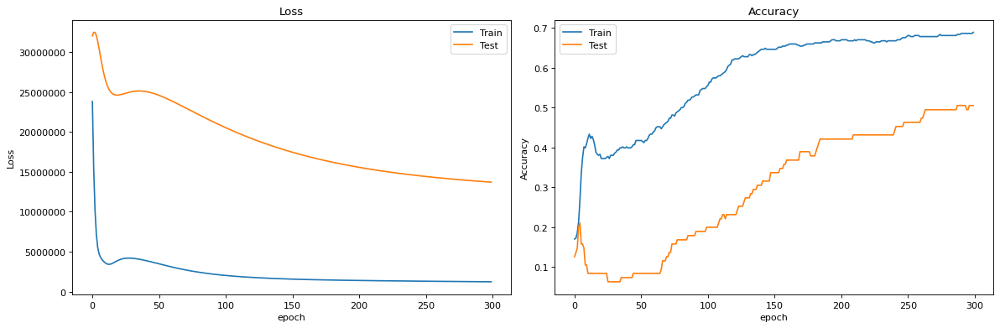

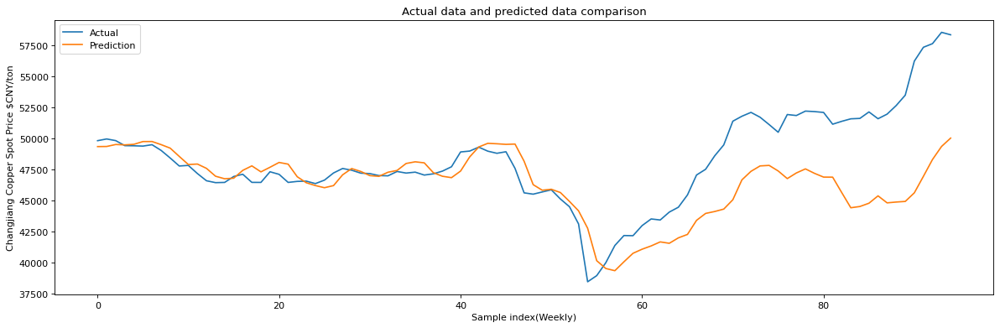

In [37]:
plot_learning_graph(networks[0])
plot_prediction_value(networks[0])

In [17]:
# def accuracy_eva(y_true, y_pred):
    
    
#     total_times = y_true.shape[0]
#     performance = []
    
#     for threshold in range(500,3001,500):
# #         correct_times = 0
        
# #         for i in range(y_true.shape[0]): 

#         correct_times = np.count_nonzero(abs(y_true-y_pred) < threshold)

#         performance.append(correct_times/total_times)

#     return performance

In [18]:
# accuracy_eva(actual, predict)

In [19]:
# networks[0].model.save("final_model_weight.h5")

In [20]:
# import tensorflow as tf

# gpu_options = tf.compat.v1.GPUOptions(per_process_gpu_memory_fraction=0.3)
# sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(gpu_options=gpu_options))
# tf.compat.v1.keras.backend.set_session(sess)

In [21]:
# test_model =tf.keras.models.load_model('final_model_weight.h5')

In [22]:
# test_model